In [1]:
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd
import xarray as xr
import zarr
import fsspec
import cftime 
import nc_time_axis
from calendar import monthrange
import regionmask
import cartopy.crs as ccrs

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

df = pd.read_csv('https://storage.googleapis.com/cmip6/cmip6-zarr-consolidated-stores.csv')


In [2]:
### Model downloaded thi way may not be the same as the models used in the paper due to the database being constantly updated

model = ['ACCESS-CM2', 'CanESM5', 'CESM2', 'CESM2-WACCM', 'CNRM-CM6-1', 'CNRM-ESM2-1', 'EC-Earth3', 'EC-Earth3-Veg', 
         'GFDL-ESM4', 'IPSL-CM6A-LR', 'MIROC6', 'MIROC-ES2L', 'MPI-ESM1-2-HR', 'UKESM1-0-LL']


ds_list = []
for i in range(len(model)):
    df_sm_model = df.query(f"variable_id == 'mrso' & experiment_id == 'piControl' & table_id == 'Lmon'  & source_id == '{model[i]}'")
    ds_mrso = xr.open_zarr(fsspec.get_mapper(df_sm_model.zstore.values[0]), consolidated=True)
    ds_list.append(ds_mrso)

ds_SS126_list = []
for i in range(len(model)):
    df_sm_model = df.query(f"variable_id == 'mrso' & experiment_id == 'ssp126' & table_id == 'Lmon'  & source_id == '{model[i]}'")
    ds_mrso = xr.open_zarr(fsspec.get_mapper(df_sm_model.zstore.values[0]), consolidated=True)
    ds_SS126_list.append(ds_mrso)

ds_SS245_list = []
for i in range(len(model)):
    df_sm_model = df.query(f"variable_id == 'mrso' & experiment_id == 'ssp245' & table_id == 'Lmon'  & source_id == '{model[i]}'")
    ds_mrso = xr.open_zarr(fsspec.get_mapper(df_sm_model.zstore.values[0]), consolidated=True)
    ds_SS245_list.append(ds_mrso)

ds_SS370_list = []
for i in range(len(model)):
    df_sm_model = df.query(f"variable_id == 'mrso' & experiment_id == 'ssp370' & table_id == 'Lmon'  & source_id == '{model[i]}'")
    ds_mrso = xr.open_zarr(fsspec.get_mapper(df_sm_model.zstore.values[-1]), consolidated=True)
    ds_SS370_list.append(ds_mrso)
    
ds_SS585_list = []
for i in range(len(model)):
    df_sm_model = df.query(f"variable_id == 'mrso' & experiment_id == 'ssp585' & table_id == 'Lmon'  & source_id == '{model[i]}'")
    ds_mrso = xr.open_zarr(fsspec.get_mapper(df_sm_model.zstore.values[0]), consolidated=True)
    ds_SS585_list.append(ds_mrso)



C:\Users\lavri\Anaconda3\envs\thesis\lib\site-packages\xarray\coding\times.py:527: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
C:\Users\lavri\Anaconda3\envs\thesis\lib\site-packages\xarray\coding\times.py:119: SerializationWarning: Ambiguous reference date string: 950-01-01. The first value is assumed to be the year hence will be padded with zeros to remove the ambiguity (the padded reference date string is: 0950-01-01). To remove this message, remove the ambiguity by padding your reference date strings with zeros.
  warnings.warn(warning_msg, SerializationWarning)
C:\Users\lavri\Anaconda3\envs\thesis\lib\site-packages\numpy\core\_asarray.py:102: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates ou

In [3]:
### Model Correction for CanESM5

df_sm_model_pc = df.query(f"variable_id == 'mrso' & experiment_id == 'piControl' & table_id == 'Lmon'  & source_id == '{model[1]}'")
ds_mrso_pc = xr.open_zarr(fsspec.get_mapper(df_sm_model_pc.zstore.values[1]), consolidated=True)

df_sm_model_126 = df.query(f"variable_id == 'mrso' & experiment_id == 'ssp126' & table_id == 'Lmon'  & source_id == '{model[1]}'& member_id == 'r8i1p1f1'")
ds_mrso_126 = xr.open_zarr(fsspec.get_mapper(df_sm_model_126.zstore.values[0]), consolidated=True)

df_sm_model_245 = df.query(f"variable_id == 'mrso' & experiment_id == 'ssp245' & table_id == 'Lmon'  & source_id == '{model[1]}'& member_id == 'r8i1p1f1'")
ds_mrso_245 = xr.open_zarr(fsspec.get_mapper(df_sm_model_245.zstore.values[0]), consolidated=True)

df_sm_model_370 = df.query(f"variable_id == 'mrso' & experiment_id == 'ssp370' & table_id == 'Lmon'  & source_id == '{model[1]}'& member_id == 'r8i1p1f1'")
ds_mrso_370 = xr.open_zarr(fsspec.get_mapper(df_sm_model_370.zstore.values[0]), consolidated=True)

df_sm_model_585 = df.query(f"variable_id == 'mrso' & experiment_id == 'ssp585' & table_id == 'Lmon'  & source_id == '{model[1]}' & member_id == 'r8i1p1f1'")
ds_mrso_585 = xr.open_zarr(fsspec.get_mapper(df_sm_model_585.zstore.values[0]), consolidated=True)

ds_list[1] = ds_mrso_pc
ds_SS126_list[1]= ds_mrso_126
ds_SS245_list[1]= ds_mrso_245
ds_SS370_list[1]= ds_mrso_370
ds_SS585_list[1]= ds_mrso_585

In [4]:
df_sm_model_ss370 = df.query(f"variable_id == 'mrso' & experiment_id == 'ssp370' & table_id == 'Lmon'  & source_id == '{model[3]}'")
ds_mrso = xr.open_zarr(fsspec.get_mapper(df_sm_model_ss370.zstore.values[0]), consolidated=True)

ds_SS370_list[3] = ds_mrso
#ds_SS370_list

In [5]:
#ds_list[6]
ds_SS370_list[6]

<xarray.Dataset>
Dimensions:    (lat: 256, bnds: 2, lon: 512, time: 1032)
Coordinates:
  * lat        (lat) float64 -89.46 -88.77 -88.07 -87.37 ... 88.07 88.77 89.46
    lat_bnds   (lat, bnds) float64 dask.array<chunksize=(256, 2), meta=np.ndarray>
  * lon        (lon) float64 0.0 0.7031 1.406 2.109 ... 357.2 357.9 358.6 359.3
    lon_bnds   (lon, bnds) float64 dask.array<chunksize=(512, 2), meta=np.ndarray>
  * time       (time) datetime64[ns] 2015-01-16T12:00:00 ... 2100-12-16T12:00:00
    time_bnds  (time, bnds) datetime64[ns] dask.array<chunksize=(1032, 2), meta=np.ndarray>
Dimensions without coordinates: bnds
Data variables:
    mrso       (time, lat, lon) float32 dask.array<chunksize=(317, 256, 512), meta=np.ndarray>
Attributes: (12/48)
    Conventions:            CF-1.7 CMIP-6.2
    activity_id:            ScenarioMIP AerChemMIP
    branch_method:          standard
    branch_time_in_child:   60265.
    branch_time_in_parent:  60265.
    cmor_version:           3.4.0
    ...                     ...
    title:                  EC-Earth3 output prepared for CMIP6
    tracking_id:            hdl:21.14100/c37ba1d5-1dd4-4c78-b193-db9f0230f510...
    variable_id:            mrso
    variant_label:          r4i1p1f1
    netcdf_tracking_ids:    hdl:21.14100/c37ba1d5-1dd4-4c78-b193-db9f0230f510...
    version_id:             v20200425

In [6]:
area_list = []
for i in range(len(model)):
    df_area_model = df.query(f"variable_id == 'areacella'  & source_id == '{model[i]}'")
    ds_area = xr.open_zarr(fsspec.get_mapper(df_area_model.zstore.values[0]), consolidated=True)
    area_list.append(ds_area)
    
sft_list = []
for i in range(len(model)):
    df_sft_model = df.query(f"variable_id == 'sftlf'  & source_id == '{model[i]}'")
    ds_sft = xr.open_zarr(fsspec.get_mapper(df_sft_model.zstore.values[0]), consolidated=True)
    sft_list.append(ds_sft)

In [7]:
### courtesy of Python for Atmospheric Scientist

import cmocean
import cartopy.crs as ccrs

def apply_mask(darray, sftlf_file, realm):
    """Mask ocean or land using a sftlf (land surface fraction) file.
   
    Args:
      darray (xarray.DataArray): Data to mask
      sftlf_file (str): Land surface fraction file
      realm (str): Realm to mask
   
    """
  
    dset = sftlf_file
  
    if realm == 'land':
        masked_darray = darray.where(dset['sftlf'].data < 50)
    else:
        masked_darray = darray.where(dset['sftlf'].data > 50)   
   
    return masked_darray
    
    
realm = 'ocean'

In [8]:
ar6_land = regionmask.defined_regions.ar6.land

In [9]:
mean_list = []
for i in range(len(model)):
    tsm_year = ds_list[i].mrso.groupby("time.year").mean("time") 
    tsm_year = tsm_year.rename(year="time")
    pC_yearly_mean_80years = ds_list[i].mrso[0:960]

    mask_2D = ar6_land.mask(tsm_year)
    mask_3D = ar6_land.mask_3D(tsm_year)
    
    weights = np.cos(np.deg2rad(tsm_year.lat)) 
    
    tsm_regional = pC_yearly_mean_80years.weighted(mask_3D * weights).mean(dim=("lat", "lon"))  # for each region, monthly mean of the region
    yearly_reg = tsm_regional.groupby('time.year').mean('time')     # yearly average for each region
    mean = yearly_reg.mean(dim='year')
    mean_list.append(mean) 
   

In [10]:
v_list = []
for i in range(len(model)):
    values = mean_list[i].values
    v_list.append(values)
    

C:\Users\lavri\Anaconda3\envs\thesis\lib\site-packages\dask\array\numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


In [11]:
regions = []
for i in range(46):
    reg = []
    for j in range(len(model)):
        reg.append(v_list[j][i])
    
    regions.append(reg)
    
regional_median = []
for i in range(46):
    median = np.quantile(regions[i], 0.5)
    regional_median.append(median)
    
regions_icefree = regions[1:44]

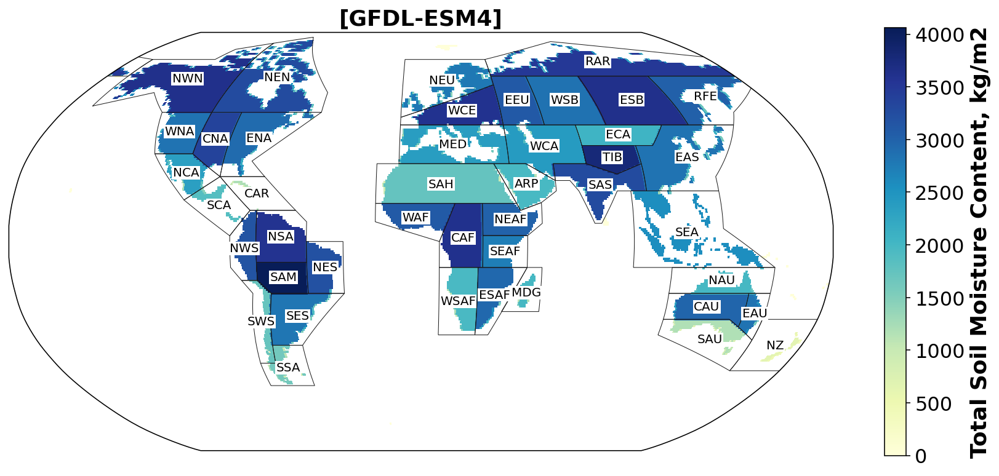

In [12]:
tsm_year = ds_list[6].mrso.groupby("time.year").mean("time") # yearly average
tsm_year = tsm_year.rename(year="time")

mask_2D = ar6_land.mask(tsm_year)
mask_3D = ar6_land.mask_3D(tsm_year)

v_list[8][0] = np.nan
v_list[8][44] = np.nan
v_list[8][45] = np.nan
tsm_weighted_mask = np.zeros(mask_2D.values.shape)
for i in range(46):
    tsm_weighted_mask[mask_2D == i] = v_list[8][i]


tsm_map_masked = sft_list[6]*tsm_weighted_mask/100
tsm_map_masked = apply_mask(tsm_map_masked, sft_list[6], realm)

levels=np.arange(0,2000)
f, ax1 = plt.subplots(subplot_kw=dict(projection=ccrs.Robinson()), figsize=(15, 8))
im = tsm_map_masked.sftlf.plot( ax=ax1, transform=ccrs.PlateCarree(central_longitude=0), cmap='YlGnBu', add_colorbar=False)
#im = tsm_map_masked.sftlf.plot(ax=ax1, transform=ccrs.PlateCarree(central_longitude=0), levels = levels, cmap='coolwarm_r', add_colorbar=False)
#ax1.set_title(f'Yearly Average Total Soil Moisture Content [{model[1]}]', size=18, weight='bold')
ax1.set_title(f'[{model[8]}]', size=18, weight='bold')

region_icefree = np.arange(1,44)
text_kws = dict(color="black", fontsize=10, bbox=dict(pad=0.2, color="w"))
#ar6_land.plot_regions(line_kws=dict(lw=0.5), label='abbrev', text_kws=text_kws);
ar6_land[region_icefree].plot_regions(line_kws=dict(lw=0.5), label='abbrev', text_kws=text_kws);

cb = f.colorbar(im, ax=ax1, shrink=0.8)
cb.ax.tick_params(labelsize=16)
cb.set_label(label='Total Soil Moisture Content, kg/m2', size=18, weight='bold')

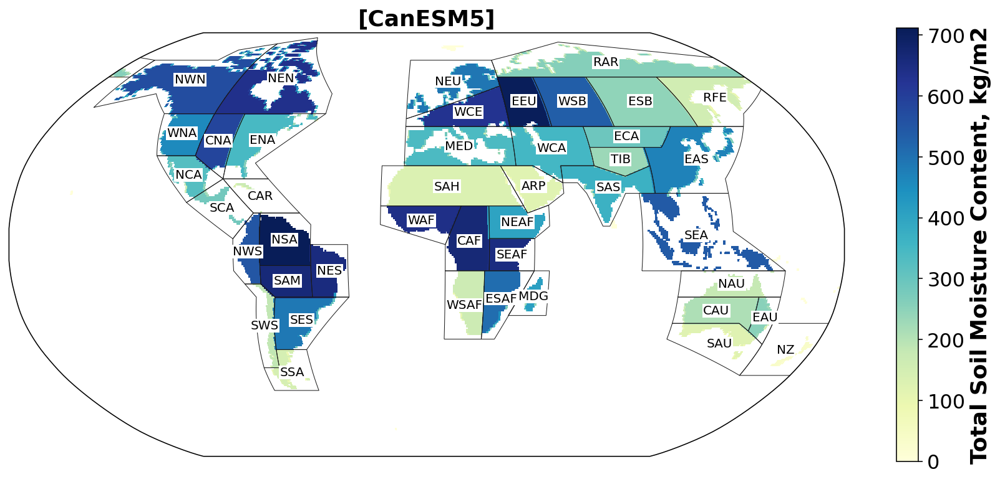

In [13]:
tsm_year = ds_list[6].mrso.groupby("time.year").mean("time") # yearly average
tsm_year = tsm_year.rename(year="time")

mask_2D = ar6_land.mask(tsm_year)
mask_3D = ar6_land.mask_3D(tsm_year)

v_list[1][0] = np.nan
v_list[1][44] = np.nan
v_list[1][45] = np.nan
tsm_weighted_mask = np.zeros(mask_2D.values.shape)
for i in range(46):
    tsm_weighted_mask[mask_2D == i] = v_list[1][i]


tsm_map_masked = sft_list[6]*tsm_weighted_mask/100
tsm_map_masked = apply_mask(tsm_map_masked, sft_list[6], realm)

levels=np.arange(0,2000)
f, ax1 = plt.subplots(subplot_kw=dict(projection=ccrs.Robinson()), figsize=(15, 8))
im = tsm_map_masked.sftlf.plot( ax=ax1, transform=ccrs.PlateCarree(central_longitude=0), cmap='YlGnBu', add_colorbar=False)
#im = tsm_map_masked.sftlf.plot(ax=ax1, transform=ccrs.PlateCarree(central_longitude=0), levels = levels, cmap='coolwarm_r', add_colorbar=False)
#ax1.set_title(f'Yearly Average Total Soil Moisture Content [{model[1]}]', size=18, weight='bold')
ax1.set_title(f'[{model[1]}]', size=18, weight='bold')

region_icefree = np.arange(1,44)
text_kws = dict(color="black", fontsize=10, bbox=dict(pad=0.2, color="w"))
#ar6_land.plot_regions(line_kws=dict(lw=0.5), label='abbrev', text_kws=text_kws);
ar6_land[region_icefree].plot_regions(line_kws=dict(lw=0.5), label='abbrev', text_kws=text_kws);

cb = f.colorbar(im, ax=ax1, shrink=0.8)
cb.ax.tick_params(labelsize=16)
cb.set_label(label='Total Soil Moisture Content, kg/m2', size=18, weight='bold')

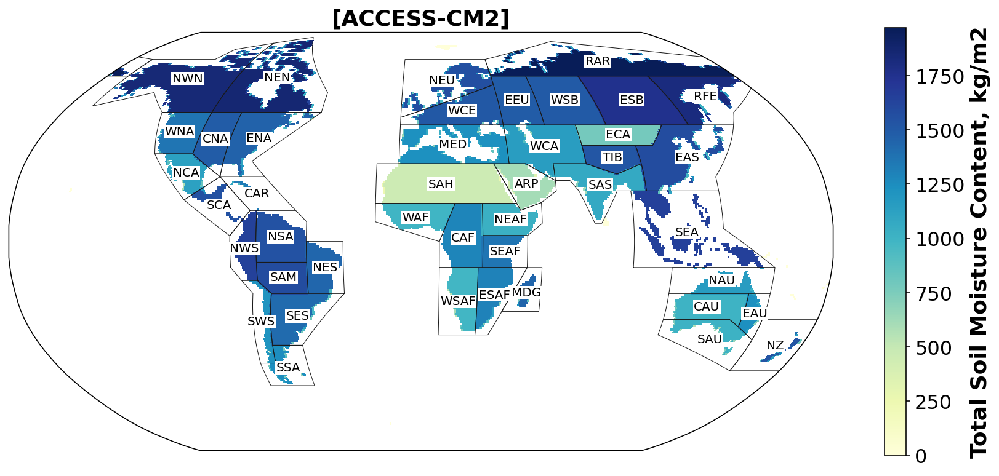

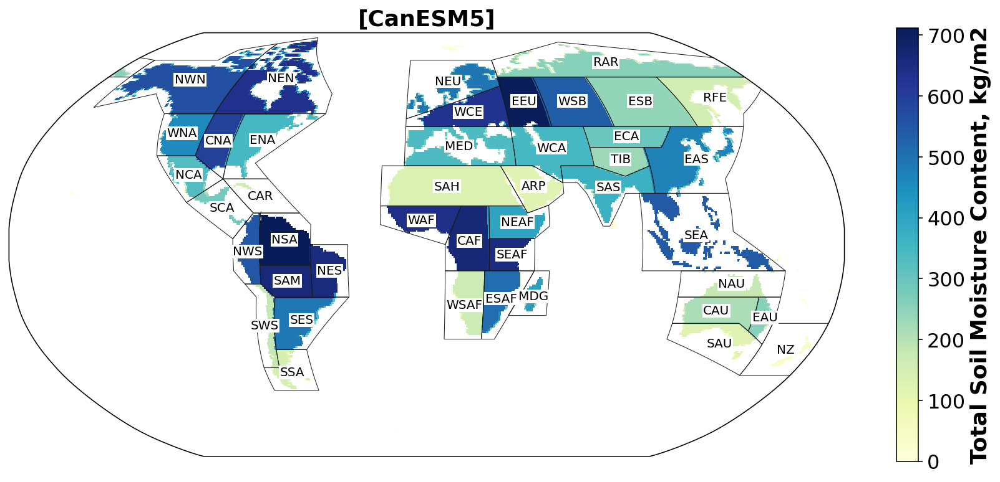

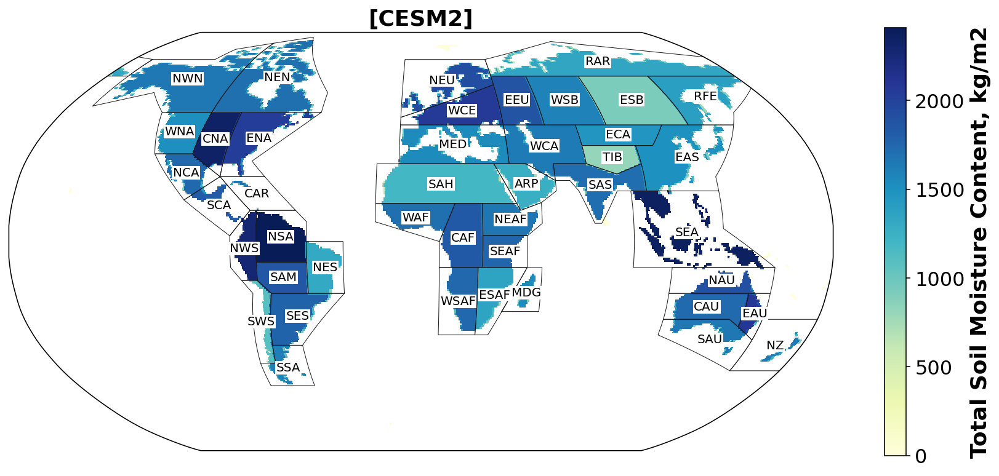

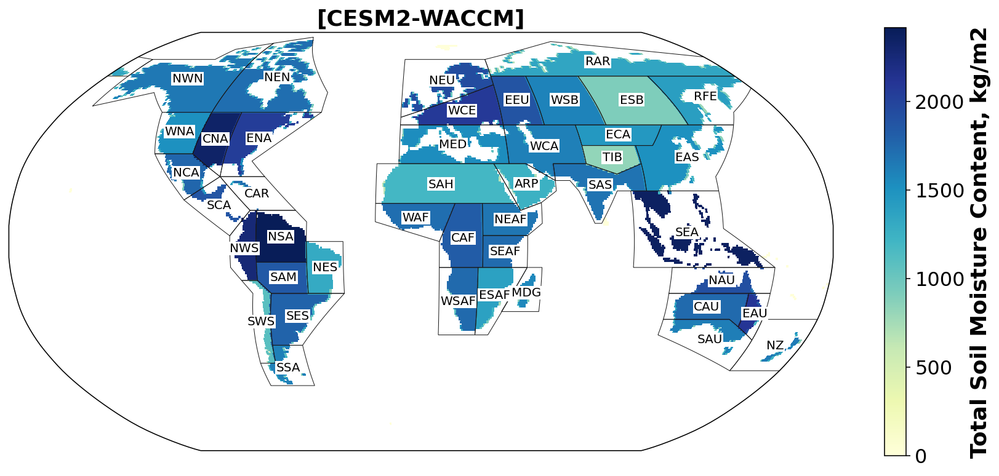

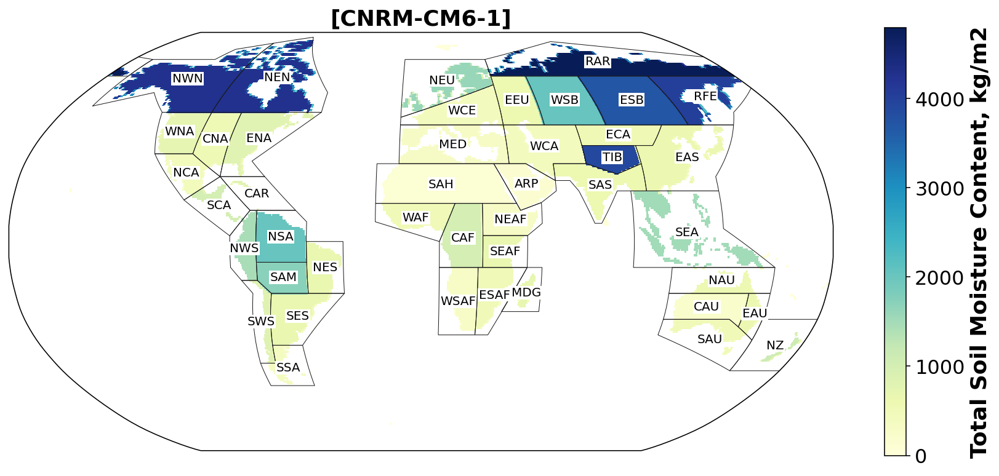

...

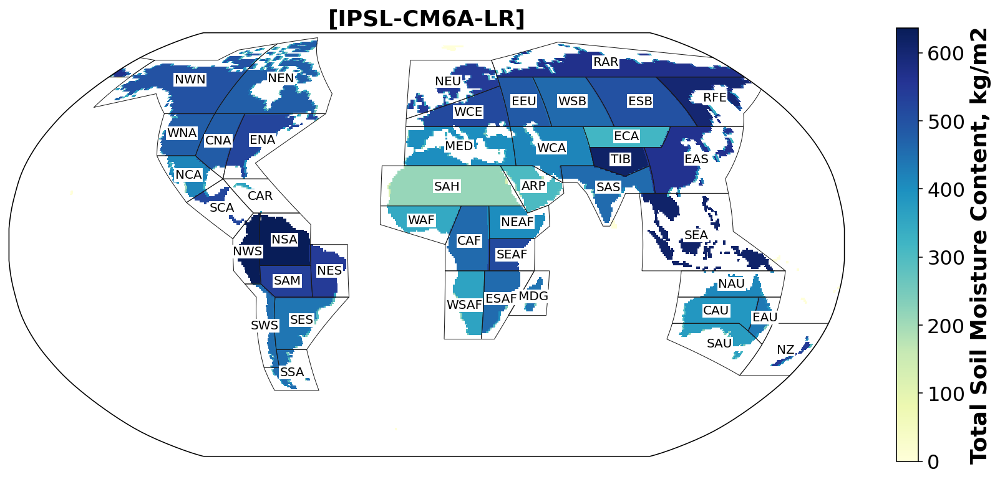

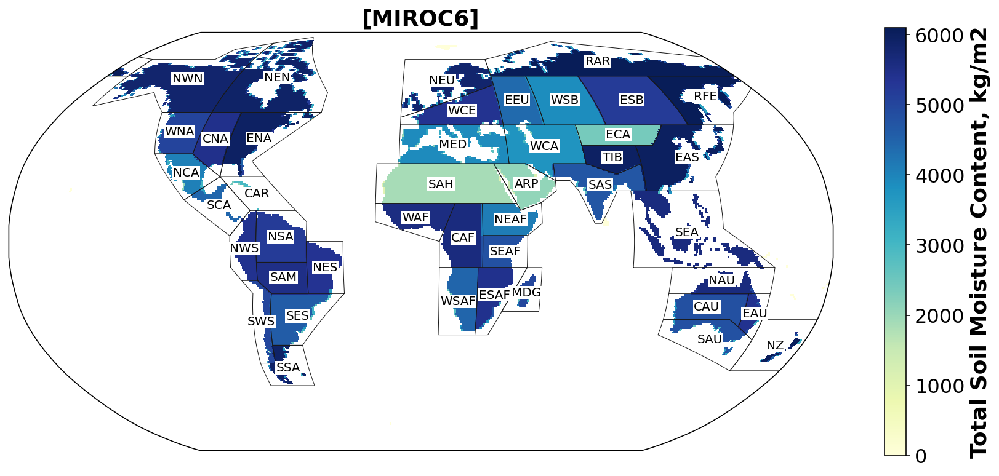

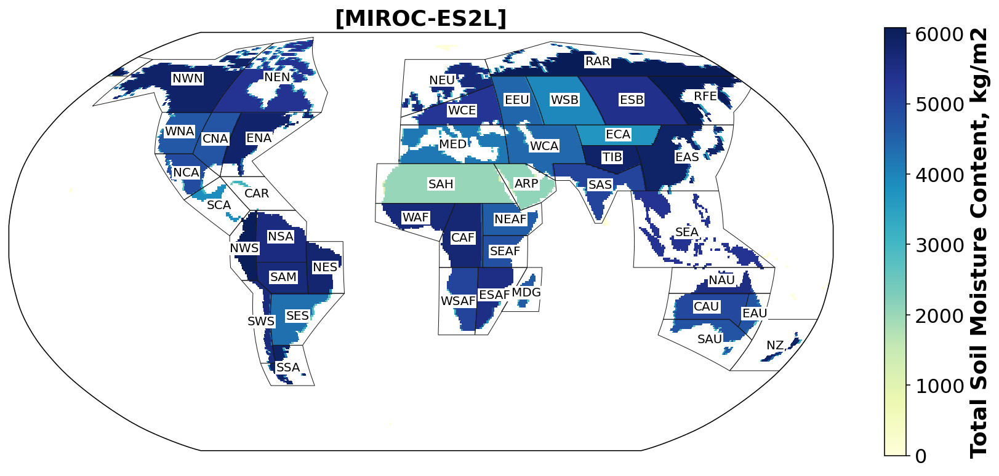

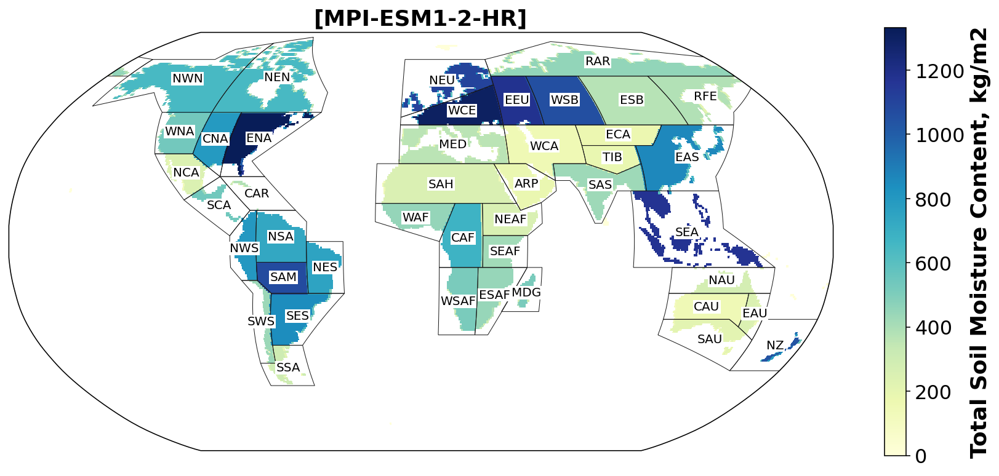

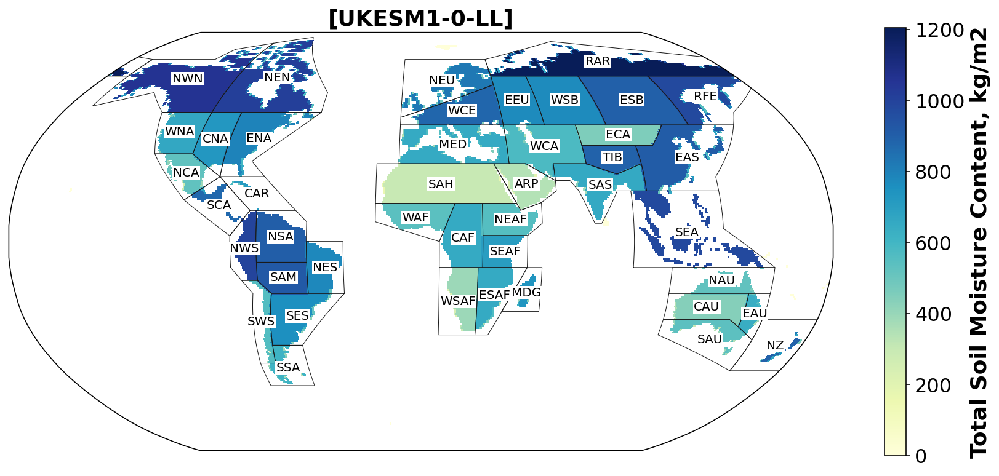

In [14]:
for j in range(len(model)):
    tsm_year = ds_list[6].mrso.groupby("time.year").mean("time") # yearly average
    tsm_year = tsm_year.rename(year="time")

    mask_2D = ar6_land.mask(tsm_year)
    mask_3D = ar6_land.mask_3D(tsm_year)

    v_list[j][0] = np.nan
    v_list[j][44] = np.nan
    v_list[j][45] = np.nan
    tsm_weighted_mask = np.zeros(mask_2D.values.shape)
    for i in range(46):
        tsm_weighted_mask[mask_2D == i] = v_list[j][i]


    tsm_map_masked = sft_list[6]*tsm_weighted_mask/100
    tsm_map_masked = apply_mask(tsm_map_masked, sft_list[6], realm)

    #levels=np.arange(0,2000)
    f, ax1 = plt.subplots(subplot_kw=dict(projection=ccrs.Robinson()), figsize=(15, 8))
    im = tsm_map_masked.sftlf.plot( ax=ax1, transform=ccrs.PlateCarree(central_longitude=0), cmap='YlGnBu', add_colorbar=False)
    #im = tsm_map_masked.sftlf.plot(ax=ax1, transform=ccrs.PlateCarree(central_longitude=0), levels = levels, cmap='coolwarm_r', add_colorbar=False)
    #ax1.set_title(f'Yearly Average Total Soil Moisture Content [{model[6]}]', size=18, weight='bold')

    ax1.set_title(f'[{model[j]}]', size=18, weight='bold')

    region_icefree = np.arange(1,44)
    text_kws = dict(color="black", fontsize=10, bbox=dict(pad=0.2, color="w"))
    #ar6_land.plot_regions(line_kws=dict(lw=0.5), label='abbrev', text_kws=text_kws);
    ar6_land[region_icefree].plot_regions(line_kws=dict(lw=0.5), label='abbrev', text_kws=text_kws);

    cb = f.colorbar(im, ax=ax1, shrink=0.8)
    cb.ax.tick_params(labelsize=16)
    cb.set_label(label='Total Soil Moisture Content, kg/m2', size=18, weight='bold')

C:\Users\lavri\Anaconda3\envs\thesis\lib\site-packages\dask\array\numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


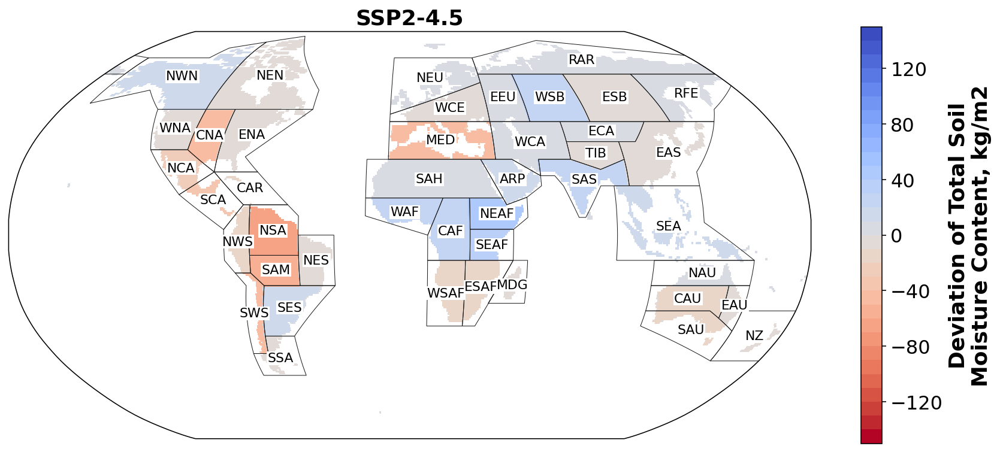

In [15]:
### SSP245

mean_SS245_list = []
for i in range(len(model)):
    tsm_year = ds_SS245_list[i].mrso.loc['2071-01-01':'2101-01-01'].groupby("time.year").mean("time") # yearly average
    tsm_year = tsm_year.rename(year="time")

    mask_2D = ar6_land.mask(tsm_year)
    mask_3D = ar6_land.mask_3D(tsm_year)
    
    weights = np.cos(np.deg2rad(tsm_year.lat)) ### just to estimate the weight

    tsm_regional = ds_SS245_list[i].mrso.loc['2071-01-01':'2101-01-01'].weighted(mask_3D * weights).mean(dim=("lat", "lon"))  # each region, monthly mean of the region
    yearly_reg = tsm_regional.groupby('time.year').mean('time')    # yearly average for each region 
    mean = yearly_reg.mean(dim='year')    # last 30 year's average of yearly average for each region
    mean_SS245_list.append(mean) 

v_SS245_list = []
for i in range(len(model)):
    values = mean_SS245_list[i].values
    v_SS245_list.append(values)
    
dev_SS245 = []
for i in range(len(model)):
    deviation = v_SS245_list[i] - v_list[i]
    dev_SS245.append(deviation)
    
     
regions_SS245_dev = []
for i in range(46):
    reg = []
    for j in range(len(model)):
        reg.append(dev_SS245[j][i])
    
    regions_SS245_dev.append(reg)
    
regional_SS245_dev_median = []
for i in range(46):
    median = np.quantile(regions_SS245_dev[i], 0.5)
    regional_SS245_dev_median.append(median)
    
regional_SS245_dev_median[0] = np.nan

tsm_year = ds_list[6].mrso.groupby("time.year").mean("time") # yearly average
tsm_year = tsm_year.rename(year="time")

mask_2D = ar6_land.mask(tsm_year)
mask_3D = ar6_land.mask_3D(tsm_year)

mrso_SS245_dev_map = np.zeros(mask_2D.values.shape)
for i in range(46):
    mrso_SS245_dev_map[mask_2D == i] = regional_SS245_dev_median[i]
    
mrso_SS245_map = sft_list[6]*mrso_SS245_dev_map/100
mrso_SS245_map = apply_mask(mrso_SS245_map, sft_list[6], realm)
region_icefree = np.arange(1,44)

levels=np.linspace(-150, 150, 31)
f, ax1 = plt.subplots(subplot_kw=dict(projection=ccrs.Robinson()), figsize=(15, 8))
im = mrso_SS245_map.sftlf.plot(ax=ax1, transform=ccrs.PlateCarree(central_longitude=0), levels = levels, cmap='coolwarm_r', add_colorbar=False)
#ax1.set_title('Deviation of the Total Soil Moisture Content in SSP2-4.5\nfrom the Baseline\n[Ensemble Median: 2071-2100]', size=18, weight='bold')
ax1.set_title('SSP2-4.5', size=18, weight='bold')
              
text_kws = dict(color="black", fontsize=11, bbox=dict(pad=0.2, color="w"))
ar6_land[region_icefree].plot_regions(line_kws=dict(lw=0.5), label='abbrev', text_kws=text_kws);

cb = f.colorbar(im, ax=ax1, shrink=0.8)
cb.ax.tick_params(labelsize=16)
cb.set_label(label='Deviation of Total Soil\nMoisture Content, kg/m2', size=18, weight='bold')

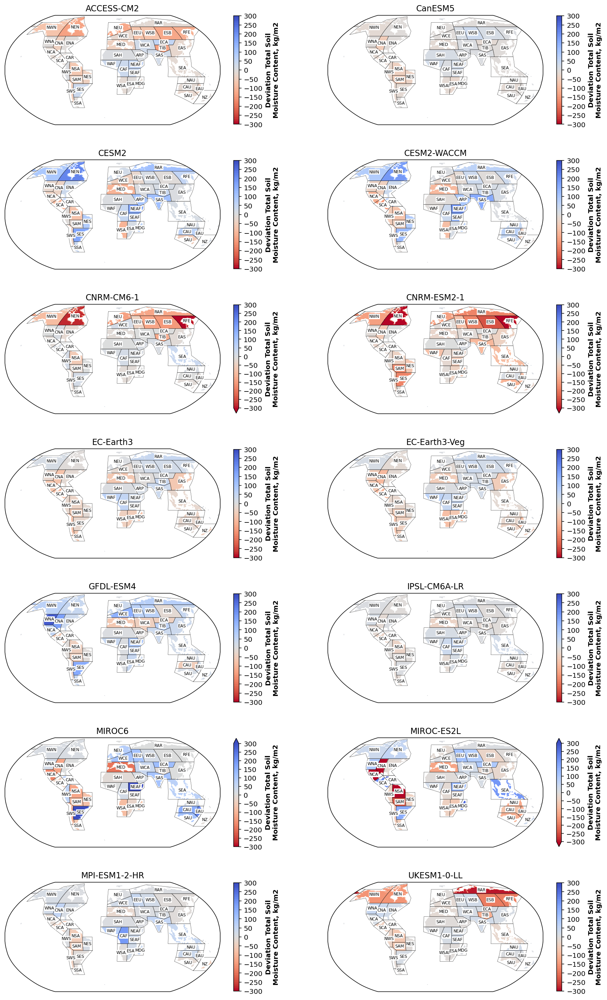

In [16]:
regions_SS245_devT = np.transpose(regions_SS245_dev)

map_245_dev = []
for j in range(len(model)):
    mrso_SS245_dev_map = np.zeros(mask_2D.values.shape)
    regions_SS245_devT[j][0] = np.nan
    regions_SS245_devT[j][44] = np.nan
    regions_SS245_devT[j][45] = np.nan
    
    for i in range(46):
        mrso_SS245_dev_map[mask_2D == i] = regions_SS245_devT[j][i]
    
    mrso_SS245_map = sft_list[6]*mrso_SS245_dev_map/100
    mrso_SS245_map = apply_mask(mrso_SS245_map, sft_list[6], realm)
    
    map_245_dev.append(mrso_SS245_map)

    
region_icefree = np.arange(1,44)
levels=np.linspace(-300, 300, 61)
     
text_kws = dict(color="black", fontsize=6, bbox=dict(pad=0.2, color="w"))
fig, ax = plt.subplots(7, 2, subplot_kw=dict(projection=ccrs.Robinson()), figsize=(30, 40)) #constrained_layout=True)  #, figsize=(15, 8)
plt.subplots_adjust(bottom=0, left=0.5, top=0.5, right=0.9)

for j in range(7):
    im1 = map_245_dev[j*2].sftlf.plot(ax=ax[j][0], transform=ccrs.PlateCarree(central_longitude=0), levels = levels, cmap='coolwarm_r', add_colorbar=False)
    ax[j][0].set_title(f'{model[j*2]}')
    ar6_land[region_icefree].plot_regions(ax=ax[j][0], line_kws=dict(lw=0.3), label='abbrev', text_kws=text_kws)
    
    cb = f.colorbar(im1, ax=ax[j][0], shrink=0.9)
    cb.ax.tick_params(labelsize=10)
    cb.set_label(label='Deviation Total Soil\nMoisture Content, kg/m2', weight='bold',size=10)
    cb.set_ticks(np.linspace(-300, 300, 13))
    
    im2 = map_245_dev[j*2 + 1].sftlf.plot(ax=ax[j][1], transform=ccrs.PlateCarree(central_longitude=0), levels = levels, cmap='coolwarm_r', add_colorbar=False)
    ax[j][1].set_title(f'{model[j*2+1]}')
    ar6_land[region_icefree].plot_regions(ax=ax[j][1], line_kws=dict(lw=0.3), label='abbrev', text_kws=text_kws)

    cb = f.colorbar(im2, ax=ax[j][1], shrink=0.9)
    cb.ax.tick_params(labelsize=10)
    cb.set_label(label='Deviation Total Soil\nMoisture Content, kg/m2', weight='bold',size=10)
    cb.set_ticks(np.linspace(-300, 300, 13))
    
plt.savefig('SS245_allmodel_dev.png', bbox_inches='tight', dpi=250)


C:\Users\lavri\Anaconda3\envs\thesis\lib\site-packages\dask\array\numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


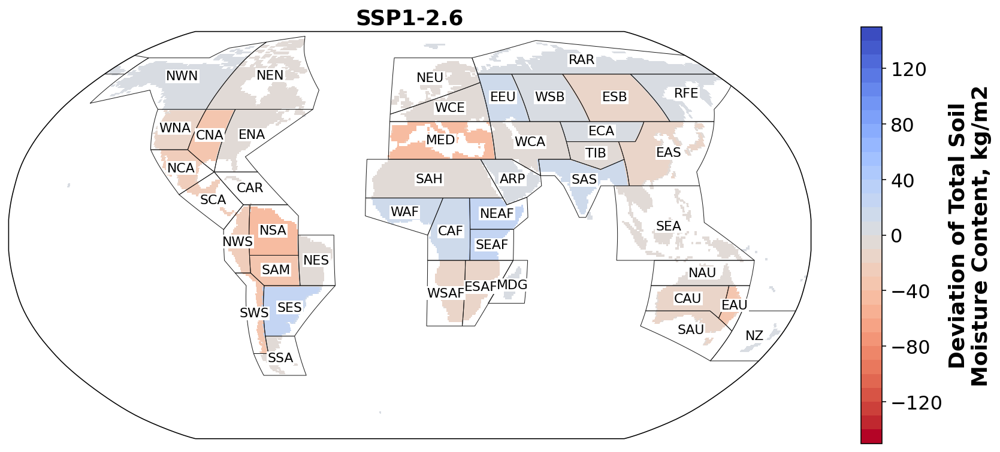

In [17]:
### SSP126

mean_SS126_list = []
for i in range(len(model)):
    tsm_year = ds_SS126_list[i].mrso.loc['2071-01-01':'2101-01-01'].groupby("time.year").mean("time") # yearly average
    tsm_year = tsm_year.rename(year="time")

    mask_2D = ar6_land.mask(tsm_year)
    mask_3D = ar6_land.mask_3D(tsm_year)
    
    weights = np.cos(np.deg2rad(tsm_year.lat)) ### just to estimate the weight

    tsm_regional = ds_SS126_list[i].mrso.loc['2071-01-01':'2101-01-01'].weighted(mask_3D * weights).mean(dim=("lat", "lon"))  # each region, monthly mean of the region
    yearly_reg = tsm_regional.groupby('time.year').mean('time')     # average of yearly average for each region
    mean = yearly_reg.mean(dim='year')
    mean_SS126_list.append(mean) 

v_SS126_list = []
for i in range(len(model)):
    values = mean_SS126_list[i].values
    v_SS126_list.append(values)
    
dev_SS126 = []
for i in range(len(model)):
    deviation = v_SS126_list[i] - v_list[i]
    dev_SS126.append(deviation)
    
     
regions_SS126_dev = []
for i in range(46):
    reg = []
    for j in range(len(model)):
        reg.append(dev_SS126[j][i])
    
    regions_SS126_dev.append(reg)
    
regional_SS126_dev_median = []
for i in range(46):
    median = np.quantile(regions_SS126_dev[i], 0.5)
    regional_SS126_dev_median.append(median)

regional_SS126_dev_median[0] = np.nan

tsm_year = ds_list[6].mrso.groupby("time.year").mean("time") # yearly average
tsm_year = tsm_year.rename(year="time")

mask_2D = ar6_land.mask(tsm_year)
mask_3D = ar6_land.mask_3D(tsm_year)

mrso_SS126_dev_map = np.zeros(mask_2D.values.shape)
for i in range(46):
    mrso_SS126_dev_map[mask_2D == i] = regional_SS126_dev_median[i]
    
mrso_SS126_map = sft_list[6]*mrso_SS126_dev_map/100
mrso_SS126_map = apply_mask(mrso_SS126_map, sft_list[6], realm)
region_icefree = np.arange(1,44)

levels=np.linspace(-150, 150, 31)
f, ax1 = plt.subplots(subplot_kw=dict(projection=ccrs.Robinson()), figsize=(15, 8))
im = mrso_SS126_map.sftlf.plot(ax=ax1, transform=ccrs.PlateCarree(central_longitude=0), levels = levels, cmap='coolwarm_r', add_colorbar=False)
#ax1.set_title('Deviation of the Total Soil Moisture Content in SSP1-2.6\nfrom the Baseline\n[Ensemble Median: 2071-2100]', size=18, weight='bold')
ax1.set_title('SSP1-2.6', size=18, weight='bold')
              
text_kws = dict(color="black", fontsize=11, bbox=dict(pad=0.2, color="w"))
ar6_land[region_icefree].plot_regions(line_kws=dict(lw=0.5), label='abbrev', text_kws=text_kws);

cb = f.colorbar(im, ax=ax1, shrink=0.8)
cb.ax.tick_params(labelsize=16)
cb.set_label(label='Deviation of Total Soil\nMoisture Content, kg/m2', size=18, weight='bold')

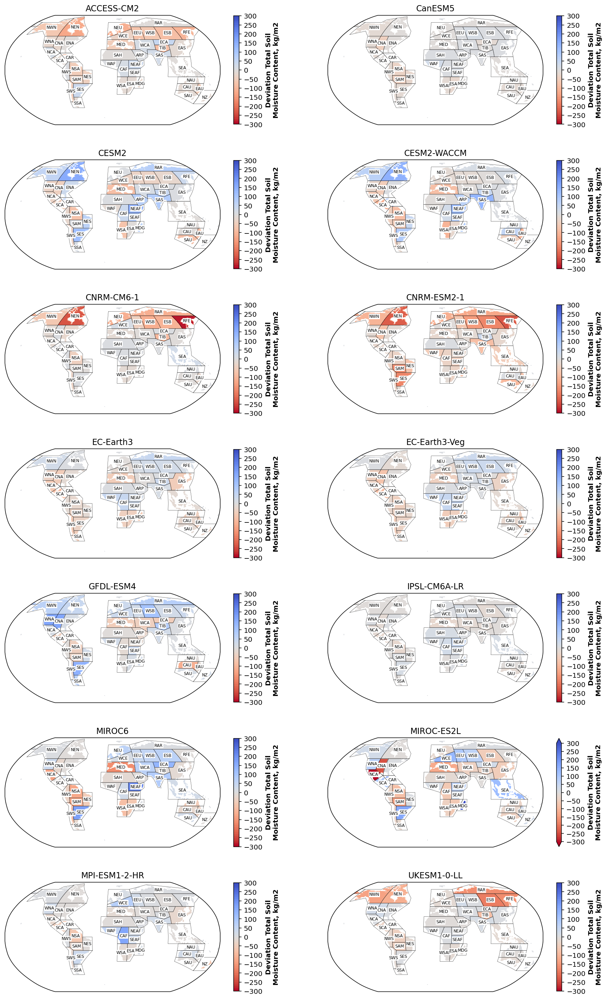

In [18]:
regions_SS126_devT = np.transpose(regions_SS126_dev)

map_126_dev = []
for j in range(len(model)):
    mrso_SS126_dev_map = np.zeros(mask_2D.values.shape)
    regions_SS126_devT[j][0] = np.nan
    regions_SS126_devT[j][44] = np.nan
    regions_SS126_devT[j][45] = np.nan
    
    for i in range(46):
        mrso_SS126_dev_map[mask_2D == i] = regions_SS126_devT[j][i]
    
    mrso_SS126_map = sft_list[6]*mrso_SS126_dev_map/100
    mrso_SS126_map = apply_mask(mrso_SS126_map, sft_list[6], realm)
    
    map_126_dev.append(mrso_SS126_map)

region_icefree = np.arange(1,44)
levels=np.linspace(-300, 300, 61)

text_kws = dict(color="black", fontsize=6, bbox=dict(pad=0.2, color="w"))
fig, ax = plt.subplots(7, 2, subplot_kw=dict(projection=ccrs.Robinson()), figsize=(30, 40)) #constrained_layout=True)  #, figsize=(15, 8)
plt.subplots_adjust(bottom=0, left=0.5, top=0.5, right=0.9)

for j in range(7):
    im1 = map_126_dev[j*2].sftlf.plot(ax=ax[j][0], transform=ccrs.PlateCarree(central_longitude=0), levels = levels, cmap='coolwarm_r', add_colorbar=False)
    ax[j][0].set_title(f'{model[j*2]}')
    ar6_land[region_icefree].plot_regions(ax=ax[j][0], line_kws=dict(lw=0.3), label='abbrev', text_kws=text_kws)
    
    cb = f.colorbar(im1, ax=ax[j][0], shrink=0.9)
    cb.ax.tick_params(labelsize=10)
    cb.set_label(label='Deviation Total Soil\nMoisture Content, kg/m2', weight='bold',size=10)
    cb.set_ticks(np.linspace(-300, 300, 13))
     
    im2 = map_126_dev[j*2 + 1].sftlf.plot(ax=ax[j][1], transform=ccrs.PlateCarree(central_longitude=0), levels = levels, cmap='coolwarm_r', add_colorbar=False)
    ax[j][1].set_title(f'{model[j*2+1]}')
    ar6_land[region_icefree].plot_regions(ax=ax[j][1], line_kws=dict(lw=0.3), label='abbrev', text_kws=text_kws)

    cb = f.colorbar(im2, ax=ax[j][1], shrink=0.9)
    cb.ax.tick_params(labelsize=10)
    cb.set_label(label='Deviation Total Soil\nMoisture Content, kg/m2', weight='bold',size=10)
    cb.set_ticks(np.linspace(-300, 300, 13))
    
    
plt.savefig('SS126_allmodel_dev.png', bbox_inches='tight', dpi=250)

In [16]:
### SSP370

mean_SS370_list = []
for i in range(len(model)):
    tsm_year = ds_SS370_list[i].mrso.loc['2071-01-01':'2101-01-01'].groupby("time.year").mean("time") # yearly average
    tsm_year = tsm_year.rename(year="time")

    mask_2D = ar6_land.mask(tsm_year)
    mask_3D = ar6_land.mask_3D(tsm_year)
    
    weights = np.cos(np.deg2rad(tsm_year.lat)) ### just to estimate the weight

    tsm_regional = ds_SS370_list[i].mrso.loc['2071-01-01':'2101-01-01'].weighted(mask_3D * weights).mean(dim=("lat", "lon"))  # each region, monthly mean of the region
    yearly_reg = tsm_regional.groupby('time.year').mean('time')     # average of yearly average for each region
    mean = yearly_reg.mean(dim='year')
    mean_SS370_list.append(mean) 

v_SS370_list = []
for i in range(len(model)):
    values = mean_SS370_list[i].values
    v_SS370_list.append(values)
    
dev_SS370 = []
for i in range(len(model)):
    deviation = v_SS370_list[i] - v_list[i]
    dev_SS370.append(deviation)
    
     
regions_SS370_dev = []
for i in range(46):
    reg = []
    for j in range(len(model)):
        reg.append(dev_SS370[j][i])
    
    regions_SS370_dev.append(reg)
    
regional_SS370_dev_median = []
for i in range(46):
    median = np.quantile(regions_SS370_dev[i], 0.5)
    regional_SS370_dev_median.append(median)

regional_SS370_dev_median[0] = np.nan

C:\Users\lavri\Anaconda3\envs\thesis\lib\site-packages\dask\array\numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


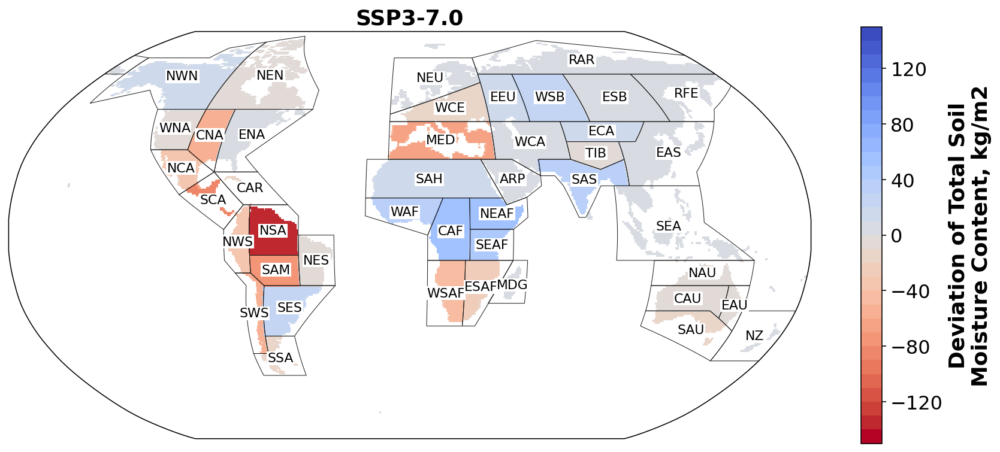

In [17]:
tsm_year = ds_list[6].mrso.groupby("time.year").mean("time") # yearly average
tsm_year = tsm_year.rename(year="time")

mask_2D = ar6_land.mask(tsm_year)
mask_3D = ar6_land.mask_3D(tsm_year)

mrso_SS370_dev_map = np.zeros(mask_2D.values.shape)
for i in range(46):
    mrso_SS370_dev_map[mask_2D == i] = regional_SS370_dev_median[i]
    
mrso_SS370_map = sft_list[6]*mrso_SS370_dev_map/100
mrso_SS370_map = apply_mask(mrso_SS370_map, sft_list[6], realm)
region_icefree = np.arange(1,44)

levels=np.linspace(-150, 150, 31)
f, ax1 = plt.subplots(subplot_kw=dict(projection=ccrs.Robinson()), figsize=(15, 8))
im = mrso_SS370_map.sftlf.plot(ax=ax1, transform=ccrs.PlateCarree(central_longitude=0), levels = levels, cmap='coolwarm_r', add_colorbar=False)
#ax1.set_title('Deviation of the Total Soil Moisture Content in SSP3-7.0\nfrom the Baseline\n[Ensemble Median: 2071-2100]', size=18, weight='bold')
ax1.set_title('SSP3-7.0', size=18, weight='bold')
              
text_kws = dict(color="black", fontsize=11, bbox=dict(pad=0.2, color="w"))
ar6_land[region_icefree].plot_regions(line_kws=dict(lw=0.5), label='abbrev', text_kws=text_kws);

cb = f.colorbar(im, ax=ax1, shrink=0.8)
cb.ax.tick_params(labelsize=16)
cb.set_label(label='Deviation of Total Soil\nMoisture Content, kg/m2', size=18, weight='bold')

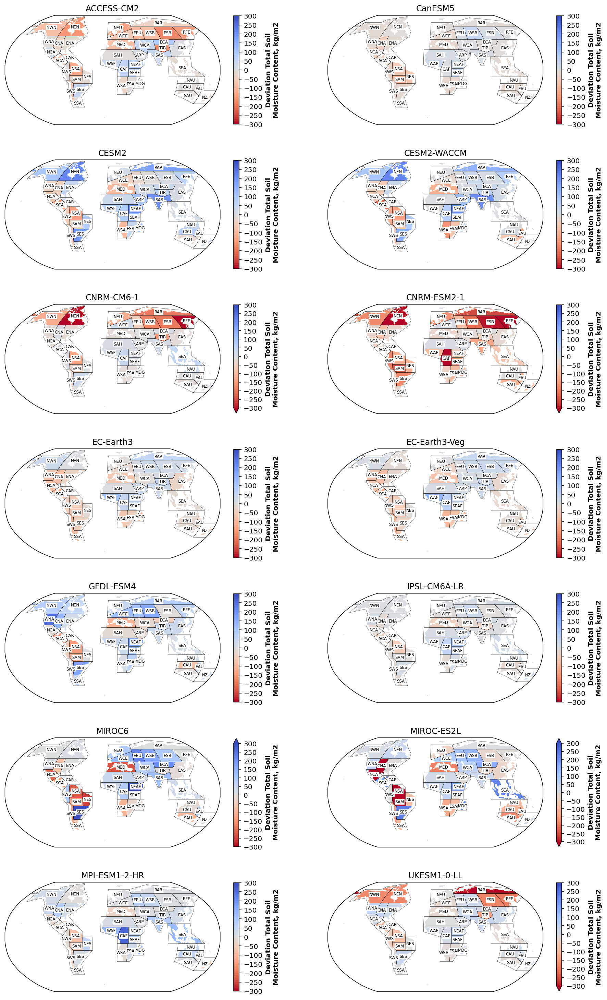

In [47]:
regions_SS370_devT = np.transpose(regions_SS370_dev)

map_370_dev = []
for j in range(len(model)):
    mrso_SS370_dev_map = np.zeros(mask_2D.values.shape)
    regions_SS370_devT[j][0] = np.nan
    regions_SS370_devT[j][44] = np.nan
    regions_SS370_devT[j][45] = np.nan
    
    for i in range(46):
        mrso_SS370_dev_map[mask_2D == i] = regions_SS370_devT[j][i]
    
    mrso_SS370_map = sft_list[6]*mrso_SS370_dev_map/100
    mrso_SS370_map = apply_mask(mrso_SS370_map, sft_list[6], realm)
    
    map_370_dev.append(mrso_SS370_map)

region_icefree = np.arange(1,44)
levels=np.linspace(-300, 300, 61)

text_kws = dict(color="black", fontsize=6, bbox=dict(pad=0.2, color="w"))
fig, ax = plt.subplots(7, 2, subplot_kw=dict(projection=ccrs.Robinson()), figsize=(30, 40)) #constrained_layout=True)  #, figsize=(15, 8)
plt.subplots_adjust(bottom=0, left=0.5, top=0.5, right=0.9)

for j in range(7):
    im1 = map_370_dev[j*2].sftlf.plot(ax=ax[j][0], transform=ccrs.PlateCarree(central_longitude=0), levels = levels, cmap='coolwarm_r', add_colorbar=False)
    ax[j][0].set_title(f'{model[j*2]}')
    ar6_land[region_icefree].plot_regions(ax=ax[j][0], line_kws=dict(lw=0.3), label='abbrev', text_kws=text_kws)
    
    cb = f.colorbar(im1, ax=ax[j][0], shrink=0.9)
    cb.ax.tick_params(labelsize=10)
    cb.set_label(label='Deviation Total Soil\nMoisture Content, kg/m2', weight='bold',size=10)
    cb.set_ticks(np.linspace(-300, 300, 13))
     
    im2 = map_370_dev[j*2 + 1].sftlf.plot(ax=ax[j][1], transform=ccrs.PlateCarree(central_longitude=0), levels = levels, cmap='coolwarm_r', add_colorbar=False)
    ax[j][1].set_title(f'{model[j*2+1]}')
    ar6_land[region_icefree].plot_regions(ax=ax[j][1], line_kws=dict(lw=0.3), label='abbrev', text_kws=text_kws)

    cb = f.colorbar(im2, ax=ax[j][1], shrink=0.9)
    cb.ax.tick_params(labelsize=10)
    cb.set_label(label='Deviation Total Soil\nMoisture Content, kg/m2', weight='bold',size=10)
    cb.set_ticks(np.linspace(-300, 300, 13))
    
    
plt.savefig('SS370_allmodel_dev.png', bbox_inches='tight', dpi=250)

In [14]:
### SSP585

mean_SS585_list = []
for i in range(len(model)):
    tsm_year = ds_SS585_list[i].mrso.loc['2071-01-01':'2101-01-01'].groupby("time.year").mean("time") # yearly average
    tsm_year = tsm_year.rename(year="time")

    mask_2D = ar6_land.mask(tsm_year)
    mask_3D = ar6_land.mask_3D(tsm_year)
    
    weights = np.cos(np.deg2rad(tsm_year.lat)) ### just to estimate the weight

    tsm_regional = ds_SS585_list[i].mrso.loc['2071-01-01':'2101-01-01'].weighted(mask_3D * weights).mean(dim=("lat", "lon"))  # each region, monthly mean of the region
    yearly_reg = tsm_regional.groupby('time.year').mean('time')     # average of yearly average for each region
    mean = yearly_reg.mean(dim='year')
    mean_SS585_list.append(mean) 

v_SS585_list = []
for i in range(len(model)):
    values = mean_SS585_list[i].values
    v_SS585_list.append(values)
    
dev_SS585 = []
for i in range(len(model)):
    deviation = v_SS585_list[i] - v_list[i]
    dev_SS585.append(deviation)
    
     
regions_SS585_dev = []
for i in range(46):
    reg = []
    for j in range(len(model)):
        reg.append(dev_SS585[j][i])
    
    regions_SS585_dev.append(reg)
    
regional_SS585_dev_median = []
for i in range(46):
    median = np.quantile(regions_SS585_dev[i], 0.5)
    regional_SS585_dev_median.append(median)

regional_SS585_dev_median[0] = np.nan
    

C:\Users\lavri\Anaconda3\envs\thesis\lib\site-packages\dask\array\numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


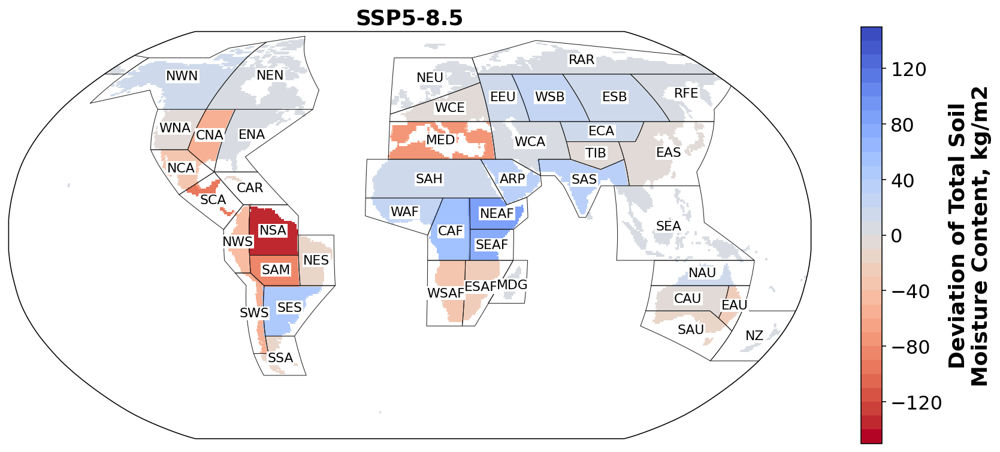

In [15]:
tsm_year = ds_list[6].mrso.groupby("time.year").mean("time") # yearly average
tsm_year = tsm_year.rename(year="time")

mask_2D = ar6_land.mask(tsm_year)
mask_3D = ar6_land.mask_3D(tsm_year)

mrso_SS585_dev_map = np.zeros(mask_2D.values.shape)
for i in range(46):
    mrso_SS585_dev_map[mask_2D == i] = regional_SS585_dev_median[i]
    
mrso_SS585_map = sft_list[6]*mrso_SS585_dev_map/100
mrso_SS585_map = apply_mask(mrso_SS585_map, sft_list[6], realm)
region_icefree = np.arange(1,44)

levels=np.linspace(-150, 150, 31)
f, ax1 = plt.subplots(subplot_kw=dict(projection=ccrs.Robinson()), figsize=(15, 8))
im = mrso_SS585_map.sftlf.plot(ax=ax1, transform=ccrs.PlateCarree(central_longitude=0), levels = levels, cmap='coolwarm_r', add_colorbar=False)
#ax1.set_title('Deviation of the Total Soil Moisture Content in SSP5-8.5\nfrom the Baseline\n[Ensemble Median: 2071-2100]', size=18, weight='bold')
ax1.set_title('SSP5-8.5', size=18, weight='bold')
              
text_kws = dict(color="black", fontsize=11, bbox=dict(pad=0.2, color="w"))
ar6_land[region_icefree].plot_regions(line_kws=dict(lw=0.5), label='abbrev', text_kws=text_kws);

cb = f.colorbar(im, ax=ax1, shrink=0.8)
cb.ax.tick_params(labelsize=16)
cb.set_label(label='Deviation of Total Soil\nMoisture Content, kg/m2', size=18, weight='bold')

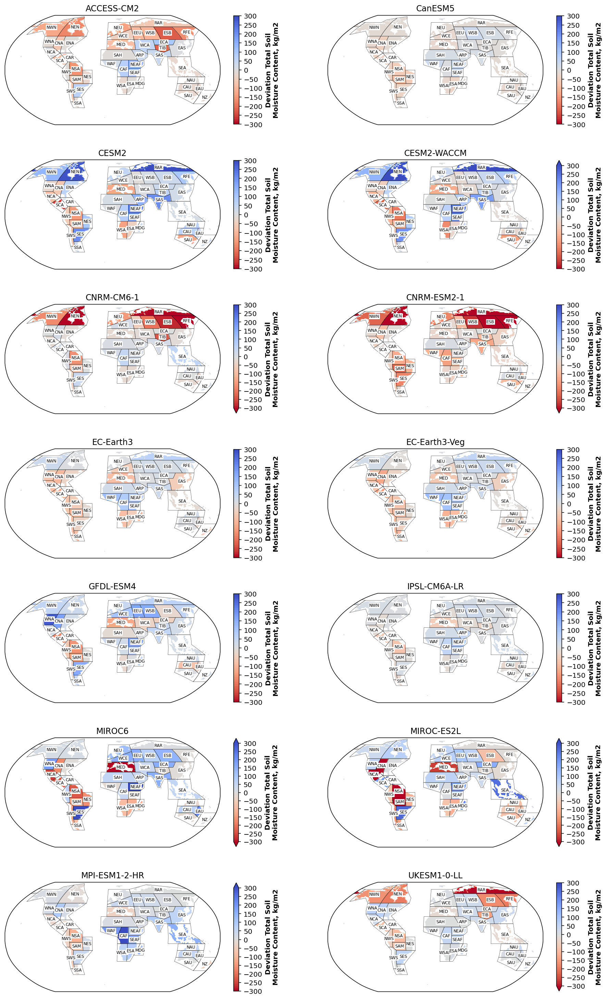

In [35]:
regions_SS585_devT = np.transpose(regions_SS585_dev)

map_585_dev = []
for j in range(len(model)):
    mrso_SS585_dev_map = np.zeros(mask_2D.values.shape)
    regions_SS585_devT[j][0] = np.nan
    regions_SS585_devT[j][44] = np.nan
    regions_SS585_devT[j][45] = np.nan
    
    for i in range(46):
        mrso_SS585_dev_map[mask_2D == i] = regions_SS585_devT[j][i]
    
    mrso_SS585_map = sft_list[6]*mrso_SS585_dev_map/100
    mrso_SS585_map = apply_mask(mrso_SS585_map, sft_list[6], realm)
    
    map_585_dev.append(mrso_SS585_map)

region_icefree = np.arange(1,44)
levels=np.linspace(-300, 300, 61)

text_kws = dict(color="black", fontsize=6, bbox=dict(pad=0.2, color="w"))
fig, ax = plt.subplots(7, 2, subplot_kw=dict(projection=ccrs.Robinson()), figsize=(30, 40)) #constrained_layout=True)  #, figsize=(15, 8)
plt.subplots_adjust(bottom=0, left=0.5, top=0.5, right=0.9)

for j in range(7):
    im1 = map_585_dev[j*2].sftlf.plot(ax=ax[j][0], transform=ccrs.PlateCarree(central_longitude=0), levels = levels, cmap='coolwarm_r', add_colorbar=False)
    ax[j][0].set_title(f'{model[j*2]}')
    ar6_land[region_icefree].plot_regions(ax=ax[j][0], line_kws=dict(lw=0.3), label='abbrev', text_kws=text_kws)
    
    cb = f.colorbar(im1, ax=ax[j][0], shrink=0.9)
    cb.ax.tick_params(labelsize=10)
    cb.set_label(label='Deviation Total Soil\nMoisture Content, kg/m2', weight='bold',size=10)
    cb.set_ticks(np.linspace(-300, 300, 13))
     
    im2 = map_585_dev[j*2 + 1].sftlf.plot(ax=ax[j][1], transform=ccrs.PlateCarree(central_longitude=0), levels = levels, cmap='coolwarm_r', add_colorbar=False)
    ax[j][1].set_title(f'{model[j*2+1]}')
    ar6_land[region_icefree].plot_regions(ax=ax[j][1], line_kws=dict(lw=0.3), label='abbrev', text_kws=text_kws)

    cb = f.colorbar(im2, ax=ax[j][1], shrink=0.9)
    cb.ax.tick_params(labelsize=10)
    cb.set_label(label='Deviation Total Soil\nMoisture Content, kg/m2', weight='bold',size=10)
    cb.set_ticks(np.linspace(-300, 300, 13))
    
    
plt.savefig('SS585_allmodel_dev.png', bbox_inches='tight', dpi=250)

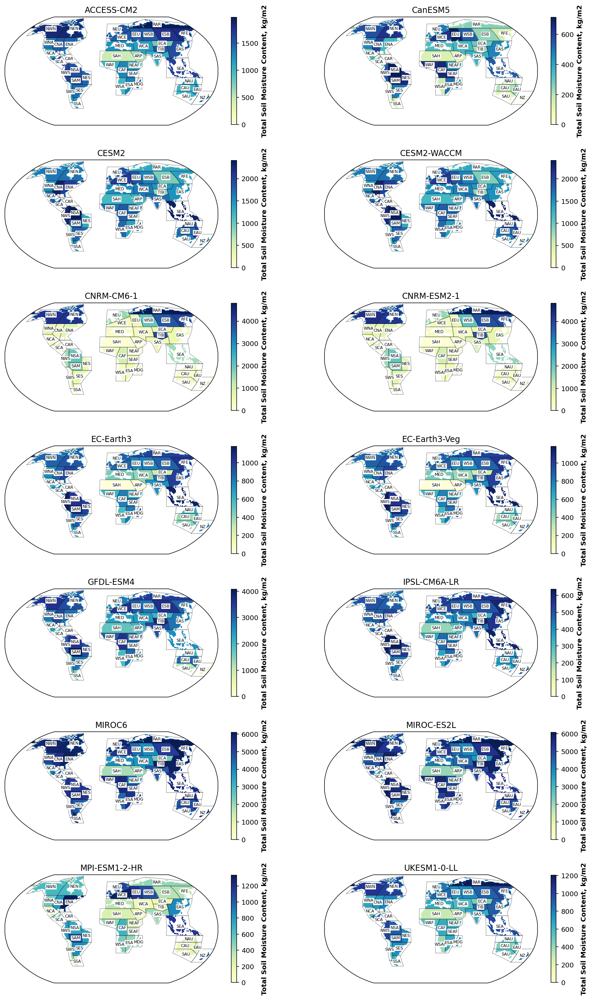

In [242]:
map_pc_model = []
for j in range(len(model)):
    tsm_year = ds_list[6].mrso.groupby("time.year").mean("time") # yearly average
    tsm_year = tsm_year.rename(year="time")

    mask_2D = ar6_land.mask(tsm_year)
    mask_3D = ar6_land.mask_3D(tsm_year)

    v_list[j][0] = np.nan
    v_list[j][44] = np.nan
    v_list[j][45] = np.nan
    tsm_weighted_mask = np.zeros(mask_2D.values.shape)
    for i in range(46):
        tsm_weighted_mask[mask_2D == i] = v_list[j][i]

    mrso_pc_map = sft_list[6]*tsm_weighted_mask/100
    mrso_pc_map = apply_mask(mrso_pc_map, sft_list[6], realm)
    
    map_pc_model.append(mrso_pc_map)

region_icefree = np.arange(1,44)
#levels=np.linspace(-300, 300, 61)

text_kws = dict(color="black", fontsize=6, bbox=dict(pad=0.2, color="w"))
fig, ax = plt.subplots(7, 2, subplot_kw=dict(projection=ccrs.Robinson()), figsize=(30, 40)) #constrained_layout=True)  #, figsize=(15, 8)
plt.subplots_adjust(bottom=0, left=0.5, top=0.5, right=0.9)

for j in range(7):   #levels = levels,
    im1 = map_pc_model[j*2].sftlf.plot(ax=ax[j][0], transform=ccrs.PlateCarree(central_longitude=0), cmap='YlGnBu', add_colorbar=False)
    ax[j][0].set_title(f'{model[j*2]}')
    ar6_land[region_icefree].plot_regions(ax=ax[j][0], line_kws=dict(lw=0.3), label='abbrev', text_kws=text_kws)
    
    cb = f.colorbar(im1, ax=ax[j][0], shrink=0.9)
    cb.ax.tick_params(labelsize=10)
    cb.set_label(label='Total Soil Moisture Content, kg/m2', weight='bold',size=10)
    #cb.set_ticks(np.linspace(-300, 300, 13))
     
    im2 = map_pc_model[j*2 + 1].sftlf.plot(ax=ax[j][1], transform=ccrs.PlateCarree(central_longitude=0), cmap='YlGnBu', add_colorbar=False)
    ax[j][1].set_title(f'{model[j*2+1]}')
    ar6_land[region_icefree].plot_regions(ax=ax[j][1], line_kws=dict(lw=0.3), label='abbrev', text_kws=text_kws)

    cb = f.colorbar(im2, ax=ax[j][1], shrink=0.9)
    cb.ax.tick_params(labelsize=10)
    cb.set_label(label='Total Soil Moisture Content, kg/m2', weight='bold',size=10)
    #cb.set_ticks(np.linspace(-300, 300, 13))
    
    
plt.savefig('pc_allmodel_model.png', bbox_inches='tight', dpi=250)

# Time of Emergence

In [19]:
# Demonstration of obtaining the Time of Emergence for a particular region in an ESM under a warming scenario

ds_585_NWN = ds_SS585_list[0].mrso.loc['2021-01-01':'2101-01-01']   
time = ds_585_NWN.time.dt.date.values
year_once=np.arange(2021, 2101, 1)

ds_585_NWN_yearly_mean = ds_SS585_list[0].mrso.loc['2021-01-01':'2101-01-01'].groupby("time.year").mean("time")

mask_3D = ar6_land.mask_3D(ds_585_NWN_yearly_mean)
weights = np.cos(np.deg2rad(ds_585_NWN_yearly_mean.lat))

ds_585_yearly_mean = ds_SS585_list[0].mrso.loc['2021-01-01':'2101-01-01'].weighted(mask_3D * weights).mean(dim=("lat", "lon"))  # each region, yearly mean of the region
ds_585_yearly_mean_value = ds_585_yearly_mean.isel(region=slice(46)).values
ds_585_yearly_mean_T = np.transpose(ds_585_yearly_mean_value)
print(np.shape(ds_585_yearly_mean_value))

#ds_pc_model5 = ds_list[5].mrso.loc['1850-01-16':'2021-01-01']   #.groupby("time.year").mean("time")
#time_pc = ds_pc_model5.time.dt.floor('D').values

# PiControl data: The years don't correspond to that of the SSP scenario because the timeline is irrelevant to the data as the 
# simulation is based on unchanged pre-industrial conditions.
ds_pc_yearly_mean = ds_list[0].mrso.loc['0950-01-16':'1030-01-01'].groupby("time.year").mean("time")

mask_3D = ar6_land.mask_3D(ds_pc_yearly_mean)
weights = np.cos(np.deg2rad(ds_pc_yearly_mean.lat))

ds_pc_region_yearly_mean = ds_list[0].mrso.loc['0950-01-16':'1030-01-01'].weighted(mask_3D * weights).mean(dim=("lat", "lon"))  # each region, yearly mean of the region
ds_pc_yearly_mean_value = ds_pc_region_yearly_mean.isel(region=slice(46)).values
ds_pc_yearly_mean_T = np.transpose(ds_pc_yearly_mean_value)
pC_5th_0, pC_95th_0 = np.percentile(ds_pc_yearly_mean_T[1], [5, 95])
    
    
data_1 = ds_SS585_list[0].mrso.loc['2021-01-01':'2101-01-01'] ### this is just to get the time
time = data_1.time.dt.date.values
year_once = np.arange(0, 80, 1)

year_960 = np.zeros(960)
for i in range(len(year_once)):
    year_960[((i+1)* 12)-12 : (i+1)* 12] = year_once[i]
    

(960, 46)


In [20]:
pc_mean_sample = np.mean(ds_pc_yearly_mean_T[1])

sample_585 = ds_SS585_list[0].mrso.loc['2071-01-01':'2101-01-01'].groupby("time.year").mean("time") # yearly average
sample_585_year = sample_585.rename(year="time")

mask_3D = ar6_land.mask_3D(sample_585)
weights = np.cos(np.deg2rad(sample_585.lat)) ### just to estimate the weight

sample_585_regional = ds_SS585_list[0].mrso.loc['2071-01-01':'2101-01-01'].weighted(mask_3D * weights).mean(dim=("lat", "lon"))  # each region, monthly mean of the region
sample_585_regional_value = sample_585_regional.isel(region=slice(46)).values
sample_585_regional_value_T = np.transpose(sample_585_regional_value)
sample_585_mean = np.mean(sample_585_regional_value_T[1])
#yearly_reg_sample_585 = sample_585_regional.groupby('time.year').mean('time')    # yearly average for each region 
#yearly_reg_sample_585_T = np.transpose(yearly_reg_sample_585)
#mean_sample_585 = yearly_reg_sample_585.mean(dim='year')    # last 30 year's average of yearly average for each region


In [21]:
import datetime
print(len(year_960))
#print(year_960)

960


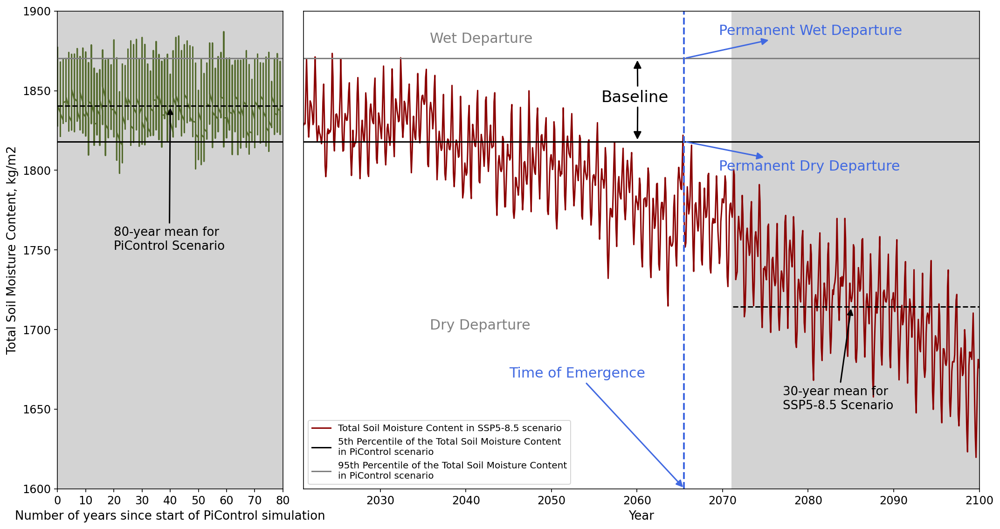

In [34]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(15,8), gridspec_kw={'width_ratios': [1,3]})

ax2.plot(time, ds_585_yearly_mean_T[1], color='darkred', label='Total Soil Moisture Content in SSP5-8.5 scenario')
ax2.axhline(pC_5th_0, color='black', label='5th Percentile of the Total Soil Moisture Content\nin PiControl scenario')
ax2.axhline(pC_95th_0, color='Grey', label='95th Percentile of the Total Soil Moisture Content\nin PiControl scenario')
ax2.set_xlim((datetime.date(2021, 1, 1), datetime.date(2100, 1, 16)))
ax2.set_xlabel('Year', fontsize=13)
#fig.suptitle(f'Monthly Total Soil Moisture Content in SSP5-8.5 in comparison with PiControl scenario of the region Northwestern North-America from 2021 to 2100 [{model[0]}]')
ax2.legend()
ax2.axvline(datetime.date(2065, 6, 16), linewidth=2, ls='--', color='royalblue')
ax2.annotate('Time of Emergence', xy=(datetime.date(2065, 7, 16), 1600), xytext=(datetime.date(2045, 1, 16), 1670), arrowprops=dict(arrowstyle="-|>", color='royalblue', lw=1.5),fontsize = 15, color='royalblue')
#ax2.annotate('Time of Emergence', xy=(datetime.date(2065, 5, 16), 1818), xytext=(datetime.date(2075, 1, 16), 1800), arrowprops=dict(head_length=0.6,head_width=0.4),fontsize = 15)
#head_length=0.4,head_width=0.2

#ax2.arrow(datetime.date(2060, 1, 16), 1846, 0, 1846-pC_5th_0, width=0.005, head_width=0.01, head_length=0.01)
ax2.annotate('Baseline', xy=(datetime.date(2045, 7, 16), 1890), xytext=(datetime.date(2055, 10, 16), 1843), fontsize = 17, color='black')
ax2.annotate('Wet Departure', xy=(datetime.date(2045, 7, 16), 1890), xytext=(datetime.date(2035, 10, 16), 1880), fontsize = 15, color='grey')
ax2.annotate('Dry Departure', xy=(datetime.date(2045, 7, 16), 1700), xytext=(datetime.date(2035, 10, 16), 1700), fontsize = 15, color='grey')
ax2.annotate('Permanent Dry Departure', xy=(datetime.date(2065, 7, 16), pC_5th_0), xytext=(datetime.date(2069, 7, 16), 1800), fontsize = 15, color='royalblue', arrowprops=dict(arrowstyle="<|-", color='royalblue', lw=1.5))
ax2.annotate('Permanent Wet Departure', xy=(datetime.date(2065, 7, 16), pC_95th_0), xytext=(datetime.date(2069, 7, 16), 1885), fontsize = 15, color='royalblue', arrowprops=dict(arrowstyle="<|-", color='royalblue', lw=1.5))
ax2.set_ylim((1600, 1900))
ax2.set_yticks([])
plt.setp(ax2.get_xticklabels(), fontsize=12)


ax1.plot(year_960, ds_pc_yearly_mean_T[1], color='darkolivegreen', label='Total Soil Moisture Content in PiControl scenario')
#ax1.axhline(piControl_5th_list[0][1], color='black', label='5th Percentile of the Total Soil Moisture Content in PiControl scenario')
#ax1.axhline(piControl_95th_list[0][1], color='Grey', label='95th Percentile of the Total Soil Moisture Content in PiControl scenario')
ax1.axhline(pC_5th_0, color='black', label='5th Percentile of the Total Soil Moisture Content in PiControl scenario')
ax1.axhline(pC_95th_0, color='Grey', label='95th Percentile of the Total Soil Moisture Content in PiControl scenario')
ax1.set_xlim((0,80))
#ax1.set_xlim((cftime.DatetimeGregorian(1850, 1, 16, 0, 0, 0, 0, has_year_zero=False), cftime.DatetimeGregorian(2021, 1, 1, 0, 0, 0, 0, has_year_zero=False)))
ax1.set_ylim((1600, 1900))
ax1.set_xlabel('Number of years since start of PiControl simulation', fontsize=13)
ax1.set_ylabel('Total Soil Moisture Content, kg/m2', fontsize=13)
plt.setp(ax1.get_xticklabels(), fontsize=12)
plt.setp(ax1.get_yticklabels(), fontsize=12)

x = [datetime.date(2071, 1, 16), datetime.date(2100, 12, 16), datetime.date(2100, 12, 16), datetime.date(2071, 1, 16)]
ax2.fill(x, [1600, 1600, 1900, 1900], fc='lightgrey');  #, ec='red'
ax1.fill([0, 960, 960, 0], [1600, 1600, 1900, 1900], fc='lightgrey')
ax1.axhline(pc_mean_sample, color='black', linestyle='--') # label='Mean Total Soil Moisture Content in both PiControl and SSP5-8.5 scenario')
#ax2.axhline(y = sample_585_mean, xmin = datetime.date(2071, 1, 16), xmax = datetime.date(2100, 12, 16), color='sienna')
ax2.axhline(y = sample_585_mean, xmin = 0.635, xmax = 1, color='black', linestyle='--') #, xmin = 2071, xmax = 2100
ax1.annotate('80-year mean for\nPiControl Scenario', xy=(40, pc_mean_sample), xytext=(20, 1750), arrowprops=dict(arrowstyle="-|>", color='black', lw=1.5),  fontsize = 13, color='black')
ax2.annotate('30-year mean for\nSSP5-8.5 Scenario', xy=(datetime.date(2085, 1, 16), sample_585_mean), xytext=(datetime.date(2077, 1, 16), 1650), arrowprops=dict(arrowstyle="-|>", color='black', lw=1.5), fontsize = 13, color='black')

ax2.annotate('.', xy=(datetime.date(2060, 1, 16), pC_5th_0), xytext=(datetime.date(2059, 10, 16), 1844), fontsize = 17, color='white', arrowprops=dict(arrowstyle="-|>", color='black', lw=1.5))
ax2.annotate('.', xy=(datetime.date(2060, 1, 16), pC_95th_0), xytext=(datetime.date(2059, 10, 16), 1843), fontsize = 17, color='white', arrowprops=dict(arrowstyle="-|>", color='black', lw=1.5))



fig.tight_layout()
#ax1.xticks(np.arange(0,2041), datetime.date(2045, 7, 16)
fig.savefig('Demonstration_Picontrol', bbox_inches='tight', dpi=250)

In [95]:
piControl_5th_list = []
piControl_95th_list = []
for i in range(len(model)):
    pC_yearly_mean = ds_list[i].mrso.groupby("time.year").mean("time")
    pC_yearly_mean_80years = pC_yearly_mean[0:81]
    
    mask_3D = ar6_land.mask_3D(pC_yearly_mean)
    weights = np.cos(np.deg2rad(pC_yearly_mean.lat))
    pC_regional_yearly_mean = pC_yearly_mean_80years.weighted(mask_3D * weights).mean(dim=("lat", "lon"))  # each region, monthly mean of the region
    value = pC_regional_yearly_mean.isel(region=slice(46)).values
    
    pC5_list_model = []
    pC95_list_model = []
    for j in range(46): 
        pC_5th, pC_95th = np.percentile(np.transpose(value)[j], [5, 95])
        pC5_list_model.append(pC_5th)
        pC95_list_model.append(pC_95th)
        
    piControl_5th_list.append(pC5_list_model) #supposed to have dim = (6, 46)
    piControl_95th_list.append(pC95_list_model)

C:\Users\lavri\Anaconda3\envs\thesis\lib\site-packages\dask\array\numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
C:\Users\lavri\Anaconda3\envs\thesis\lib\site-packages\dask\array\numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
C:\Users\lavri\Anaconda3\envs\thesis\lib\site-packages\dask\array\numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
C:\Users\lavri\Anaconda3\envs\thesis\lib\site-packages\dask\array\numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
C:\Users\lavri\Anaconda3\envs\thesis\lib\site-packages\dask\array\numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
C:\Users\lavri\Anaconda3\envs\thesis\lib\site-packages\dask\array\numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divi

In [96]:
yearly_mean_SS126_list = []
for i in range(len(model)):
    pr_year = ds_SS126_list[i].mrso.loc['2021-01-01':'2101-01-01'].groupby("time.year").mean("time") # yearly average
    pr_year = pr_year.rename(year="time")

    mask_2D = ar6_land.mask(pr_year)
    mask_3D = ar6_land.mask_3D(pr_year)
    
    weights = np.cos(np.deg2rad(pr_year.lat))

    yearly_reg = ds_SS126_list[i].mrso.loc['2021-01-01':'2101-01-01'].groupby('time.year').mean('time')     # average of yearly average for each region
    pr_regional = yearly_reg.weighted(mask_3D * weights).mean(dim=("lat", "lon"))  
    value = pr_regional.isel(region=slice(46)).values
    yearly_mean_SS126_list.append(np.transpose(value)) 

C:\Users\lavri\Anaconda3\envs\thesis\lib\site-packages\dask\array\numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
C:\Users\lavri\Anaconda3\envs\thesis\lib\site-packages\dask\array\numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
C:\Users\lavri\Anaconda3\envs\thesis\lib\site-packages\dask\array\numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
C:\Users\lavri\Anaconda3\envs\thesis\lib\site-packages\dask\array\numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
C:\Users\lavri\Anaconda3\envs\thesis\lib\site-packages\dask\array\numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
C:\Users\lavri\Anaconda3\envs\thesis\lib\site-packages\dask\array\numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divi

In [121]:
### SSP1-2.6 TOE
allyears = yearly_reg.year.values
region_abbrev = pr_regional.abbrevs.values
toe_up_SS126_all_year =[]
toe_down_SS126_all_year=[]

for j in range(len(model)):
    toe_up_SS126=[]
    toe_down_SS126=[]
    for i in range(46):
        up = yearly_mean_SS126_list[j][i] - piControl_95th_list[j][i] # if positive it breaks out positively
        down = piControl_5th_list[j][i] - yearly_mean_SS126_list[j][i] # if positive break out negatively 

        positive_emergence_list_year = allyears[up>0]
        if len(positive_emergence_list_year) == 0:
            print(region_abbrev[i], 'no upward toe')
            toe_up_SS126.append(0)

        else:
            #print(yearly_pr_regional85_mm.abbrevs.values[i], 'upward break', positive_emergence_list_year)
            jumps_positive = positive_emergence_list_year[1:] - positive_emergence_list_year[0:-1]
            positive_emergence_jumps = jumps_positive > 1 
            positive_emergence_jumps_list = np.where(positive_emergence_jumps)[0]

            if positive_emergence_list_year[-1] != 2100:
                print(region_abbrev[i], 'no upward toe')
                toe_up_SS126.append(0)

            else:
                if len(positive_emergence_jumps_list) > 0:
                    #print('index of break', positive_emergence_list)
                    final_emergence = positive_emergence_jumps_list[-1]
                    #print('index of last break', final_emergence)
                    year_of_final_emergence = positive_emergence_list_year[final_emergence+1]
                    toe_up_SS126.append(year_of_final_emergence)
                else: # continous break
                    year_of_final_emergence = positive_emergence_list_year[0]
                    toe_up_SS126.append(year_of_final_emergence)

                print(region_abbrev[i], 'up toe', year_of_final_emergence)
        
        negative_emergence_list_year = allyears[down>0]
        if len(negative_emergence_list_year) == 0:
            print(region_abbrev[i], 'no downward toe')
            toe_down_SS126.append(0)

        else:
            #print(yearly_pr_regional85_mm.abbrevs.values[i], 'upward break', negative_emergence_list_year)
            jumps_negative = negative_emergence_list_year[1:] - negative_emergence_list_year[0:-1]
            negative_emergence_jumps = jumps_negative > 1 
            negative_emergence_jumps_list = np.where(negative_emergence_jumps)[0]

            if negative_emergence_list_year[-1] != 2100:
                print(region_abbrev[i], 'no downward toe')
                toe_down_SS126.append(0)

            else:
                if len(negative_emergence_jumps_list) > 0:
                    #print('index of break', negative_emergence_list)
                    final_emergence = negative_emergence_jumps_list[-1]
                    #print('index of last break', final_emergence)
                    year_of_final_emergence = negative_emergence_list_year[final_emergence+1]
                    toe_down_SS126.append(year_of_final_emergence)
                else: # continous break
                    year_of_final_emergence = negative_emergence_list_year[0]
                    toe_down_SS126.append(year_of_final_emergence)

                print(region_abbrev[i], 'down toe', year_of_final_emergence)
                
    toe_down_SS126_all_year.append(toe_down_SS126)
    toe_up_SS126_all_year.append(toe_up_SS126)
    
    
    

print('upward', toe_up_SS126_all_year)
print("downward", toe_down_SS126_all_year)
#regional_toe_SS126 = np.add(toe_up_SS126, toe_down_SS126)

GIC up toe 2090
GIC no downward toe
NWN no upward toe
NWN down toe 2035
NEN no upward toe
NEN down toe 2027
WNA no upward toe
WNA down toe 2100
CNA no upward toe
CNA no downward toe
ENA no upward toe
ENA no downward toe
NCA no upward toe
NCA no downward toe
SCA no upward toe
SCA no downward toe
CAR no upward toe
CAR no downward toe
NWS no upward toe
NWS no downward toe
NSA no upward toe
NSA down toe 2099
NES no upward toe
NES down toe 2100
SAM no upward toe
SAM down toe 2099
SWS no upward toe
SWS down toe 2094
SES up toe 2097
SES no downward toe
SSA no upward toe
SSA no downward toe
NEU no upward toe
NEU down toe 2030
WCE no upward toe
WCE no downward toe
EEU no upward toe
EEU down toe 2051
MED no upward toe
MED down toe 2095
SAH no upward toe
SAH down toe 2099
WAF no upward toe
WAF no downward toe
CAF no upward toe
CAF no downward toe
NEAF up toe 2094
NEAF no downward toe
SEAF no upward toe
SEAF no downward toe
WSAF no upward toe
WSAF down toe 2096
ESAF no upward toe
ESAF down toe 210

In [122]:
toe_down_SS126_percent = []
for i in range(46):
    no_after2095 = np.transpose(toe_down_SS126_all_year)[i][np.transpose(toe_down_SS126_all_year)[i] < 2096]
    value = np.count_nonzero(no_after2095)
    toe_down_SS126_percent.append(value*-1)

toe_up_SS126_percent = []
for i in range(46):
    no_after2095 = np.transpose(toe_up_SS126_all_year)[i][np.transpose(toe_up_SS126_all_year)[i] < 2096]
    value = np.count_nonzero(no_after2095)
    toe_up_SS126_percent.append(value)
    
toe_total_percent_SS126 = []
toe_total_model_SS126=[]
for i in range(46):
    value = toe_down_SS126_percent[i] + toe_up_SS126_percent[i]
    toe_total_percent_SS126.append(value*100/14)
    toe_total_model_SS126.append(value)

toe_total_percent_SS126[0] = np.nan
toe_total_percent_SS126[44] = np.nan
toe_total_percent_SS126[45] = np.nan


Text(0.5, 1.0, '[SSP1-2.6]')

<Figure size 432x288 with 0 Axes>

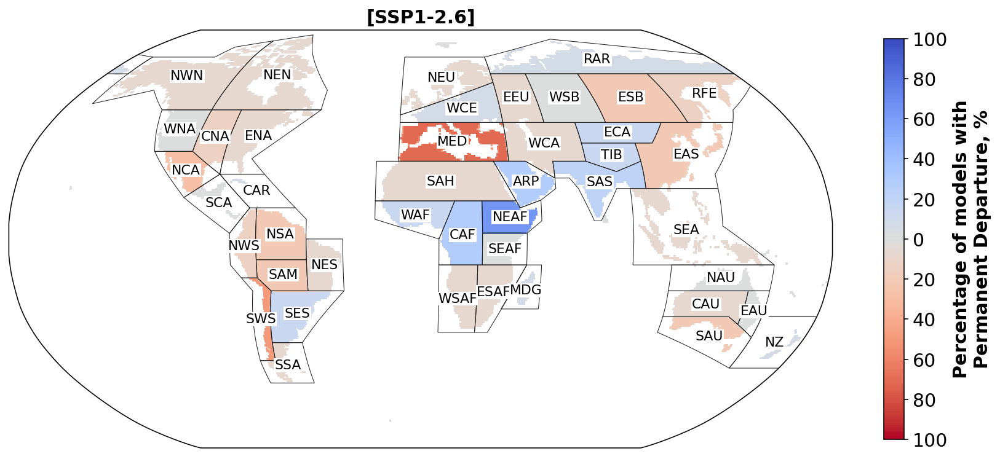

In [123]:
mask_2D = ar6_land.mask(ds_SS126_list[6])
reg_toe_45 = np.zeros(mask_2D.values.shape)
for i in range(46):
    reg_toe_45[mask_2D == i] = toe_total_percent_SS126[i]

toe_45_map_masked = sft_list[6]*reg_toe_45/100
toe_45_map_masked = apply_mask(toe_45_map_masked, sft_list[6], realm)

region_icefree = np.arange(1,44) #[region_icefree]
levels = np.linspace(-100, 100, 201) 
plt.figure()
f, ax1 = plt.subplots(subplot_kw=dict(projection=ccrs.Robinson()), figsize=(15, 8))
im = toe_45_map_masked.sftlf.plot(ax=ax1, transform=ccrs.PlateCarree(central_longitude=0), levels=levels, cmap='coolwarm_r', add_colorbar=False)

cb = f.colorbar(im, ax=ax1, shrink=0.75)
cb.ax.tick_params(labelsize=15)
cb.set_label(label='Percentage of models with\nPermanent Departure, %', size=15, weight='bold')
cb.set_ticks(np.linspace(-100, 100, 11))
cb.ax.set_yticklabels(['100','80', '60','40','20', '0', '20', '40', '60','80', '100'])

text_kws = dict(color="black", fontsize=11, bbox=dict(pad=0.2, color="w"))
ar6_land[region_icefree].plot_regions(line_kws=dict(lw=0.5), label='abbrev', text_kws=text_kws);
ax1.set_title('[SSP1-2.6]', fontsize=15, weight='bold')

In [100]:
## 5th and 95th percentile for the baseline

## first into areas
### SSP245

yearly_mean_SS245_list = []
for i in range(len(model)):
    pr_year = ds_SS245_list[i].mrso.loc['2021-01-01':'2101-01-01'].groupby("time.year").mean("time") # yearly average
    pr_year = pr_year.rename(year="time")

    mask_2D = ar6_land.mask(pr_year)
    mask_3D = ar6_land.mask_3D(pr_year)
    
    weights = np.cos(np.deg2rad(pr_year.lat)) ### just to estimate the weight

    yearly_reg = ds_SS245_list[i].mrso.loc['2021-01-01':'2101-01-01'].groupby('time.year').mean('time')     # average of yearly average for each region
    pr_regional = yearly_reg.weighted(mask_3D * weights).mean(dim=("lat", "lon"))  # each region, monthly mean of the region
    value = pr_regional.isel(region=slice(46)).values
    yearly_mean_SS245_list.append(np.transpose(value)) 

C:\Users\lavri\Anaconda3\envs\thesis\lib\site-packages\dask\array\numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
C:\Users\lavri\Anaconda3\envs\thesis\lib\site-packages\dask\array\numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
C:\Users\lavri\Anaconda3\envs\thesis\lib\site-packages\dask\array\numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
C:\Users\lavri\Anaconda3\envs\thesis\lib\site-packages\dask\array\numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
C:\Users\lavri\Anaconda3\envs\thesis\lib\site-packages\dask\array\numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
C:\Users\lavri\Anaconda3\envs\thesis\lib\site-packages\dask\array\numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divi

In [124]:
### SSP1-2.6 TOE
allyears = yearly_reg.year.values
region_abbrev = pr_regional.abbrevs.values
toe_up_SS245_all_year=[]
toe_down_SS245_all_year=[]

for j in range(len(model)):
    toe_up_SS245=[]
    toe_down_SS245=[]
    for i in range(46):
        up = yearly_mean_SS245_list[j][i] - piControl_95th_list[j][i] # if positive it breaks out positively
        down = piControl_5th_list[j][i] - yearly_mean_SS245_list[j][i] # if positive break out negatively 

        positive_emergence_list_year = allyears[up>0]
        if len(positive_emergence_list_year) == 0:
            print(region_abbrev[i], 'no upward toe')
            toe_up_SS245.append(0)

        else:
            #print(yearly_pr_regional85_mm.abbrevs.values[i], 'upward break', positive_emergence_list_year)
            jumps_positive = positive_emergence_list_year[1:] - positive_emergence_list_year[0:-1]
            positive_emergence_jumps = jumps_positive > 1 
            positive_emergence_jumps_list = np.where(positive_emergence_jumps)[0]

            if positive_emergence_list_year[-1] != 2100:
                print(region_abbrev[i], 'no upward toe')
                toe_up_SS245.append(0)

            else:
                if len(positive_emergence_jumps_list) > 0:
                    #print('index of break', positive_emergence_list)
                    final_emergence = positive_emergence_jumps_list[-1]
                    #print('index of last break', final_emergence)
                    year_of_final_emergence = positive_emergence_list_year[final_emergence+1]
                    toe_up_SS245.append(year_of_final_emergence)
                else: # continous break
                    year_of_final_emergence = positive_emergence_list_year[0]
                    toe_up_SS245.append(year_of_final_emergence)

                print(region_abbrev[i], 'up toe', year_of_final_emergence)
        
        negative_emergence_list_year = allyears[down>0]
        if len(negative_emergence_list_year) == 0:
            print(region_abbrev[i], 'no downward toe')
            toe_down_SS245.append(0)

        else:
            #print(yearly_pr_regional85_mm.abbrevs.values[i], 'upward break', negative_emergence_list_year)
            jumps_negative = negative_emergence_list_year[1:] - negative_emergence_list_year[0:-1]
            negative_emergence_jumps = jumps_negative > 1 
            negative_emergence_jumps_list = np.where(negative_emergence_jumps)[0]

            if negative_emergence_list_year[-1] != 2100:
                print(region_abbrev[i], 'no downward toe')
                toe_down_SS245.append(0)

            else:
                if len(negative_emergence_jumps_list) > 0:
                    #print('index of break', negative_emergence_list)
                    final_emergence = negative_emergence_jumps_list[-1]
                    #print('index of last break', final_emergence)
                    year_of_final_emergence = negative_emergence_list_year[final_emergence+1]
                    toe_down_SS245.append(year_of_final_emergence)
                else: # continous break
                    year_of_final_emergence = negative_emergence_list_year[0]
                    toe_down_SS245.append(year_of_final_emergence)

                print(region_abbrev[i], 'down toe', year_of_final_emergence)
                
    toe_down_SS245_all_year.append(toe_down_SS245)
    toe_up_SS245_all_year.append(toe_up_SS245)
    
    
    

print('upward', toe_up_SS245_all_year)
print("downward", toe_down_SS245_all_year)

GIC up toe 2099
GIC no downward toe
NWN no upward toe
NWN down toe 2040
NEN no upward toe
NEN down toe 2028
WNA no upward toe
WNA no downward toe
CNA no upward toe
CNA down toe 2100
ENA no upward toe
ENA down toe 2100
NCA no upward toe
NCA down toe 2100
SCA no upward toe
SCA no downward toe
CAR no upward toe
CAR no downward toe
NWS no upward toe
NWS no downward toe
NSA no upward toe
NSA down toe 2096
NES no upward toe
NES no downward toe
SAM no upward toe
SAM down toe 2099
SWS no upward toe
SWS no downward toe
SES no upward toe
SES no downward toe
SSA no upward toe
SSA no downward toe
NEU no upward toe
NEU down toe 2033
WCE no upward toe
WCE no downward toe
EEU no upward toe
EEU down toe 2055
MED no upward toe
MED down toe 2090
SAH up toe 2092
SAH no downward toe
WAF up toe 2065
WAF no downward toe
CAF no upward toe
CAF no downward toe
NEAF up toe 2077
NEAF no downward toe
SEAF up toe 2098
SEAF no downward toe
WSAF no upward toe
WSAF down toe 2098
ESAF no upward toe
ESAF no downward to

Text(0.5, 1.0, '[SSP2-4.5]')

<Figure size 432x288 with 0 Axes>

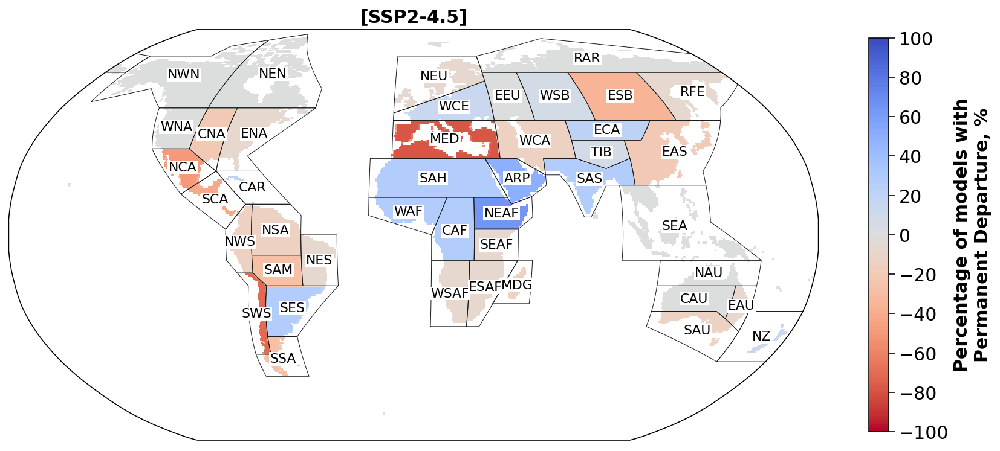

In [125]:
toe_down_SS245_percent = []
for i in range(46):
    no_after2095 = np.transpose(toe_down_SS245_all_year)[i][np.transpose(toe_down_SS245_all_year)[i] < 2096]
    value = np.count_nonzero(no_after2095)
    toe_down_SS245_percent.append(value*-1)

toe_up_SS245_percent = []
for i in range(46):
    no_after2095 = np.transpose(toe_up_SS245_all_year)[i][np.transpose(toe_up_SS245_all_year)[i] < 2096]
    value = np.count_nonzero(no_after2095)
    toe_up_SS245_percent.append(value)

toe_total_percent_SS245 = []
toe_total_model_SS245 = []
for i in range(46):
    value = toe_down_SS245_percent[i] + toe_up_SS245_percent[i]
    toe_total_percent_SS245.append(value*100/14)
    toe_total_model_SS245.append(value)
    
toe_total_percent_SS245[0] = np.nan
toe_total_percent_SS245[44] = np.nan
toe_total_percent_SS245[45] = np.nan
#toe_total_percent

mask_2D = ar6_land.mask(ds_SS245_list[6])
reg_toe_45 = np.zeros(mask_2D.values.shape)
for i in range(46):
    reg_toe_45[mask_2D == i] = toe_total_percent_SS245[i]

toe_45_map_masked = sft_list[6]*reg_toe_45/100
toe_45_map_masked = apply_mask(toe_45_map_masked, sft_list[6], realm)

levels = np.linspace(-100, 100, 201)  
plt.figure()
f, ax1 = plt.subplots(subplot_kw=dict(projection=ccrs.Robinson()), figsize=(15, 8))
im = toe_45_map_masked.sftlf.plot(ax=ax1, transform=ccrs.PlateCarree(central_longitude=0), levels=levels, cmap='coolwarm_r', add_colorbar=False)


cb = f.colorbar(im, ax=ax1,shrink=0.75)
cb.ax.tick_params(length=5, labelsize=15)
cb.set_label(label='Percentage of models with\nPermanent Departure, %', size=15, weight='bold')
cb.set_ticks(np.linspace(-100, 100, 11))

region_icefree = np.arange(1,44) #[region_icefree]
text_kws = dict(color="black", fontsize=11, bbox=dict(pad=0.2, color="w"))
ar6_land[region_icefree].plot_regions(line_kws=dict(lw=0.5), label='abbrev', text_kws=text_kws);
ax1.set_title('[SSP2-4.5]', fontsize=15, weight='bold')

In [103]:
## 5th and 95th percentile for the baseline

## first into areas
### SSP370

yearly_mean_SS370_list = []
for i in range(len(model)):
    pr_year = ds_SS370_list[i].mrso.loc['2021-01-01':'2101-01-01'].groupby("time.year").mean("time") # yearly average
    pr_year = pr_year.rename(year="time")

    mask_2D = ar6_land.mask(pr_year)
    mask_3D = ar6_land.mask_3D(pr_year)
    
    weights = np.cos(np.deg2rad(pr_year.lat)) 

    yearly_reg = ds_SS370_list[i].mrso.loc['2021-01-01':'2101-01-01'].groupby('time.year').mean('time')     # average of yearly average for each region
    pr_regional = yearly_reg.weighted(mask_3D * weights).mean(dim=("lat", "lon"))  
    value = pr_regional.isel(region=slice(46)).values
    yearly_mean_SS370_list.append(np.transpose(value)) 

C:\Users\lavri\Anaconda3\envs\thesis\lib\site-packages\dask\array\numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
C:\Users\lavri\Anaconda3\envs\thesis\lib\site-packages\dask\array\numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
C:\Users\lavri\Anaconda3\envs\thesis\lib\site-packages\dask\array\numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
C:\Users\lavri\Anaconda3\envs\thesis\lib\site-packages\dask\array\numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
C:\Users\lavri\Anaconda3\envs\thesis\lib\site-packages\dask\array\numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
C:\Users\lavri\Anaconda3\envs\thesis\lib\site-packages\dask\array\numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divi

In [126]:
### SSP370 TOE
allyears = yearly_reg.year.values
region_abbrev = pr_regional.abbrevs.values
toe_up_SS370_all_year=[]
toe_down_SS370_all_year=[]

for j in range(len(model)):
    toe_up_SS370=[]
    toe_down_SS370=[]
    for i in range(46):
        up = yearly_mean_SS370_list[j][i] - piControl_95th_list[j][i] # if positive it breaks out positively
        down = piControl_5th_list[j][i] - yearly_mean_SS370_list[j][i] # if positive break out negatively 

        positive_emergence_list_year = allyears[up>0]
        if len(positive_emergence_list_year) == 0:
            print(region_abbrev[i], 'no upward toe')
            toe_up_SS370.append(0)

        else:
            #print(yearly_pr_regional85_mm.abbrevs.values[i], 'upward break', positive_emergence_list_year)
            jumps_positive = positive_emergence_list_year[1:] - positive_emergence_list_year[0:-1]
            positive_emergence_jumps = jumps_positive > 1 
            positive_emergence_jumps_list = np.where(positive_emergence_jumps)[0]

            if positive_emergence_list_year[-1] != 2100:
                print(region_abbrev[i], 'no upward toe')
                toe_up_SS370.append(0)

            else:
                if len(positive_emergence_jumps_list) > 0:
                    #print('index of break', positive_emergence_list)
                    final_emergence = positive_emergence_jumps_list[-1]
                    #print('index of last break', final_emergence)
                    year_of_final_emergence = positive_emergence_list_year[final_emergence+1]
                    toe_up_SS370.append(year_of_final_emergence)
                else: # continous break
                    year_of_final_emergence = positive_emergence_list_year[0]
                    toe_up_SS370.append(year_of_final_emergence)

                print(region_abbrev[i], 'up toe', year_of_final_emergence)
        
        negative_emergence_list_year = allyears[down>0]
        if len(negative_emergence_list_year) == 0:
            print(region_abbrev[i], 'no downward toe')
            toe_down_SS370.append(0)

        else:
            #print(yearly_pr_regional85_mm.abbrevs.values[i], 'upward break', negative_emergence_list_year)
            jumps_negative = negative_emergence_list_year[1:] - negative_emergence_list_year[0:-1]
            negative_emergence_jumps = jumps_negative > 1 
            negative_emergence_jumps_list = np.where(negative_emergence_jumps)[0]

            if negative_emergence_list_year[-1] != 2100:
                print(region_abbrev[i], 'no downward toe')
                toe_down_SS370.append(0)

            else:
                if len(negative_emergence_jumps_list) > 0:
                    #print('index of break', negative_emergence_list)
                    final_emergence = negative_emergence_jumps_list[-1]
                    #print('index of last break', final_emergence)
                    year_of_final_emergence = negative_emergence_list_year[final_emergence+1]
                    toe_down_SS370.append(year_of_final_emergence)
                else: # continous break
                    year_of_final_emergence = negative_emergence_list_year[0]
                    toe_down_SS370.append(year_of_final_emergence)

                print(region_abbrev[i], 'down toe', year_of_final_emergence)
                
    toe_down_SS370_all_year.append(toe_down_SS370)
    toe_up_SS370_all_year.append(toe_up_SS370)
    
    

GIC up toe 2040
GIC no downward toe
NWN no upward toe
NWN down toe 2040
NEN no upward toe
NEN down toe 2023
WNA no upward toe
WNA no downward toe
CNA no upward toe
CNA down toe 2098
ENA no upward toe
ENA down toe 2098
NCA no upward toe
NCA no downward toe
SCA no upward toe
SCA down toe 2084
CAR no upward toe
CAR down toe 2084
NWS no upward toe
NWS no downward toe
NSA no upward toe
NSA down toe 2077
NES no upward toe
NES no downward toe
SAM no upward toe
SAM down toe 2097
SWS no upward toe
SWS down toe 2088
SES up toe 2093
SES no downward toe
SSA no upward toe
SSA down toe 2097
NEU no upward toe
NEU down toe 2037
WCE no upward toe
WCE down toe 2098
EEU no upward toe
EEU down toe 2040
MED no upward toe
MED down toe 2069
SAH no upward toe
SAH no downward toe
WAF up toe 2043
WAF no downward toe
CAF up toe 2065
CAF no downward toe
NEAF up toe 2050
NEAF no downward toe
SEAF up toe 2093
SEAF no downward toe
WSAF no upward toe
WSAF no downward toe
ESAF up toe 2100
ESAF no downward toe
MDG no u

Text(0.5, 1.0, '[SSP3-7.0]')

<Figure size 432x288 with 0 Axes>

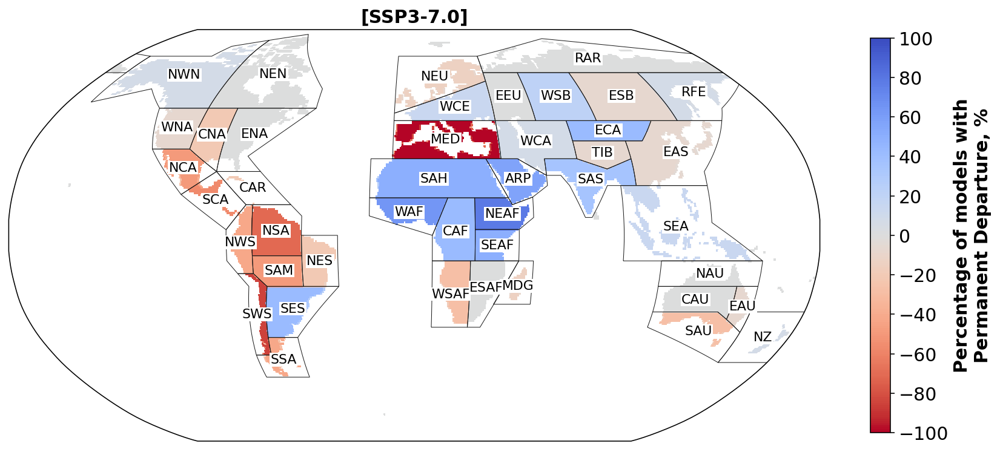

In [127]:
toe_down_SS370_percent = []
for i in range(46):
    no_after2095 = np.transpose(toe_down_SS370_all_year)[i][np.transpose(toe_down_SS370_all_year)[i] < 2096]
    value = np.count_nonzero(no_after2095)
    toe_down_SS370_percent.append(value*-1)

toe_up_SS370_percent = []
for i in range(46):
    no_after2095 = np.transpose(toe_up_SS370_all_year)[i][np.transpose(toe_up_SS370_all_year)[i] < 2096]
    value = np.count_nonzero(no_after2095)
    toe_up_SS370_percent.append(value)

toe_total_percent_SS370 = []
toe_total_model_SS370 = []
for i in range(46):
    value = toe_down_SS370_percent[i] + toe_up_SS370_percent[i]
    toe_total_percent_SS370.append(value*100/14)
    toe_total_model_SS370.append(value)
    
toe_total_percent_SS370[0] = np.nan
toe_total_percent_SS370[44] = np.nan
toe_total_percent_SS370[45] = np.nan 
#toe_total_percent

mask_2D = ar6_land.mask(ds_SS370_list[6])
reg_toe_45 = np.zeros(mask_2D.values.shape)
for i in range(46):
    reg_toe_45[mask_2D == i] = toe_total_percent_SS370[i]

toe_45_map_masked = sft_list[6]*reg_toe_45/100
toe_45_map_masked = apply_mask(toe_45_map_masked, sft_list[6], realm)

levels = np.linspace(-100, 100, 201)  
plt.figure()
f, ax1 = plt.subplots(subplot_kw=dict(projection=ccrs.Robinson()), figsize=(15, 8))
im = toe_45_map_masked.sftlf.plot(ax=ax1, transform=ccrs.PlateCarree(central_longitude=0), levels=levels,cmap='coolwarm_r', add_colorbar=False)


cb = f.colorbar(im, ax=ax1,shrink=0.75)
cb.ax.tick_params(labelsize=15)
cb.set_label(label='Percentage of models with\nPermanent Departure, %', size=15, weight='bold')
cb.set_ticks(np.linspace(-100, 100, 11))


region_icefree = np.arange(1,44) #[region_icefree]
text_kws = dict(color="black", fontsize=11, bbox=dict(pad=0.2, color="w"))
ar6_land[region_icefree].plot_regions(line_kws=dict(lw=0.5), label='abbrev', text_kws=text_kws);
ax1.set_title('[SSP3-7.0]', fontsize=15, weight='bold')

In [106]:
## 5th and 95th percentile for the baseline

## first into areas
### SSP585

yearly_mean_SS585_list = []
for i in range(len(model)):
    pr_year = ds_SS585_list[i].mrso.loc['2021-01-01':'2101-01-01'].groupby("time.year").mean("time") # yearly average
    pr_year = pr_year.rename(year="time")

    mask_2D = ar6_land.mask(pr_year)
    mask_3D = ar6_land.mask_3D(pr_year)
    
    weights = np.cos(np.deg2rad(pr_year.lat)) 

    yearly_reg = ds_SS585_list[i].mrso.loc['2021-01-01':'2101-01-01'].groupby('time.year').mean('time')     # average of yearly average for each region
    pr_regional = yearly_reg.weighted(mask_3D * weights).mean(dim=("lat", "lon"))  
    value = pr_regional.isel(region=slice(46)).values
    yearly_mean_SS585_list.append(np.transpose(value)) 

C:\Users\lavri\Anaconda3\envs\thesis\lib\site-packages\dask\array\numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
C:\Users\lavri\Anaconda3\envs\thesis\lib\site-packages\dask\array\numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
C:\Users\lavri\Anaconda3\envs\thesis\lib\site-packages\dask\array\numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
C:\Users\lavri\Anaconda3\envs\thesis\lib\site-packages\dask\array\numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
C:\Users\lavri\Anaconda3\envs\thesis\lib\site-packages\dask\array\numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
C:\Users\lavri\Anaconda3\envs\thesis\lib\site-packages\dask\array\numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divi

GIC up toe 2096
GIC no downward toe
NWN no upward toe
NWN down toe 2036
NEN no upward toe
NEN down toe 2022
WNA no upward toe
WNA no downward toe
CNA no upward toe
CNA down toe 2100
ENA no upward toe
ENA no downward toe
NCA no upward toe
NCA no downward toe
SCA no upward toe
SCA down toe 2080
CAR no upward toe
CAR down toe 2083
NWS up toe 2099
NWS no downward toe
NSA no upward toe
NSA down toe 2043
NES no upward toe
NES no downward toe
SAM no upward toe
SAM down toe 2099
SWS no upward toe
SWS down toe 2068
SES up toe 2087
SES no downward toe
SSA no upward toe
SSA no downward toe
NEU no upward toe
NEU down toe 2030
WCE no upward toe
WCE down toe 2098
EEU no upward toe
EEU down toe 2036
MED no upward toe
MED down toe 2063
SAH no upward toe
SAH no downward toe
WAF up toe 2097
WAF no downward toe
CAF up toe 2055
CAF no downward toe
NEAF up toe 2041
NEAF no downward toe
SEAF up toe 2075
SEAF no downward toe
WSAF no upward toe
WSAF down toe 2098
ESAF no upward toe
ESAF no downward toe
MDG no

<Figure size 432x288 with 0 Axes>

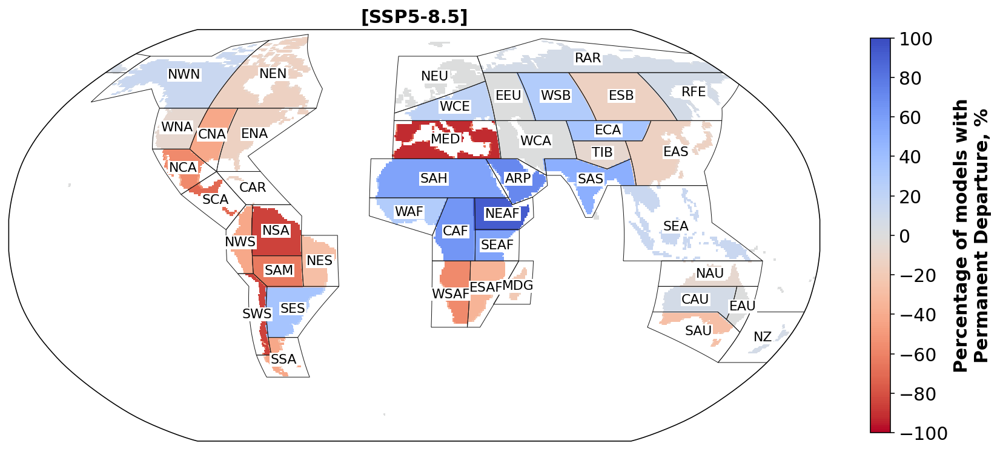

In [128]:
### SSP585 TOE
allyears = yearly_reg.year.values
region_abbrev = pr_regional.abbrevs.values
toe_up_SS585_all_year=[]
toe_down_SS585_all_year=[]

for j in range(len(model)):
    toe_up_SS585=[]
    toe_down_SS585=[]
    for i in range(46):
        up = yearly_mean_SS585_list[j][i] - piControl_95th_list[j][i] # if positive it breaks out positively
        down = piControl_5th_list[j][i] - yearly_mean_SS585_list[j][i] # if positive break out negatively 

        positive_emergence_list_year = allyears[up>0]
        if len(positive_emergence_list_year) == 0:
            print(region_abbrev[i], 'no upward toe')
            toe_up_SS585.append(0)

        else:
            #print(yearly_pr_regional85_mm.abbrevs.values[i], 'upward break', positive_emergence_list_year)
            jumps_positive = positive_emergence_list_year[1:] - positive_emergence_list_year[0:-1]
            positive_emergence_jumps = jumps_positive > 1 
            positive_emergence_jumps_list = np.where(positive_emergence_jumps)[0]

            if positive_emergence_list_year[-1] != 2100:
                print(region_abbrev[i], 'no upward toe')
                toe_up_SS585.append(0)

            else:
                if len(positive_emergence_jumps_list) > 0:
                    #print('index of break', positive_emergence_list)
                    final_emergence = positive_emergence_jumps_list[-1]
                    #print('index of last break', final_emergence)
                    year_of_final_emergence = positive_emergence_list_year[final_emergence+1]
                    toe_up_SS585.append(year_of_final_emergence)
                else: # continous break
                    year_of_final_emergence = positive_emergence_list_year[0]
                    toe_up_SS585.append(year_of_final_emergence)

                print(region_abbrev[i], 'up toe', year_of_final_emergence)
        
        negative_emergence_list_year = allyears[down>0]
        if len(negative_emergence_list_year) == 0:
            print(region_abbrev[i], 'no downward toe')
            toe_down_SS585.append(0)

        else:
            #print(yearly_pr_regional85_mm.abbrevs.values[i], 'upward break', negative_emergence_list_year)
            jumps_negative = negative_emergence_list_year[1:] - negative_emergence_list_year[0:-1]
            negative_emergence_jumps = jumps_negative > 1 
            negative_emergence_jumps_list = np.where(negative_emergence_jumps)[0]

            if negative_emergence_list_year[-1] != 2100:
                print(region_abbrev[i], 'no downward toe')
                toe_down_SS585.append(0)

            else:
                if len(negative_emergence_jumps_list) > 0:
                    #print('index of break', negative_emergence_list)
                    final_emergence = negative_emergence_jumps_list[-1]
                    #print('index of last break', final_emergence)
                    year_of_final_emergence = negative_emergence_list_year[final_emergence+1]
                    toe_down_SS585.append(year_of_final_emergence)
                else: # continous break
                    year_of_final_emergence = negative_emergence_list_year[0]
                    toe_down_SS585.append(year_of_final_emergence)

                print(region_abbrev[i], 'down toe', year_of_final_emergence)
                
    toe_down_SS585_all_year.append(toe_down_SS585)
    toe_up_SS585_all_year.append(toe_up_SS585)
    
    

toe_down_SS585_percent = []
for i in range(46):
    no_after2095 = np.transpose(toe_down_SS585_all_year)[i][np.transpose(toe_down_SS585_all_year)[i] < 2096]
    value = np.count_nonzero(no_after2095)
    toe_down_SS585_percent.append(value*-1)

toe_up_SS585_percent = []
for i in range(46):
    no_after2095 = np.transpose(toe_up_SS585_all_year)[i][np.transpose(toe_up_SS585_all_year)[i] < 2096]
    value = np.count_nonzero(no_after2095)
    toe_up_SS585_percent.append(value)

toe_total_percent_SS585 = []
toe_total_model_SS585 = []
for i in range(46):
    value = toe_down_SS585_percent[i] + toe_up_SS585_percent[i]
    toe_total_percent_SS585.append(value*100/14)
    toe_total_model_SS585.append(value)
    
toe_total_percent_SS585[0] = np.nan
toe_total_percent_SS585[44] = np.nan
toe_total_percent_SS585[45] = np.nan

mask_2D = ar6_land.mask(ds_SS585_list[6])
reg_toe_45 = np.zeros(mask_2D.values.shape)
for i in range(46):
    reg_toe_45[mask_2D == i] = toe_total_percent_SS585[i]

toe_45_map_masked = sft_list[6]*reg_toe_45/100
toe_45_map_masked = apply_mask(toe_45_map_masked, sft_list[6], realm)

levels = np.linspace(-100, 100, 201) 
plt.figure()
f, ax1 = plt.subplots(subplot_kw=dict(projection=ccrs.Robinson()), figsize=(15, 8))
im = toe_45_map_masked.sftlf.plot(ax=ax1, transform=ccrs.PlateCarree(central_longitude=0), levels=levels, cmap='coolwarm_r', add_colorbar=False)


cb = f.colorbar(im, ax=ax1,shrink=0.75)
cb.ax.tick_params(labelsize=15)
cb.set_label(label='Percentage of models with\nPermanent Departure, %', size=15, weight='bold')
cb.set_ticks(np.linspace(-100, 100, 11))

region_icefree = np.arange(1,44) #[region_icefree]
text_kws = dict(color="black", fontsize=11, bbox=dict(pad=0.2, color="w"))
ar6_land[region_icefree].plot_regions(line_kws=dict(lw=0.5), label='abbrev', text_kws=text_kws);
ax1.set_title('[SSP5-8.5]', fontsize=15, weight='bold');

# Boxplot

In [129]:
# select icefree regions
toe_total_percent_SS126_icef = toe_total_percent_SS126[1:44]
toe_total_percent_SS245_icef = toe_total_percent_SS245[1:44]
toe_total_percent_SS370_icef = toe_total_percent_SS370[1:44]
toe_total_percent_SS585_icef = toe_total_percent_SS585[1:44]

region_abbrev_icef = region_abbrev[1:44]

In [109]:
toe_up_SS126_all_T = np.transpose(toe_up_SS126_all_year) [1:44] 
toe_up_SS245_all_T = np.transpose(toe_up_SS245_all_year) [1:44] 
toe_up_SS370_all_T = np.transpose(toe_up_SS370_all_year) [1:44] 
toe_up_SS585_all_T = np.transpose(toe_up_SS585_all_year) [1:44] 

toe_up_SS585_all_T_beyond2100 = toe_up_SS585_all_T
for i in range(43):
    for j in range(14):
        if toe_up_SS585_all_T_beyond2100[i][j] == 0:
            toe_up_SS585_all_T_beyond2100[i][j] = 2300


toe_up_SS126_all_T_beyond2100 = toe_up_SS126_all_T
for i in range(43):
    for j in range(14):
        if toe_up_SS126_all_T_beyond2100[i][j] == 0:
            toe_up_SS126_all_T_beyond2100[i][j] = 2300
    

toe_up_SS245_all_T_beyond2100 = toe_up_SS245_all_T
for i in range(43):
    for j in range(14):
        if toe_up_SS245_all_T_beyond2100[i][j] == 0:
            toe_up_SS245_all_T_beyond2100[i][j] = 2300
    
    
toe_up_SS370_all_T_beyond2100 = toe_up_SS370_all_T
for i in range(43):
    for j in range(14):
        if toe_up_SS370_all_T_beyond2100[i][j] == 0:
            toe_up_SS370_all_T_beyond2100[i][j] = 2300
    

In [110]:
toe_down_SS126_all_T = np.transpose(toe_down_SS126_all_year) [1:44] 
toe_down_SS245_all_T = np.transpose(toe_down_SS245_all_year) [1:44] 
toe_down_SS370_all_T = np.transpose(toe_down_SS370_all_year) [1:44] 
toe_down_SS585_all_T = np.transpose(toe_down_SS585_all_year) [1:44] 
 

toe_down_SS585_all_T_beyond2100 = toe_down_SS585_all_T
for i in range(43):
    for j in range(14):
        if toe_down_SS585_all_T_beyond2100[i][j] == 0:
            toe_down_SS585_all_T_beyond2100[i][j] = 2300


toe_down_SS126_all_T_beyond2100 = toe_down_SS126_all_T
for i in range(43):
    for j in range(14):
        if toe_down_SS126_all_T_beyond2100[i][j] == 0:
            toe_down_SS126_all_T_beyond2100[i][j] = 2300
    

toe_down_SS245_all_T_beyond2100 = toe_down_SS245_all_T
for i in range(43):
    for j in range(14):
        if toe_down_SS245_all_T_beyond2100[i][j] == 0:
            toe_down_SS245_all_T_beyond2100[i][j] = 2300
    
    
toe_down_SS370_all_T_beyond2100 = toe_down_SS370_all_T
for i in range(43):
    for j in range(14):
        if toe_down_SS370_all_T_beyond2100[i][j] == 0:
            toe_down_SS370_all_T_beyond2100[i][j] = 2300
    

In [111]:
#more than 50%, plot box
dry_box_585 = []
dry_abbrev_585 = []
wet_box_585 = []
wet_abbrev_585 = []
abbrev_585 = []
for i in range(len(toe_total_percent_SS585_icef)):
    if toe_total_percent_SS585_icef[i]>50:# toe_up_SS585_all_T_beyond2100
        wet_box_585.append(toe_up_SS585_all_T_beyond2100[i])   #[toe_up_SS585_all_T[i]>2020])
        wet_abbrev_585.append(region_abbrev_icef[i])
    if toe_total_percent_SS585_icef[i]<-50:
        dry_box_585.append(toe_down_SS585_all_T_beyond2100[i])   #[toe_down_SS585_all_T[i]>2020])
        dry_abbrev_585.append(region_abbrev_icef[i])
        
dry_box_126 = []
dry_abbrev_126 = []
wet_box_126 = []
wet_abbrev_126 = []
abbrev_126=[]
for i in range(len(toe_total_percent_SS126_icef)):
    if toe_total_percent_SS126_icef[i]>50:
        wet_box_126.append(toe_up_SS126_all_T_beyond2100[i])   #[toe_up_SS126_all_T[i]>2020])
        wet_abbrev_126.append(region_abbrev_icef[i])
    if toe_total_percent_SS126_icef[i]<-50:
        dry_box_126.append(toe_down_SS126_all_T_beyond2100[i])   #[toe_down_SS126_all_T[i]>2020])
        dry_abbrev_126.append(region_abbrev_icef[i])
        
dry_box_245 = []
dry_abbrev_245 = []
wet_box_245 = []
wet_abbrev_245 = []
for i in range(len(toe_total_percent_SS245_icef)):
    if toe_total_percent_SS245_icef[i]>50:
        wet_box_245.append(toe_up_SS245_all_T_beyond2100[i])   #[toe_up_SS245_all_T[i]>2020])
        wet_abbrev_245.append(region_abbrev_icef[i])
    if toe_total_percent_SS245_icef[i]<-50:
        dry_box_245.append(toe_down_SS245_all_T_beyond2100[i])   #[toe_down_SS245_all_T[i]>2020])
        dry_abbrev_245.append(region_abbrev_icef[i])
        
dry_box_370 = []
dry_abbrev_370 = []
wet_box_370 = []
wet_abbrev_370 = []
for i in range(len(toe_total_percent_SS370_icef)):
    if toe_total_percent_SS370_icef[i]>50:
        wet_box_370.append(toe_up_SS370_all_T_beyond2100[i]) #[toe_up_SS370_all_T[i]>2020])
        wet_abbrev_370.append(region_abbrev_icef[i])
    if toe_total_percent_SS370_icef[i]<-50:
        dry_box_370.append(toe_down_SS370_all_T_beyond2100[i]) #[toe_down_SS370_all_T[i]>2020])
        dry_abbrev_370.append(region_abbrev_icef[i])

In [112]:
abbrev_370 = []
for i in range(len(dry_abbrev_370)):
    abbrev_370.append(dry_abbrev_370[i])
for i in range(len(wet_abbrev_370)):
    abbrev_370.append(wet_abbrev_370[i])


abbrev_126 = []
for i in range(len(dry_abbrev_126)):
    abbrev_126.append(dry_abbrev_126[i])
for i in range(len(wet_abbrev_126)):
    abbrev_126.append(wet_abbrev_126[i])


abbrev_245 = []
for i in range(len(dry_abbrev_245)):
    abbrev_245.append(dry_abbrev_245[i])
for i in range(len(wet_abbrev_245)):
    abbrev_245.append(wet_abbrev_245[i])


abbrev_585 = []
for i in range(len(dry_abbrev_585)):
    abbrev_585.append(dry_abbrev_585[i])
for i in range(len(wet_abbrev_585)):
    abbrev_585.append(wet_abbrev_585[i])


In [113]:
# manual sorting
dry_box_370_3 = dry_box_370[3]
dry_box_370_2 = dry_box_370[2]

dry_box_370[3] = dry_box_370_2
dry_box_370[2] = dry_box_370_3

abbrev_370_MED = abbrev_370[3]
abbrev_370_SWS = abbrev_370[2]
abbrev_370_NEAF = abbrev_370[5]
abbrev_370_ARP = abbrev_370[6]
abbrev_370[3] = abbrev_370_SWS
abbrev_370[2] = abbrev_370_MED
abbrev_370[6] = abbrev_370_NEAF
abbrev_370[5] = abbrev_370_ARP

In [114]:
wet_box_370_1 = wet_box_370[1]
wet_box_370_2 = wet_box_370[2]

wet_box_370[1] = wet_box_370_2
wet_box_370[2] = wet_box_370_1

In [115]:
abbrev_585_SAH = abbrev_585[7]
abbrev_585_CAF = abbrev_585[8]
abbrev_585_SEAF = abbrev_585[10]
abbrev_585_NEAF = abbrev_585[9]
abbrev_585_ARP = abbrev_585[11]
abbrev_585_WSAF = abbrev_585[6]
abbrev_585_MED = abbrev_585[5]
abbrev_585_SWS = abbrev_585[4]
abbrev_585_SAM = abbrev_585[3]
abbrev_585_NSA = abbrev_585[2]
abbrev_585_SCA = abbrev_585[1]
abbrev_585_NCA = abbrev_585[0]

abbrev_585[0] = abbrev_585_NCA
abbrev_585[1] = abbrev_585_SAM
abbrev_585[2] = abbrev_585_WSAF
abbrev_585[3] = abbrev_585_SCA
abbrev_585[4] = abbrev_585_NSA
abbrev_585[5] = abbrev_585_SWS
abbrev_585[6] = abbrev_585_MED
abbrev_585[7] = abbrev_585_CAF
abbrev_585[8] = abbrev_585_SEAF
abbrev_585[9] = abbrev_585_SAH
abbrev_585[10] = abbrev_585_ARP
abbrev_585[11] = abbrev_585_NEAF

In [116]:
wet_box_585_0 = wet_box_585[0]
wet_box_585_1 = wet_box_585[1]
wet_box_585_2 = wet_box_585[2]
wet_box_585_3 = wet_box_585[3]
wet_box_585_4 = wet_box_585[4]

dry_box_585_0 = dry_box_585[0]
dry_box_585_1 = dry_box_585[1]
dry_box_585_2 = dry_box_585[2]
dry_box_585_3 = dry_box_585[3]
dry_box_585_4 = dry_box_585[4]
dry_box_585_5 = dry_box_585[5]
dry_box_585_6 = dry_box_585[6]

wet_box_585[0] = wet_box_585_1
wet_box_585[1] = wet_box_585_3
wet_box_585[2] = wet_box_585_0
wet_box_585[3] = wet_box_585_4
wet_box_585[4] = wet_box_585_2

dry_box_585[0] = dry_box_585_0
dry_box_585[1] = dry_box_585_3
dry_box_585[2] = dry_box_585_6
dry_box_585[3] = dry_box_585_1
dry_box_585[4] = dry_box_585_2
dry_box_585[5] = dry_box_585_4
dry_box_585[6] = dry_box_585_5


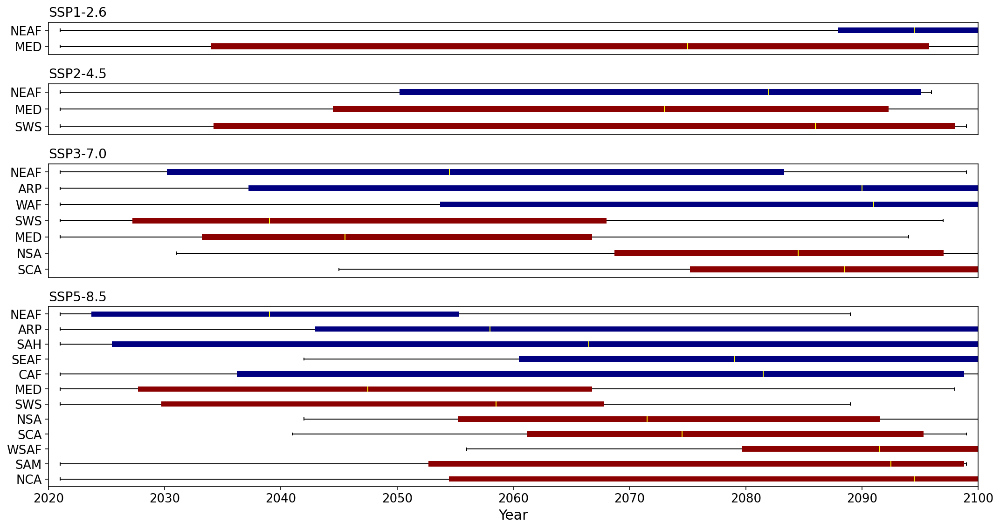

In [117]:
#fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(15,8))
from matplotlib import gridspec

plt.figure(figsize=(15,8))
gs = gridspec.GridSpec(4, 1, height_ratios=[1.7, 2.7, 6, 9.5]) 

c, n = 'darkred', 'navy'
plt.subplot(gs[0])
plt.boxplot(dry_box_126, positions=[1], widths=0.3, vert=False, patch_artist=True, boxprops=dict(facecolor=c, color=c),
            medianprops=dict(color='yellow'));
#ax1.set_yticks(np.arange(1, len(dry_box_126)+1, 1))
plt.yticks([1], dry_abbrev_126)
#ax1.set_yticklabels(dry_abbrev_126)
plt.boxplot(wet_box_126, positions=[2], widths=0.3, vert=False, patch_artist=True, boxprops=dict(facecolor=n, color=n),
            medianprops=dict(color='yellow'));
#ax1.set_yticks(np.arange(1, len(wet_box_126)+1, 1));
#ax1.set_yticklabels(wet_abbrev_126);
#plt.yticks(np.arange(1, len(wet_box_126)+1, 1), wet_abbrev_126);
plt.yticks([1,2], abbrev_126, fontsize=13);
plt.xticks([],[])
plt.title('SSP1-2.6', fontsize=14, loc='left')
plt.xlim((2020,2100))


plt.subplot(gs[1])    #1+np.arange(len(dry_box_245))
plt.boxplot(dry_box_245, positions=np.arange(len(dry_box_245)), widths=0.3, vert=False, patch_artist=True, boxprops=dict(facecolor=c, color=c),
            medianprops=dict(color='yellow'));
#plt.yticks(np.arange(len(dry_box_245)), dry_abbrev_245)
plt.boxplot(wet_box_245, positions=len(dry_box_245)+np.arange(len(wet_box_245)), widths=0.3, vert=False, patch_artist=True, boxprops=dict(facecolor=n, color=n),medianprops=dict(color='yellow'));
plt.yticks(np.arange(len(dry_box_245)+len(wet_box_245)), abbrev_245, fontsize=13);
plt.xticks([],[])
plt.title('SSP2-4.5', fontsize=14, loc='left')
plt.xlim((2020,2100))


plt.subplot(gs[2])
plt.boxplot(dry_box_370, positions=np.arange(len(dry_box_370)), widths=0.3, vert=False, patch_artist=True, boxprops=dict(facecolor=c, color=c),
            medianprops=dict(color='yellow'));
plt.boxplot(wet_box_370, positions=len(dry_box_370)+np.arange(len(wet_box_370)), widths=0.3, vert=False, patch_artist=True, boxprops=dict(facecolor=n, color=n),medianprops=dict(color='yellow'));
plt.yticks(np.arange(len(dry_box_370)+len(wet_box_370)), abbrev_370, fontsize=13);
plt.xticks([],[])
plt.title('SSP3-7.0', fontsize=14, loc='left')
plt.xlim((2020,2100))


plt.subplot(gs[3])
plt.boxplot(dry_box_585, positions=np.arange(len(dry_box_585)), widths=0.3, vert=False, patch_artist=True, boxprops=dict(facecolor=c, color=c),
            medianprops=dict(color='yellow'));
plt.boxplot(wet_box_585, positions=len(dry_box_585)+np.arange(len(wet_box_585)), widths=0.3, vert=False, patch_artist=True, boxprops=dict(facecolor=n, color=n),medianprops=dict(color='yellow'));
plt.yticks(np.arange(len(dry_box_585)+len(wet_box_585)), abbrev_585, fontsize=13);
plt.xlabel('Year', fontsize=15)
plt.xticks(fontsize=13)
plt.title('SSP5-8.5', fontsize=14, loc='left')
plt.xlim((2020,2100))

plt.tight_layout()

In [136]:
dry_box_370[2]
toe_down_SS585_all_year

[[0,
  2036,
  2022,
  0,
  2100,
  0,
  0,
  2080,
  2083,
  0,
  2043,
  0,
  2099,
  2068,
  0,
  0,
  2030,
  2098,
  2036,
  2063,
  0,
  0,
  0,
  0,
  0,
  2098,
  0,
  0,
  2072,
  2036,
  2026,
  2026,
  0,
  0,
  2033,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0],
 [2021,
  2021,
  2057,
  0,
  2088,
  2094,
  0,
  2043,
  2099,
  2041,
  2044,
  2087,
  2038,
  2035,
  2095,
  2059,
  0,
  0,
  0,
  2062,
  0,
  0,
  0,
  0,
  0,
  2078,
  2090,
  0,
  2084,
  0,
  0,
  0,
  0,
  0,
  2100,
  2100,
  0,
  0,
  2094,
  2100,
  2099,
  0,
  2100,
  0,
  2021,
  2021],
 [0,
  0,
  0,
  2098,
  2098,
  0,
  2094,
  2069,
  0,
  2099,
  2100,
  0,
  0,
  2063,
  0,
  0,
  0,
  0,
  0,
  2026,
  0,
  0,
  0,
  0,
  0,
  2070,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  2078,
  0,
  0,
  0],
 [0,
  0,
  0,
  0,
  0,
  0,
  2095,
  2059,
  0,
  2094,
  2068,
  0,
  2094,
  2089,
  0,
  0,
  0,
  0,
  0,
  2022,
  0,
  0,
  0,
  0,
  0,

# Tabulation of Time of Emergence

In [146]:
### TABULATE
toe_down_SS126_all_T = np.transpose(toe_down_SS126_all_year) [1:44] 
toe_down_SS245_all_T = np.transpose(toe_down_SS245_all_year) [1:44] 
toe_down_SS370_all_T = np.transpose(toe_down_SS370_all_year) [1:44] 
toe_down_SS585_all_T = np.transpose(toe_down_SS585_all_year) [1:44] 

toe_up_SS126_all_T = np.transpose(toe_up_SS126_all_year) [1:44] 
toe_up_SS245_all_T = np.transpose(toe_up_SS245_all_year) [1:44] 
toe_up_SS370_all_T = np.transpose(toe_up_SS370_all_year) [1:44] 
toe_up_SS585_all_T = np.transpose(toe_up_SS585_all_year) [1:44] 

toe_up_SS126_all_T_incl = np.insert(toe_up_SS126_all_T, 14, toe_up_SS126_percent[1:44], axis=1)
toe_up_SS126_all_T_incl = np.insert(toe_up_SS126_all_T_incl, 15, toe_total_model_SS126[1:44], axis=1)

toe_down_SS126_all_T_incl = np.insert(toe_down_SS126_all_T, 14, toe_down_SS126_percent[1:44], axis=1)
toe_down_SS126_all_T_incl = np.insert(toe_down_SS126_all_T_incl, 15, toe_total_model_SS126[1:44], axis=1)

col_name = np.insert(model, 14, ['Sum', 'Net Model Number'], axis=0)


In [147]:
a = np.arange(1,44, 1)

df_up_SS126_toe = pd.DataFrame([toe_up_SS126_all_T_incl[0]], columns=col_name)
df_up_SS126_toe

,ACCESS-CM2,CanESM5,CESM2,CESM2-WACCM,CNRM-CM6-1,CNRM-ESM2-1,EC-Earth3,EC-Earth3-Veg,GFDL-ESM4,IPSL-CM6A-LR,MIROC6,MIROC-ES2L,MPI-ESM1-2-HR,UKESM1-0-LL,Sum,Net Model Num
0,0,0,2045,2021,0,0,0,2098,2021,0,0,2048,0,0,4,-1


In [107]:
### even number is up // odd number is down

for i in range(43):
    # adding a row
    df_up_SS126_toe.loc[2*i] = toe_up_SS126_all_T_incl[i]
    
#for i in range(43):
for j in a:
    df_up_SS126_toe.loc[2*j-1] = toe_down_SS126_all_T_incl[j-1]
    
pd.set_option("display.max_rows", None, "display.max_columns", None)

df_up_SS126_toe = df_up_SS126_toe.sort_index()

In [108]:
region_abbrev_icefree = region_abbrev[1:44]

region_abbrev_icefree_double = []
for i in range(43):
    region_abbrev_icefree_double.append(region_abbrev_icefree[i])
    region_abbrev_icefree_double.append(region_abbrev_icefree[i])
    

In [109]:
df_up_SS126_toe.insert(0, "Regions", region_abbrev_icefree_double)
#df_up_SS126_toe

In [110]:
### TABULATE ss245


toe_up_SS245_all_T_incl = np.insert(toe_up_SS245_all_T, 14, toe_up_SS245_percent[1:44], axis=1)
toe_up_SS245_all_T_incl = np.insert(toe_up_SS245_all_T_incl, 15, toe_total_model_SS245[1:44], axis=1)

toe_down_SS245_all_T_incl = np.insert(toe_down_SS245_all_T, 14, toe_down_SS245_percent[1:44], axis=1)
toe_down_SS245_all_T_incl = np.insert(toe_down_SS245_all_T_incl, 15, toe_total_model_SS245[1:44], axis=1)

col_name = np.insert(model, 14, ['Sum', 'Net Model Number'], axis=0)

a = np.arange(1,44, 1)

df_up_SS245_toe = pd.DataFrame([toe_up_SS245_all_T_incl[0]], columns=col_name)

for i in range(43):
    # adding a row
    df_up_SS245_toe.loc[2*i] = toe_up_SS245_all_T_incl[i]
    
#for i in range(43):
for j in a:
    df_up_SS245_toe.loc[2*j-1] = toe_down_SS245_all_T_incl[j-1]


df_up_SS245_toe = df_up_SS245_toe.sort_index()
df_up_SS245_toe.insert(0, "Regions", region_abbrev_icefree_double)

df_up_SS245_toe

,Regions,ACCESS-CM2,CanESM5,CESM2,CESM2-WACCM,CNRM-CM6-1,CNRM-ESM2-1,EC-Earth3,EC-Earth3-Veg,GFDL-ESM4,IPSL-CM6A-LR,MIROC6,MIROC-ES2L,MPI-ESM1-2-HR,UKESM1-0-LL,Sum,Net Model Num
0,NWN,0,0,2030,2022,0,0,0,0,2021,0,0,2026,2094,0,5,0
1,NWN,2040,2021,0,0,2038,2021,0,0,0,0,0,0,0,2021,-5,0
2,NEN,0,0,2021,2021,0,0,0,0,2021,2100,0,2051,0,0,4,0
3,NEN,2028,2100,0,0,2021,2021,0,0,0,0,0,0,0,2021,-4,0
4,WNA,0,0,0,0,0,0,0,0,2021,0,0,0,2100,2100,1,0
5,WNA,0,0,2098,2100,2100,0,0,2092,0,0,0,0,0,0,-1,0
6,CNA,0,0,0,0,0,0,0,0,2060,0,0,0,2096,0,1,-3
7,CNA,2100,0,0,0,0,2021,2093,2085,0,0,0,2052,0,0,-4,-3
8,ENA,0,0,2100,0,0,0,0,0,0,0,0,2099,0,0,0,-1
9,ENA,2100,0,0,0,2090,0,0,0,0,0,0,0,0,0,-1,-1


In [111]:
### TABULATE ss370

toe_up_SS370_all_T_incl = np.insert(toe_up_SS370_all_T, 14, toe_up_SS370_percent[1:44], axis=1)
toe_up_SS370_all_T_incl = np.insert(toe_up_SS370_all_T_incl, 15, toe_total_model_SS370[1:44], axis=1)

toe_down_SS370_all_T_incl = np.insert(toe_down_SS370_all_T, 14, toe_down_SS370_percent[1:44], axis=1)
toe_down_SS370_all_T_incl = np.insert(toe_down_SS370_all_T_incl, 15, toe_total_model_SS370[1:44], axis=1)

col_name = np.insert(model, 14, ['Sum', 'Net Model Number'], axis=0)

a = np.arange(1,44, 1)

df_up_SS370_toe = pd.DataFrame([toe_up_SS370_all_T_incl[0]], columns=col_name)

for i in range(43):
    # adding a row
    df_up_SS370_toe.loc[2*i] = toe_up_SS370_all_T_incl[i]
    
#for i in range(43):
for j in a:
    df_up_SS370_toe.loc[2*j-1] = toe_down_SS370_all_T_incl[j-1]


df_up_SS370_toe = df_up_SS370_toe.sort_index()
df_up_SS370_toe.insert(0, "Regions", region_abbrev_icefree_double)
df_up_SS370_toe

,Regions,ACCESS-CM2,CanESM5,CESM2,CESM2-WACCM,CNRM-CM6-1,CNRM-ESM2-1,EC-Earth3,EC-Earth3-Veg,GFDL-ESM4,IPSL-CM6A-LR,MIROC6,MIROC-ES2L,MPI-ESM1-2-HR,UKESM1-0-LL,Sum,Net Model Num
0,NWN,0,0,2047,2041,0,0,2082,0,2021,2099,0,2076,2024,0,6,1
1,NWN,2040,2021,0,0,2045,2021,0,0,0,0,0,0,0,2021,-5,1
2,NEN,0,0,2021,2021,0,0,0,0,2021,0,2099,2069,0,0,4,0
3,NEN,2023,0,0,0,2021,2021,0,2099,0,0,0,0,2099,2021,-4,0
4,WNA,0,0,0,0,0,0,0,0,2021,0,2099,0,2092,2100,2,-1
5,WNA,0,0,2099,2095,2100,2058,2096,2089,0,0,0,0,0,0,-3,-1
6,CNA,0,0,0,0,0,0,0,0,2093,0,0,0,0,2100,1,-3
7,CNA,2098,2099,0,2097,0,2021,2092,2085,0,2100,2098,2047,0,0,-4,-3
8,ENA,0,0,2100,2100,0,0,0,0,2094,0,0,0,0,0,1,0
9,ENA,2098,0,0,0,2098,2077,2096,2099,0,0,0,0,0,0,-1,0


In [112]:
### TABULATE ss585

toe_up_SS585_all_T_incl = np.insert(toe_up_SS585_all_T, 14, toe_up_SS585_percent[1:44], axis=1)
toe_up_SS585_all_T_incl = np.insert(toe_up_SS585_all_T_incl, 15, toe_total_model_SS585[1:44], axis=1)

toe_down_SS585_all_T_incl = np.insert(toe_down_SS585_all_T, 14, toe_down_SS585_percent[1:44], axis=1)
toe_down_SS585_all_T_incl = np.insert(toe_down_SS585_all_T_incl, 15, toe_total_model_SS585[1:44], axis=1)

col_name = np.insert(model, 14, ['Sum', 'Net Model Number'], axis=0)

a = np.arange(1,44, 1)

df_up_SS585_toe = pd.DataFrame([toe_up_SS585_all_T_incl[0]], columns=col_name)

for i in range(43):
    # adding a row
    df_up_SS585_toe.loc[2*i] = toe_up_SS585_all_T_incl[i]
    
#for i in range(43):
for j in a:
    df_up_SS585_toe.loc[2*j-1] = toe_down_SS585_all_T_incl[j-1]


df_up_SS585_toe = df_up_SS585_toe.sort_index()
df_up_SS585_toe.insert(0, "Regions", region_abbrev_icefree_double)
df_up_SS585_toe

,Regions,ACCESS-CM2,CanESM5,CESM2,CESM2-WACCM,CNRM-CM6-1,CNRM-ESM2-1,EC-Earth3,EC-Earth3-Veg,GFDL-ESM4,IPSL-CM6A-LR,MIROC6,MIROC-ES2L,MPI-ESM1-2-HR,UKESM1-0-LL,Sum,Net Model Num
0,NWN,0,0,2035,2021,0,0,2091,0,2021,2099,2089,2066,2094,0,7,2
1,NWN,2036,2021,0,0,2033,2021,0,0,0,0,0,0,0,2021,-5,2
2,NEN,0,0,2021,2021,0,0,0,0,0,0,2096,2067,0,0,3,-2
3,NEN,2022,2057,0,0,2021,2023,0,0,0,0,0,0,0,2021,-5,-2
4,WNA,0,0,0,0,0,0,0,0,2021,0,2098,0,2095,2096,2,-1
5,WNA,0,0,2098,0,0,2090,2083,2064,0,0,0,0,0,0,-3,-1
6,CNA,0,0,0,0,2100,0,0,0,2099,0,0,0,0,2097,0,-6
7,CNA,2100,2088,2098,0,0,2021,2083,2056,0,0,2076,2047,0,0,-6,-6
8,ENA,0,0,2080,2096,0,0,0,0,0,0,0,0,0,2100,1,-2
9,ENA,0,2094,0,0,2098,2098,2087,2085,0,0,2100,0,0,0,-3,-2


# Monthly Time of Emergence

In [144]:
def year_regional_data(ds_ssp_list):
    monthly_mean_list = []
    for i in range(len(model)):
        tsmc_year = ds_ssp_list[i].mrso.loc['2021-01-01':'2101-01-01'].groupby("time.year").mean("time") # monthly average

        #y = tsmc_year.year.values

        mask_2D = ar6_land.mask(tsmc_year)
        mask_3D = ar6_land.mask_3D(tsmc_year)

        weights = np.cos(np.deg2rad(tsmc_year.lat)) ### just to estimate the weight
        tsmc_regional = ds_ssp_list[i].mrso.loc['2021-01-01':'2101-01-01'].weighted(mask_3D * weights).mean(dim=("lat", "lon"))
        #value = tsmc_regional.isel(region=slice(46)).values
        #yearly_mean_SS585_list.append(np.transpose(value)) 

        monthly_mean_list.append(tsmc_regional)   
    
    return monthly_mean_list

def monthly_data(tsmc_regional):
    tsmc_regional_values = tsmc_regional.values
    jan = []
    feb = []
    mar = []
    apr = []
    may = []
    jun = []
    jul = []
    aug = []
    sep = []
    octo = []
    nov = []
    dec = []

    for i in range(len(tsmc_regional)):
        if tsmc_regional.time.dt.month.values[i] == 1:
            jan.append(tsmc_regional_values[i])
        if tsmc_regional.time.dt.month.values[i] == 2:
            feb.append(tsmc_regional_values[i])
        if tsmc_regional.time.dt.month.values[i] == 3:
            mar.append(tsmc_regional_values[i])
        if tsmc_regional.time.dt.month.values[i] == 4:
            apr.append(tsmc_regional_values[i])
        if tsmc_regional.time.dt.month.values[i] == 5:
            may.append(tsmc_regional_values[i])
        if tsmc_regional.time.dt.month.values[i] == 6:
            jun.append(tsmc_regional_values[i])
        if tsmc_regional.time.dt.month.values[i] == 7:
            jul.append(tsmc_regional_values[i])
        if tsmc_regional.time.dt.month.values[i] == 8:
            aug.append(tsmc_regional_values[i])
        if tsmc_regional.time.dt.month.values[i] == 9:
            sep.append(tsmc_regional_values[i])
        if tsmc_regional.time.dt.month.values[i] == 10:
            octo.append(tsmc_regional_values[i])
        if tsmc_regional.time.dt.month.values[i] == 11:
            nov.append(tsmc_regional_values[i])
        if tsmc_regional.time.dt.month.values[i] == 12:
            dec.append(tsmc_regional_values[i])
            
    return jan, feb, mar, apr, may, jun, jul, aug, sep, octo, nov, dec 

### functions defining

#picontrol monthly
def pC_monthly_envelope(value): #value = monthly_data[i]   value dimension (80,46)
    pC5_list_model = []
    pC95_list_model = []
    for j in range(46): 
        pC_5th, pC_95th = np.percentile(np.transpose(value)[j], [5, 95])
        pC5_list_model.append(pC_5th)
        pC95_list_model.append(pC_95th)
            
    return pC5_list_model, pC95_list_model   #for only one model
    
    

def year_region_abbrevs_values(ds_ssp_list):
    tsmc_year = ds_ssp_list[0].mrso.loc['2021-01-01':'2101-01-01'].groupby("time.year").mean("time") # monthly average
    mask_2D = ar6_land.mask(tsmc_year)
    mask_3D = ar6_land.mask_3D(tsmc_year)
    weights = np.cos(np.deg2rad(tsmc_year.lat)) ### just to estimate the weight
    tsmc_regional = ds_ssp_list[0].mrso.loc['2021-01-01':'2101-01-01'].weighted(mask_3D * weights).mean(dim=("lat", "lon"))
    allyears = tsmc_year.year.values
    region_abbrev = tsmc_regional.abbrevs.values
    return allyears, region_abbrev


allyears = year_region_abbrevs_values(ds_SS126_list)[0]
region_abbrev = year_region_abbrevs_values(ds_SS126_list)[1]

#toe_down_SS126_all[0][0]   jan = 6x[46]
def regional_toe_permonth(x):
    m = [[], [], [], [], [], [], [], [], [], [], [], []]
    for j in range(len(model)):
        for i in range(len(m)):
            m[i].append(x[j][i])
    
    return m  # dimension(12, 6, 46)    
    

### eliminating 0 (no emergence) and emergence after 2095
## should i eliminate the no emergence model? should i elminate or should i append with 2100?
## but anyway still have to take into account of model weighting 
def regional_toe_median_permonth(a, b):
    m_up = []
    m_down = []
    for j in range(12):
        toe_down_SS126_median = []
        for i in range(46):
            no_after2095 = np.transpose(a[j])[i][np.transpose(a[j])[i] < 2096]
            nozero = no_after2095[no_after2095 != 0]
            if len(nozero) >= 1:
                median = np.quantile(nozero, 0.5)
            else:
                median = 0
            toe_down_SS126_median.append(median*-1)

        toe_up_SS126_median = []
        for i in range(46):
            no_after2095 = np.transpose(b[j])[i][np.transpose(b[j])[i] < 2096]
            nozero = no_after2095[no_after2095 != 0]
            if len(nozero) >= 1:
                median = np.quantile(nozero, 0.5)
            else:
                median = 0
            toe_up_SS126_median.append(median)        
    
        m_up.append(toe_up_SS126_median) # dimension (12, 46)
        m_down.append(toe_down_SS126_median)
        
    return m_up, m_down
        
#np.transpose(toe_down_SS126_all)
#nozero
#len(toe_down_SS126_median)
#len(np.transpose(toe_down_SS126_all))

In [145]:
tsmc_regional_pC = []   #regional monthly mean
for i in range(len(model)):
    pC_yearly_mean = ds_list[i].mrso.groupby("time.year").mean("time")
    mask_3D = ar6_land.mask_3D(pC_yearly_mean)
    weights = np.cos(np.deg2rad(pC_yearly_mean.lat))
    pC_regional_mean = ds_list[i].mrso.weighted(mask_3D * weights).mean(dim=("lat", "lon"))  # each region, monthly mean of the region
    tsmc_regional_pC.append(pC_regional_mean)

#np.shape(tsmc_regional_pC)
for i in range(len(model)):
    tsmc_regional_pC[i] = tsmc_regional_pC[i][0:960]  
    

monthly_regional_pC = [] # shape (14, 12, 80, 46)   ## separate regional monthly mean into months
for i in range(len(model)):
    month = monthly_data(tsmc_regional_pC[i])
    monthly_regional_pC.append(month)

piControl_5th_list_month = []  # shape (14, 12, 46)   ##
piControl_95th_list_month = []   
for i in range(len(model)):
    p5_per_model = []
    p95_per_model = []
    for j in range(len(monthly_regional_pC[i])):
        p5, p95 = pC_monthly_envelope(monthly_regional_pC[i][j]) 
        p5_per_model.append(p5) #supposed to have dim = (6, 12, 46)
        p95_per_model.append(p95)
        
    piControl_5th_list_month.append(p5_per_model)    
    piControl_95th_list_month.append(p95_per_model)    
   

In [224]:
### SSP1-2.6

tsmc_regional_SS126 = year_regional_data(ds_SS126_list)
monthly_regional_SS126 = []
for i in range(len(model)):
    month = monthly_data(tsmc_regional_SS126[i]) #(12, 46, 80)
    monthly_regional_SS126.append(month) #(6, 12, 46, 80)
np.shape(monthly_regional_SS126) 

allyears = year_region_abbrevs_values(ds_SS126_list)[0]
region_abbrev = year_region_abbrevs_values(ds_SS126_list)[1]

toe_up_SS126_all=[]
toe_down_SS126_all=[]  #dimension(6, 12, 46)
for j in range(len(model)):
    toe_per_month_up = []
    toe_per_month_down = []   #dimension(12, 46)
    for k in range(12):
        toe_up_SS126=[]  # dimension(46)
        toe_down_SS126=[]
        for i in range(46):
            up = np.transpose(monthly_regional_SS126[j][k])[i] - piControl_95th_list_month[j][k][i] # if positive it breaks out positively
            down = piControl_5th_list_month[j][k][i] - np.transpose(monthly_regional_SS126[j][k])[i] # if positive break out negatively 

            positive_emergence_list_year = allyears[up>0]
            if len(positive_emergence_list_year) == 0:
                ##print(region_abbrev[i], 'no upward toe')
                toe_up_SS126.append(0)

            else:
                
                jumps_positive = positive_emergence_list_year[1:] - positive_emergence_list_year[0:-1]
                positive_emergence_jumps = jumps_positive > 1 
                positive_emergence_jumps_list = np.where(positive_emergence_jumps)[0]

                if positive_emergence_list_year[-1] != 2100:
                    ##print(region_abbrev[i], 'no upward toe')
                    toe_up_SS126.append(0)

                else:
                    if len(positive_emergence_jumps_list) > 0:
                        
                        final_emergence = positive_emergence_jumps_list[-1]
                        
                        year_of_final_emergence = positive_emergence_list_year[final_emergence+1]
                        toe_up_SS126.append(year_of_final_emergence)
                    else: # continous break
                        year_of_final_emergence = positive_emergence_list_year[0]
                        toe_up_SS126.append(year_of_final_emergence)

                    ##print(region_abbrev[i], 'up toe', year_of_final_emergence)

            negative_emergence_list_year = allyears[down>0]
            if len(negative_emergence_list_year) == 0:
                ##print(region_abbrev[i], 'no downward toe')
                toe_down_SS126.append(0)

            else:
               
                jumps_negative = negative_emergence_list_year[1:] - negative_emergence_list_year[0:-1]
                negative_emergence_jumps = jumps_negative > 1 
                negative_emergence_jumps_list = np.where(negative_emergence_jumps)[0]

                if negative_emergence_list_year[-1] != 2100:
                    ##print(region_abbrev[i], 'no downward toe')
                    toe_down_SS126.append(0)

                else:
                    if len(negative_emergence_jumps_list) > 0:
                        
                        final_emergence = negative_emergence_jumps_list[-1]
                        
                        year_of_final_emergence = negative_emergence_list_year[final_emergence+1]
                        toe_down_SS126.append(year_of_final_emergence)
                    else: # continous break
                        year_of_final_emergence = negative_emergence_list_year[0]
                        toe_down_SS126.append(year_of_final_emergence)

                    ##print(region_abbrev[i], 'down toe', year_of_final_emergence)

        toe_per_month_down.append(toe_down_SS126)
        toe_per_month_up.append(toe_up_SS126)
    toe_up_SS126_all.append(toe_per_month_up)
    toe_down_SS126_all.append(toe_per_month_down)
    
    
np.shape(toe_down_SS126_all)
#print('upward', toe_up_SS126_all)
#print("downward", toe_down_SS126_all)
#regional_toe_SS126 = np.add(toe_up_SS126, toe_down_SS126)

monthly_toe_up = regional_toe_permonth(toe_up_SS126_all)
monthly_toe_down = regional_toe_permonth(toe_down_SS126_all)

monthly_toe_median_up_SS126, monthly_toe_median_down_SS126 = regional_toe_median_permonth(monthly_toe_up, monthly_toe_down)

np.shape(monthly_toe_median_up_SS126)
#monthly_toe_median_up_SS126[0]

(12, 46)

In [239]:
toe_down_SS126_all_T_month =[]
for j in range(len(model)):
    monthly_toe_down_T = np.transpose(toe_down_SS126_all[j])   #(46, 12)
    monthnumber_toe_down_SS126_monthly = []
    for i in range(46):
        no_after2095 = monthly_toe_down_T[i][monthly_toe_down_T[i] < 2096]
        nonzero = np.count_nonzero(no_after2095)
        monthnumber_toe_down_SS126_monthly.append(nonzero)
    toe_down_SS126_all_T_month.append(monthnumber_toe_down_SS126_monthly)
    
mean_monthnumber_toe_down_SS126 = []
median_monthnumber_toe_down_SS126 = []
for i in range(46):
    mean = np.mean(np.transpose(toe_down_SS126_all_T_month)[i])
    mean_monthnumber_toe_down_SS126.append(mean)
    median = np.median(np.transpose(toe_down_SS126_all_T_month)[i])
    median_monthnumber_toe_down_SS126.append(median)
    
toe_up_SS126_all_T_month =[]
for j in range(len(model)):
    monthly_toe_up_T = np.transpose(toe_up_SS126_all[j])   #(46, 12)
    monthnumber_toe_up_SS126_monthly = []
    for i in range(46):
        no_after2095 = monthly_toe_up_T[i][monthly_toe_up_T[i] < 2096]
        nonzero = np.count_nonzero(no_after2095)
        monthnumber_toe_up_SS126_monthly.append(nonzero)
    toe_up_SS126_all_T_month.append(monthnumber_toe_up_SS126_monthly)
    
mean_monthnumber_toe_up_SS126 = []
median_monthnumber_toe_up_SS126 = []
for i in range(46):
    mean = np.mean(np.transpose(toe_up_SS126_all_T_month)[i])
    mean_monthnumber_toe_up_SS126.append(mean)
    median = np.median(np.transpose(toe_up_SS126_all_T_month)[i])
    median_monthnumber_toe_up_SS126.append(median)
    
    
mean_monthnumber_toe_down_SS126[0] = np.nan
mean_monthnumber_toe_up_SS126[0] = np.nan
mean_monthnumber_toe_down_SS126[44] = np.nan
mean_monthnumber_toe_up_SS126[44] = np.nan
mean_monthnumber_toe_down_SS126[45] = np.nan
mean_monthnumber_toe_up_SS126[45] = np.nan


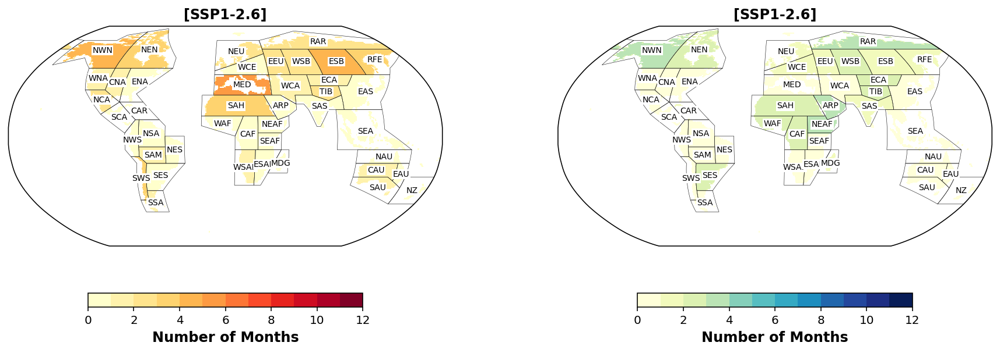

In [268]:
mask_2D = ar6_land.mask(ds_SS126_list[6])
reg_toe_45_wet = np.zeros(mask_2D.values.shape)
for i in range(46):
    reg_toe_45_wet[mask_2D == i] = mean_monthnumber_toe_up_SS126[i]

toe_45_map_masked_wet = sft_list[6]*reg_toe_45_wet/100
toe_45_map_masked_wet = apply_mask(toe_45_map_masked_wet, sft_list[6], realm)

reg_toe_45_dry = np.zeros(mask_2D.values.shape)
for i in range(46):
    reg_toe_45_dry[mask_2D == i] = mean_monthnumber_toe_down_SS126[i]

toe_45_map_masked_dry = sft_list[6]*reg_toe_45_dry/100
toe_45_map_masked_dry = apply_mask(toe_45_map_masked_dry, sft_list[6], realm)


region_icefree = np.arange(1,44)
levels = np.arange(0, 13, 1)

#f, ax1 = plt.subplots(subplot_kw=dict(projection=ccrs.Robinson()), figsize=(15, 8))
#im = mrso_SS245_map.sftlf.plot(ax=ax1, transform=ccrs.PlateCarree(central_longitude=0), levels = levels, cmap='coolwarm_r', add_colorbar=False)
#ax1.set_title('Deviation of the Total Soil Moisture Content in SSP2-4.5\nfrom the Baseline\n[Ensemble Median: 2071-2100]', size=18, weight='bold')
     
text_kws = dict(color="black", fontsize=7, bbox=dict(pad=0.2, color="w"))
fig, (ax1,ax2) = plt.subplots(1, 2, subplot_kw=dict(projection=ccrs.Robinson()), figsize=(30, 10)) #constrained_layout=True)  #, figsize=(15, 8)
plt.subplots_adjust(left=0.5, top=0.5, right=0.9)

im1 = toe_45_map_masked_dry.sftlf.plot(ax=ax1, transform=ccrs.PlateCarree(central_longitude=0), cmap='YlOrRd', levels = levels, add_colorbar=False)
ar6_land[region_icefree].plot_regions(ax=ax1, line_kws=dict(lw=0.3), label='abbrev', text_kws=text_kws)
ax1.set_title('[SSP1-2.6]', fontsize=12, weight='bold')

cb = f.colorbar(im1, ax=ax1, shrink=0.6, location='bottom')
cb.ax.tick_params(labelsize=10)
cb.set_label(label='Number of Months', size=12, weight='bold');
#cb.ax.set_xticklabels(['12', '9', '6', '3', '0', '3', '6', '9', '12']);


im2 = toe_45_map_masked_wet.sftlf.plot(ax=ax2, transform=ccrs.PlateCarree(central_longitude=0), levels = levels, cmap='YlGnBu', add_colorbar=False)
ar6_land[region_icefree].plot_regions(ax=ax2, line_kws=dict(lw=0.3), label='abbrev', text_kws=text_kws)
ax2.set_title('[SSP1-2.6]', fontsize=12, weight='bold')

cb = f.colorbar(im2, ax=ax2, shrink=0.6, location='bottom')
cb.ax.tick_params(labelsize=10)
cb.set_label(label='Number of Months', size=12, weight='bold');
#cb.ax.set_xticklabels(['12', '9', '6', '3', '0', '3', '6', '9', '12']);

#plt.figlegend(loc='lower center', bbox_to_anchor=(0.5, -0.02),fancybox=True, shadow=False, ncol=5, fontsize=15)


plt.savefig('SS126_num_months.png', bbox_inches='tight', dpi=250)
#fig.tight_layout()

In [245]:
### SSP2-4.5

tsmc_regional_SS245 = year_regional_data(ds_SS245_list)
monthly_regional_SS245 = []
for i in range(len(model)):
    month = monthly_data(tsmc_regional_SS245[i]) #(12, 46, 80)
    monthly_regional_SS245.append(month) #(6, 12, 46, 80)
np.shape(monthly_regional_SS245) 

allyears = year_region_abbrevs_values(ds_SS245_list)[0]
region_abbrev = year_region_abbrevs_values(ds_SS245_list)[1]

toe_up_SS245_all=[]
toe_down_SS245_all=[]  #dimension(6, 12, 46)
for j in range(len(model)):
    toe_per_month_up = []
    toe_per_month_down = []   #dimension(12, 46)
    for k in range(12):
        toe_up_SS245=[]  # dimension(46)
        toe_down_SS245=[]
        for i in range(46):
            up = np.transpose(monthly_regional_SS245[j][k])[i] - piControl_95th_list_month[j][k][i] # if positive it breaks out positively
            down = piControl_5th_list_month[j][k][i] - np.transpose(monthly_regional_SS245[j][k])[i] # if positive break out negatively 

            positive_emergence_list_year = allyears[up>0]
            if len(positive_emergence_list_year) == 0:
                ##print(region_abbrev[i], 'no upward toe')
                toe_up_SS245.append(0)

            else:
                
                jumps_positive = positive_emergence_list_year[1:] - positive_emergence_list_year[0:-1]
                positive_emergence_jumps = jumps_positive > 1 
                positive_emergence_jumps_list = np.where(positive_emergence_jumps)[0]

                if positive_emergence_list_year[-1] != 2100:
                    ##print(region_abbrev[i], 'no upward toe')
                    toe_up_SS245.append(0)

                else:
                    if len(positive_emergence_jumps_list) > 0:
                        
                        final_emergence = positive_emergence_jumps_list[-1]
                        
                        year_of_final_emergence = positive_emergence_list_year[final_emergence+1]
                        toe_up_SS245.append(year_of_final_emergence)
                    else: # continous break
                        year_of_final_emergence = positive_emergence_list_year[0]
                        toe_up_SS245.append(year_of_final_emergence)

                    ##print(region_abbrev[i], 'up toe', year_of_final_emergence)

            negative_emergence_list_year = allyears[down>0]
            if len(negative_emergence_list_year) == 0:
                ##print(region_abbrev[i], 'no downward toe')
                toe_down_SS245.append(0)

            else:
               
                jumps_negative = negative_emergence_list_year[1:] - negative_emergence_list_year[0:-1]
                negative_emergence_jumps = jumps_negative > 1 
                negative_emergence_jumps_list = np.where(negative_emergence_jumps)[0]

                if negative_emergence_list_year[-1] != 2100:
                    ##print(region_abbrev[i], 'no downward toe')
                    toe_down_SS245.append(0)

                else:
                    if len(negative_emergence_jumps_list) > 0:
                        
                        final_emergence = negative_emergence_jumps_list[-1]
                        
                        year_of_final_emergence = negative_emergence_list_year[final_emergence+1]
                        toe_down_SS245.append(year_of_final_emergence)
                    else: # continous break
                        year_of_final_emergence = negative_emergence_list_year[0]
                        toe_down_SS245.append(year_of_final_emergence)

                    ##print(region_abbrev[i], 'down toe', year_of_final_emergence)

        toe_per_month_down.append(toe_down_SS245)
        toe_per_month_up.append(toe_up_SS245)
    toe_up_SS245_all.append(toe_per_month_up)
    toe_down_SS245_all.append(toe_per_month_down)
    
    
np.shape(toe_down_SS245_all)
#print('upward', toe_up_SS245_all)
#print("downward", toe_down_SS245_all)
#regional_toe_SS245 = np.add(toe_up_SS245, toe_down_SS245)

monthly_toe_up = regional_toe_permonth(toe_up_SS245_all)
monthly_toe_down = regional_toe_permonth(toe_down_SS245_all)

monthly_toe_median_up_SS245, monthly_toe_median_down_SS245 = regional_toe_median_permonth(monthly_toe_up, monthly_toe_down)

np.shape(monthly_toe_median_up_SS245)
#monthly_toe_median_up_SS245[0]

(12, 46)

In [246]:
toe_down_SS245_all_T_month =[]
for j in range(len(model)):
    monthly_toe_down_T = np.transpose(toe_down_SS245_all[j])   #(46, 12)
    monthnumber_toe_down_SS245_monthly = []
    for i in range(46):
        no_after2095 = monthly_toe_down_T[i][monthly_toe_down_T[i] < 2096]
        nonzero = np.count_nonzero(no_after2095)
        monthnumber_toe_down_SS245_monthly.append(nonzero)
    toe_down_SS245_all_T_month.append(monthnumber_toe_down_SS245_monthly)
    
mean_monthnumber_toe_down_SS245 = []
median_monthnumber_toe_down_SS245 = []
for i in range(46):
    mean = np.mean(np.transpose(toe_down_SS245_all_T_month)[i])
    mean_monthnumber_toe_down_SS245.append(mean)
    median = np.median(np.transpose(toe_down_SS245_all_T_month)[i])
    median_monthnumber_toe_down_SS245.append(median)
    
toe_up_SS245_all_T_month =[]
for j in range(len(model)):
    monthly_toe_up_T = np.transpose(toe_up_SS245_all[j])   #(46, 12)
    monthnumber_toe_up_SS245_monthly = []
    for i in range(46):
        no_after2095 = monthly_toe_up_T[i][monthly_toe_up_T[i] < 2096]
        nonzero = np.count_nonzero(no_after2095)
        monthnumber_toe_up_SS245_monthly.append(nonzero)
    toe_up_SS245_all_T_month.append(monthnumber_toe_up_SS245_monthly)
    
mean_monthnumber_toe_up_SS245 = []
median_monthnumber_toe_up_SS245 = []
for i in range(46):
    mean = np.mean(np.transpose(toe_up_SS245_all_T_month)[i])
    mean_monthnumber_toe_up_SS245.append(mean)
    median = np.median(np.transpose(toe_up_SS245_all_T_month)[i])
    median_monthnumber_toe_up_SS245.append(median)

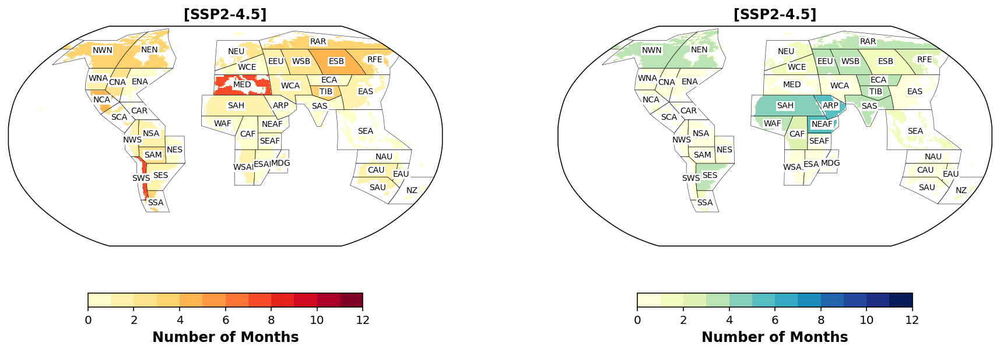

In [266]:
mean_monthnumber_toe_down_SS245[0] = np.nan
mean_monthnumber_toe_up_SS245[0] = np.nan
mean_monthnumber_toe_down_SS245[44] = np.nan
mean_monthnumber_toe_up_SS245[44] = np.nan
mean_monthnumber_toe_down_SS245[45] = np.nan
mean_monthnumber_toe_up_SS245[45] = np.nan

mask_2D = ar6_land.mask(ds_SS245_list[6])
reg_toe_45_wet = np.zeros(mask_2D.values.shape)
for i in range(46):
    reg_toe_45_wet[mask_2D == i] = mean_monthnumber_toe_up_SS245[i]

toe_45_map_masked_wet = sft_list[6]*reg_toe_45_wet/100
toe_45_map_masked_wet = apply_mask(toe_45_map_masked_wet, sft_list[6], realm)

reg_toe_45_dry = np.zeros(mask_2D.values.shape)
for i in range(46):
    reg_toe_45_dry[mask_2D == i] = mean_monthnumber_toe_down_SS245[i]

toe_45_map_masked_dry = sft_list[6]*reg_toe_45_dry/100
toe_45_map_masked_dry = apply_mask(toe_45_map_masked_dry, sft_list[6], realm)


region_icefree = np.arange(1,44)
levels = np.arange(0, 13, 1)

#f, ax1 = plt.subplots(subplot_kw=dict(projection=ccrs.Robinson()), figsize=(15, 8))
#im = mrso_SS245_map.sftlf.plot(ax=ax1, transform=ccrs.PlateCarree(central_longitude=0), levels = levels, cmap='coolwarm_r', add_colorbar=False)
#ax1.set_title('Deviation of the Total Soil Moisture Content in SSP2-4.5\nfrom the Baseline\n[Ensemble Median: 2071-2100]', size=18, weight='bold')
     
text_kws = dict(color="black", fontsize=7, bbox=dict(pad=0.2, color="w"))
fig, (ax1,ax2) = plt.subplots(1, 2, subplot_kw=dict(projection=ccrs.Robinson()), figsize=(30, 10)) #constrained_layout=True)  #, figsize=(15, 8)
plt.subplots_adjust(left=0.5, top=0.5, right=0.9)

im1 = toe_45_map_masked_dry.sftlf.plot(ax=ax1, transform=ccrs.PlateCarree(central_longitude=0), levels = levels, cmap='YlOrRd', add_colorbar=False)
ar6_land[region_icefree].plot_regions(ax=ax1, line_kws=dict(lw=0.3), label='abbrev', text_kws=text_kws)
ax1.set_title('[SSP2-4.5]', fontsize=12, weight='bold')

cb = f.colorbar(im1, ax=ax1, shrink=0.6, location='bottom')
cb.ax.tick_params(labelsize=10)
cb.set_label(label='Number of Months', size=12, weight='bold');


im2 = toe_45_map_masked_wet.sftlf.plot(ax=ax2, transform=ccrs.PlateCarree(central_longitude=0), levels = levels, cmap='YlGnBu', add_colorbar=False)
ar6_land[region_icefree].plot_regions(ax=ax2, line_kws=dict(lw=0.3), label='abbrev', text_kws=text_kws)
ax2.set_title('[SSP2-4.5]', fontsize=12, weight='bold')

cb = f.colorbar(im2, ax=ax2, shrink=0.6, location='bottom')
cb.ax.tick_params(labelsize=10)
cb.set_label(label='Number of Months', size=12, weight='bold');
#cb.ax.set_yticklabels(['12', '9', '6', '3', '0', '3', '6', '9', '12']);


plt.savefig('SS245_num_months.png', bbox_inches='tight', dpi=250)
#fig.tight_layout()

In [251]:
### SSP3-7.0
df_sm_model = df.query(f"variable_id == 'mrso' & experiment_id == 'ssp370' & table_id == 'Lmon'  & source_id == '{model[3]}'")
ds_mrso = xr.open_zarr(fsspec.get_mapper(df_sm_model.zstore.values[0]), consolidated=True)

ds_SS370_list[3] = ds_mrso
#ds_SS370_list

tsmc_regional_SS370 = year_regional_data(ds_SS370_list)
monthly_regional_SS370 = []
for i in range(len(model)):
    month = monthly_data(tsmc_regional_SS370[i]) #(12, 46, 80)
    monthly_regional_SS370.append(month) #(6, 12, 46, 80)
np.shape(monthly_regional_SS370) 

allyears = year_region_abbrevs_values(ds_SS370_list)[0]
region_abbrev = year_region_abbrevs_values(ds_SS370_list)[1]

toe_up_SS370_all=[]
toe_down_SS370_all=[]  #dimension(6, 12, 46)
for j in range(len(model)):
    toe_per_month_up = []
    toe_per_month_down = []   #dimension(12, 46)
    for k in range(12):
        toe_up_SS370=[]  # dimension(46)
        toe_down_SS370=[]
        for i in range(46):
            up = np.transpose(monthly_regional_SS370[j][k])[i] - piControl_95th_list_month[j][k][i] # if positive it breaks out positively
            down = piControl_5th_list_month[j][k][i] - np.transpose(monthly_regional_SS370[j][k])[i] # if positive break out negatively 

            positive_emergence_list_year = allyears[up>0]
            if len(positive_emergence_list_year) == 0:
                ##print(region_abbrev[i], 'no upward toe')
                toe_up_SS370.append(0)

            else:
                
                jumps_positive = positive_emergence_list_year[1:] - positive_emergence_list_year[0:-1]
                positive_emergence_jumps = jumps_positive > 1 
                positive_emergence_jumps_list = np.where(positive_emergence_jumps)[0]

                if positive_emergence_list_year[-1] != 2100:
                    ##print(region_abbrev[i], 'no upward toe')
                    toe_up_SS370.append(0)

                else:
                    if len(positive_emergence_jumps_list) > 0:
                        
                        final_emergence = positive_emergence_jumps_list[-1]
                        
                        year_of_final_emergence = positive_emergence_list_year[final_emergence+1]
                        toe_up_SS370.append(year_of_final_emergence)
                    else: # continous break
                        year_of_final_emergence = positive_emergence_list_year[0]
                        toe_up_SS370.append(year_of_final_emergence)

                    ##print(region_abbrev[i], 'up toe', year_of_final_emergence)

            negative_emergence_list_year = allyears[down>0]
            if len(negative_emergence_list_year) == 0:
                ##print(region_abbrev[i], 'no downward toe')
                toe_down_SS370.append(0)

            else:
               
                jumps_negative = negative_emergence_list_year[1:] - negative_emergence_list_year[0:-1]
                negative_emergence_jumps = jumps_negative > 1 
                negative_emergence_jumps_list = np.where(negative_emergence_jumps)[0]

                if negative_emergence_list_year[-1] != 2100:
                    ##print(region_abbrev[i], 'no downward toe')
                    toe_down_SS370.append(0)

                else:
                    if len(negative_emergence_jumps_list) > 0:
                        
                        final_emergence = negative_emergence_jumps_list[-1]
                        
                        year_of_final_emergence = negative_emergence_list_year[final_emergence+1]
                        toe_down_SS370.append(year_of_final_emergence)
                    else: # continous break
                        year_of_final_emergence = negative_emergence_list_year[0]
                        toe_down_SS370.append(year_of_final_emergence)

                    ##print(region_abbrev[i], 'down toe', year_of_final_emergence)

        toe_per_month_down.append(toe_down_SS370)
        toe_per_month_up.append(toe_up_SS370)
    toe_up_SS370_all.append(toe_per_month_up)
    toe_down_SS370_all.append(toe_per_month_down)
    
    
np.shape(toe_down_SS370_all)
#print('upward', toe_up_SS370_all)
#print("downward", toe_down_SS370_all)
#regional_toe_SS370 = np.add(toe_up_SS370, toe_down_SS370)

monthly_toe_up = regional_toe_permonth(toe_up_SS370_all)
monthly_toe_down = regional_toe_permonth(toe_down_SS370_all)

monthly_toe_median_up_SS370, monthly_toe_median_down_SS370 = regional_toe_median_permonth(monthly_toe_up, monthly_toe_down)

np.shape(monthly_toe_median_up_SS370)
#monthly_toe_median_up_SS370[0]

(12, 46)

In [253]:
toe_down_SS370_all_T_month =[]
for j in range(len(model)):
    monthly_toe_down_T = np.transpose(toe_down_SS370_all[j])   #(46, 12)
    monthnumber_toe_down_SS370_monthly = []
    for i in range(46):
        no_after2095 = monthly_toe_down_T[i][monthly_toe_down_T[i] < 2096]
        nonzero = np.count_nonzero(no_after2095)
        monthnumber_toe_down_SS370_monthly.append(nonzero)
    toe_down_SS370_all_T_month.append(monthnumber_toe_down_SS370_monthly)
    
mean_monthnumber_toe_down_SS370 = []
median_monthnumber_toe_down_SS370 = []
for i in range(46):
    mean = np.mean(np.transpose(toe_down_SS370_all_T_month)[i])
    mean_monthnumber_toe_down_SS370.append(mean)
    median = np.median(np.transpose(toe_down_SS370_all_T_month)[i])
    median_monthnumber_toe_down_SS370.append(median*1)
    
toe_up_SS370_all_T_month =[]
for j in range(len(model)):
    monthly_toe_up_T = np.transpose(toe_up_SS370_all[j])   #(46, 12)
    monthnumber_toe_up_SS370_monthly = []
    for i in range(46):
        no_after2095 = monthly_toe_up_T[i][monthly_toe_up_T[i] < 2096]
        nonzero = np.count_nonzero(no_after2095)
        monthnumber_toe_up_SS370_monthly.append(nonzero)
    toe_up_SS370_all_T_month.append(monthnumber_toe_up_SS370_monthly)
    
mean_monthnumber_toe_up_SS370 = []
median_monthnumber_toe_up_SS370 = []
for i in range(46):
    mean = np.mean(np.transpose(toe_up_SS370_all_T_month)[i])
    mean_monthnumber_toe_up_SS370.append(mean)
    median = np.median(np.transpose(toe_up_SS370_all_T_month)[i])
    median_monthnumber_toe_up_SS370.append(median)

In [277]:
#mean_monthnumber_toe_down_SS370

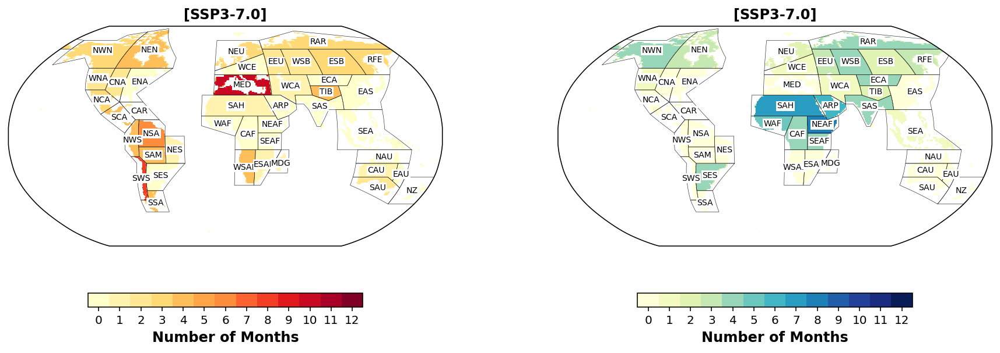

In [279]:
mean_monthnumber_toe_down_SS370[0] = np.nan
mean_monthnumber_toe_up_SS370[0] = np.nan
mean_monthnumber_toe_down_SS370[44] = np.nan
mean_monthnumber_toe_up_SS370[44] = np.nan
mean_monthnumber_toe_down_SS370[45] = np.nan
mean_monthnumber_toe_up_SS370[45] = np.nan

mask_2D = ar6_land.mask(ds_SS370_list[6])
reg_toe_45_wet = np.zeros(mask_2D.values.shape)
for i in range(46):
    reg_toe_45_wet[mask_2D == i] = mean_monthnumber_toe_up_SS370[i]

toe_45_map_masked_wet = sft_list[6]*reg_toe_45_wet/100
toe_45_map_masked_wet = apply_mask(toe_45_map_masked_wet, sft_list[6], realm)

reg_toe_45_dry = np.zeros(mask_2D.values.shape)
for i in range(46):
    reg_toe_45_dry[mask_2D == i] = mean_monthnumber_toe_down_SS370[i]

toe_45_map_masked_dry = sft_list[6]*reg_toe_45_dry/100
toe_45_map_masked_dry = apply_mask(toe_45_map_masked_dry, sft_list[6], realm)


region_icefree = np.arange(1,44)
levels = np.arange(0, 14, 1)

#f, ax1 = plt.subplots(subplot_kw=dict(projection=ccrs.Robinson()), figsize=(15, 8))
#im = mrso_SS370_map.sftlf.plot(ax=ax1, transform=ccrs.PlateCarree(central_longitude=0), levels = levels, cmap='coolwarm_r', add_colorbar=False)
#ax1.set_title('Deviation of the Total Soil Moisture Content in SSP2-4.5\nfrom the Baseline\n[Ensemble Median: 2071-2100]', size=18, weight='bold')
     
text_kws = dict(color="black", fontsize=7, bbox=dict(pad=0.2, color="w"))
fig, (ax1,ax2) = plt.subplots(1, 2, subplot_kw=dict(projection=ccrs.Robinson()), figsize=(30, 10)) #constrained_layout=True)  #, figsize=(15, 8)
plt.subplots_adjust(left=0.5, top=0.5, right=0.9)

im1 = toe_45_map_masked_dry.sftlf.plot(ax=ax1, transform=ccrs.PlateCarree(central_longitude=0), levels = levels, cmap='YlOrRd', add_colorbar=False)
ar6_land[region_icefree].plot_regions(ax=ax1, line_kws=dict(lw=0.3), label='abbrev', text_kws=text_kws)
ax1.set_title('[SSP3-7.0]', fontsize=12, weight='bold')

#labels = np.arange(0,k,1)


cb = f.colorbar(im1, ax=ax1, shrink=0.6, location='bottom')
loc = levels + .5
cb.set_ticks(loc)
cb.set_ticklabels(levels)
cb.ax.tick_params(labelsize=10)
cb.set_label(label='Number of Months', size=12, weight='bold');


im2 = toe_45_map_masked_wet.sftlf.plot(ax=ax2, transform=ccrs.PlateCarree(central_longitude=0), levels = levels, cmap='YlGnBu', add_colorbar=False)
ar6_land[region_icefree].plot_regions(ax=ax2, line_kws=dict(lw=0.3), label='abbrev', text_kws=text_kws)
ax2.set_title('[SSP3-7.0]', fontsize=12, weight='bold')

cb = f.colorbar(im2, ax=ax2, shrink=0.6, location='bottom')
loc = levels + .5
cb.set_ticks(loc)
cb.set_ticklabels(levels)
cb.ax.tick_params(labelsize=10)
cb.set_label(label='Number of Months', size=12, weight='bold');
#cb.ax.set_yticklabels(['12', '9', '6', '3', '0', '3', '6', '9', '12']);

plt.savefig('SS370_num_months.png', bbox_inches='tight', dpi=250)
#plt.savefig('.png', bbox_inches='tight', dpi=250)
#fig.tight_layout()




In [281]:
### SSP5-8.5

tsmc_regional_SS585 = year_regional_data(ds_SS585_list)
monthly_regional_SS585 = []
for i in range(len(model)):
    month = monthly_data(tsmc_regional_SS585[i]) #(12, 46, 80)
    monthly_regional_SS585.append(month) #(6, 12, 46, 80)
np.shape(monthly_regional_SS585) 

allyears = year_region_abbrevs_values(ds_SS585_list)[0]
region_abbrev = year_region_abbrevs_values(ds_SS585_list)[1]

toe_up_SS585_all=[]
toe_down_SS585_all=[]  #dimension(6, 12, 46)
for j in range(len(model)):
    toe_per_month_up = []
    toe_per_month_down = []   #dimension(12, 46)
    for k in range(12):
        toe_up_SS585=[]  # dimension(46)
        toe_down_SS585=[]
        for i in range(46):
            up = np.transpose(monthly_regional_SS585[j][k])[i] - piControl_95th_list_month[j][k][i] # if positive it breaks out positively
            down = piControl_5th_list_month[j][k][i] - np.transpose(monthly_regional_SS585[j][k])[i] # if positive break out negatively 

            positive_emergence_list_year = allyears[up>0]
            if len(positive_emergence_list_year) == 0:
                ##print(region_abbrev[i], 'no upward toe')
                toe_up_SS585.append(0)

            else:
                
                jumps_positive = positive_emergence_list_year[1:] - positive_emergence_list_year[0:-1]
                positive_emergence_jumps = jumps_positive > 1 
                positive_emergence_jumps_list = np.where(positive_emergence_jumps)[0]

                if positive_emergence_list_year[-1] != 2100:
                    ##print(region_abbrev[i], 'no upward toe')
                    toe_up_SS585.append(0)

                else:
                    if len(positive_emergence_jumps_list) > 0:
                        
                        final_emergence = positive_emergence_jumps_list[-1]
                        
                        year_of_final_emergence = positive_emergence_list_year[final_emergence+1]
                        toe_up_SS585.append(year_of_final_emergence)
                    else: # continous break
                        year_of_final_emergence = positive_emergence_list_year[0]
                        toe_up_SS585.append(year_of_final_emergence)

                    ##print(region_abbrev[i], 'up toe', year_of_final_emergence)

            negative_emergence_list_year = allyears[down>0]
            if len(negative_emergence_list_year) == 0:
                ##print(region_abbrev[i], 'no downward toe')
                toe_down_SS585.append(0)

            else:
               
                jumps_negative = negative_emergence_list_year[1:] - negative_emergence_list_year[0:-1]
                negative_emergence_jumps = jumps_negative > 1 
                negative_emergence_jumps_list = np.where(negative_emergence_jumps)[0]

                if negative_emergence_list_year[-1] != 2100:
                    ##print(region_abbrev[i], 'no downward toe')
                    toe_down_SS585.append(0)

                else:
                    if len(negative_emergence_jumps_list) > 0:
                        
                        final_emergence = negative_emergence_jumps_list[-1]
                        
                        year_of_final_emergence = negative_emergence_list_year[final_emergence+1]
                        toe_down_SS585.append(year_of_final_emergence)
                    else: # continous break
                        year_of_final_emergence = negative_emergence_list_year[0]
                        toe_down_SS585.append(year_of_final_emergence)

                    ##print(region_abbrev[i], 'down toe', year_of_final_emergence)

        toe_per_month_down.append(toe_down_SS585)
        toe_per_month_up.append(toe_up_SS585)
    toe_up_SS585_all.append(toe_per_month_up)
    toe_down_SS585_all.append(toe_per_month_down)
    
    
np.shape(toe_down_SS585_all)
#print('upward', toe_up_SS585_all)
#print("downward", toe_down_SS585_all)
#regional_toe_SS585 = np.add(toe_up_SS585, toe_down_SS585)

monthly_toe_up = regional_toe_permonth(toe_up_SS585_all)
monthly_toe_down = regional_toe_permonth(toe_down_SS585_all)

monthly_toe_median_up_SS585, monthly_toe_median_down_SS585 = regional_toe_median_permonth(monthly_toe_up, monthly_toe_down)

np.shape(monthly_toe_median_up_SS585)
#monthly_toe_median_up_SS585[0]

(12, 46)

In [282]:
toe_down_SS585_all_T_month =[]
for j in range(len(model)):
    monthly_toe_down_T = np.transpose(toe_down_SS585_all[j])   #(46, 12)
    monthnumber_toe_down_SS585_monthly = []
    for i in range(46):
        no_after2095 = monthly_toe_down_T[i][monthly_toe_down_T[i] < 2096]
        nonzero = np.count_nonzero(no_after2095)
        monthnumber_toe_down_SS585_monthly.append(nonzero)
    toe_down_SS585_all_T_month.append(monthnumber_toe_down_SS585_monthly)
    
mean_monthnumber_toe_down_SS585 = []
median_monthnumber_toe_down_SS585 = []
for i in range(46):
    mean = np.mean(np.transpose(toe_down_SS585_all_T_month)[i])
    mean_monthnumber_toe_down_SS585.append(mean*1)
    median = np.median(np.transpose(toe_down_SS585_all_T_month)[i])
    median_monthnumber_toe_down_SS585.append(median*1)
    
toe_up_SS585_all_T_month =[]
for j in range(len(model)):
    monthly_toe_up_T = np.transpose(toe_up_SS585_all[j])   #(46, 12)
    monthnumber_toe_up_SS585_monthly = []
    for i in range(46):
        no_after2095 = monthly_toe_up_T[i][monthly_toe_up_T[i] < 2096]
        nonzero = np.count_nonzero(no_after2095)
        monthnumber_toe_up_SS585_monthly.append(nonzero)
    toe_up_SS585_all_T_month.append(monthnumber_toe_up_SS585_monthly)
    
mean_monthnumber_toe_up_SS585 = []
median_monthnumber_toe_up_SS585 = []
for i in range(46):
    mean = np.mean(np.transpose(toe_up_SS585_all_T_month)[i])
    mean_monthnumber_toe_up_SS585.append(mean)
    median = np.median(np.transpose(toe_up_SS585_all_T_month)[i])
    median_monthnumber_toe_up_SS585.append(median)

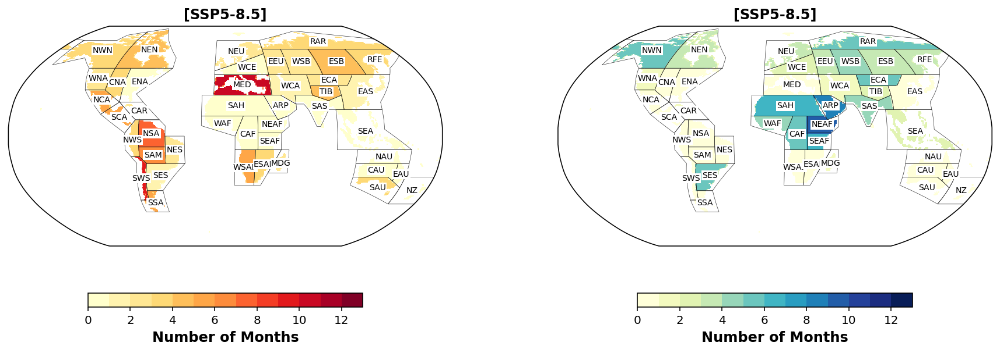

In [284]:
mean_monthnumber_toe_down_SS585[0] = np.nan
mean_monthnumber_toe_up_SS585[0] = np.nan
mean_monthnumber_toe_down_SS585[44] = np.nan
mean_monthnumber_toe_up_SS585[44] = np.nan
mean_monthnumber_toe_down_SS585[45] = np.nan
mean_monthnumber_toe_up_SS585[45] = np.nan

mask_2D = ar6_land.mask(ds_SS585_list[6])
reg_toe_45_wet = np.zeros(mask_2D.values.shape)
for i in range(46):
    reg_toe_45_wet[mask_2D == i] = mean_monthnumber_toe_up_SS585[i]

toe_45_map_masked_wet = sft_list[6]*reg_toe_45_wet/100
toe_45_map_masked_wet = apply_mask(toe_45_map_masked_wet, sft_list[6], realm)

reg_toe_45_dry = np.zeros(mask_2D.values.shape)
for i in range(46):
    reg_toe_45_dry[mask_2D == i] = mean_monthnumber_toe_down_SS585[i]

toe_45_map_masked_dry = sft_list[6]*reg_toe_45_dry/100
toe_45_map_masked_dry = apply_mask(toe_45_map_masked_dry, sft_list[6], realm)


region_icefree = np.arange(1,44)
levels = np.arange(0, 14, 1)

#f, ax1 = plt.subplots(subplot_kw=dict(projection=ccrs.Robinson()), figsize=(15, 8))
#im = mrso_SS585_map.sftlf.plot(ax=ax1, transform=ccrs.PlateCarree(central_longitude=0), levels = levels, cmap='coolwarm_r', add_colorbar=False)
#ax1.set_title('Deviation of the Total Soil Moisture Content in SSP2-4.5\nfrom the Baseline\n[Ensemble Median: 2071-2100]', size=18, weight='bold')
     
text_kws = dict(color="black", fontsize=7, bbox=dict(pad=0.2, color="w"))
fig, (ax1,ax2) = plt.subplots(1, 2, subplot_kw=dict(projection=ccrs.Robinson()), figsize=(30, 10)) #constrained_layout=True)  #, figsize=(15, 8)
plt.subplots_adjust(left=0.5, top=0.5, right=0.9)

im1 = toe_45_map_masked_dry.sftlf.plot(ax=ax1, transform=ccrs.PlateCarree(central_longitude=0), levels = levels, cmap='YlOrRd', add_colorbar=False)
ar6_land[region_icefree].plot_regions(ax=ax1, line_kws=dict(lw=0.3), label='abbrev', text_kws=text_kws)
ax1.set_title('[SSP5-8.5]', fontsize=12, weight='bold')

cb = f.colorbar(im1, ax=ax1, shrink=0.6, location='bottom')
cb.ax.tick_params(labelsize=10)
cb.set_label(label='Number of Months', size=12, weight='bold');


im2 = toe_45_map_masked_wet.sftlf.plot(ax=ax2, transform=ccrs.PlateCarree(central_longitude=0), levels = levels, cmap='YlGnBu', add_colorbar=False)
ar6_land[region_icefree].plot_regions(ax=ax2, line_kws=dict(lw=0.3), label='abbrev', text_kws=text_kws)
ax2.set_title('[SSP5-8.5]', fontsize=12, weight='bold')

cb = f.colorbar(im2, ax=ax2, shrink=0.6, location='bottom')
cb.ax.tick_params(labelsize=10)
cb.set_label(label='Number of Months', size=12, weight='bold');
#cb.ax.set_yticklabels(['12', '9', '6', '3', '0', '3', '6', '9', '12']);

plt.savefig('SS585_num_months.png', bbox_inches='tight', dpi=250)
#plt.savefig('SS585_allmodel_dev.png', bbox_inches='tight', dpi=250)
#fig.tight_layout()

In [187]:
###TABULATE

df_up_SS126 = pd.DataFrame(np.transpose(toe_up_SS126_all_T_month), columns=model)
df_up_SS126.insert(0, 'Regions', region_abbrev)
df_up_SS126['Ensemble Mean'] = mean_monthnumber_toe_up_SS126
#df_up_SS126.to_csv(r'C:\Users\lavri\OneDrive\Documents\Thesis\Excel\Num_months_up_SS126.csv', index = False, header=True)
        

df_up_SS245 = pd.DataFrame(np.transpose(toe_up_SS245_all_T_month), columns=model)
df_up_SS245.insert(0, 'Regions', region_abbrev)
df_up_SS245['Ensemble Mean'] = mean_monthnumber_toe_up_SS245
#df_up_SS245.to_csv(r'C:\Users\lavri\OneDrive\Documents\Thesis\Excel\Num_months_up_SS245.csv', index = False, header=True)
        

df_up_SS370 = pd.DataFrame(np.transpose(toe_up_SS370_all_T_month), columns=model)
df_up_SS370.insert(0, 'Regions', region_abbrev)
df_up_SS370['Ensemble Mean'] = mean_monthnumber_toe_up_SS370
#df_up_SS370.to_csv(r'C:\Users\lavri\OneDrive\Documents\Thesis\Excel\Num_months_up_SS370.csv', index = False, header=True)
        

df_up_SS585 = pd.DataFrame(np.transpose(toe_up_SS585_all_T_month), columns=model)
df_up_SS585.insert(0, 'Regions', region_abbrev)
df_up_SS585['Ensemble Mean'] = mean_monthnumber_toe_up_SS585
#df_up_SS585.to_csv(r'C:\Users\lavri\OneDrive\Documents\Thesis\Excel\Num_months_up_SS585.csv', index = False, header=True)
        

In [133]:
df_down_SS126 = pd.DataFrame(np.transpose(toe_down_SS126_all_T_month), columns=model)
df_down_SS126.insert(0, 'Regions', region_abbrev)
df_down_SS126['Ensemble Mean'] = mean_monthnumber_toe_down_SS126
#df_down_SS126.to_csv(r'C:\Users\lavri\OneDrive\Documents\Thesis\Excel\Num_months_down_SS126.csv', index = False, header=True)

df_down_SS245 = pd.DataFrame(np.transpose(toe_down_SS245_all_T_month), columns=model)
df_down_SS245.insert(0, 'Regions', region_abbrev)
df_down_SS245['Ensemble Mean'] = mean_monthnumber_toe_down_SS245
#df_down_SS245.to_csv(r'C:\Users\lavri\OneDrive\Documents\Thesis\Excel\Num_months_down_SS245.csv', index = False, header=True)

df_down_SS370 = pd.DataFrame(np.transpose(toe_down_SS370_all_T_month), columns=model)
df_down_SS370.insert(0, 'Regions', region_abbrev)
df_down_SS370['Ensemble Mean'] = mean_monthnumber_toe_down_SS370
#df_down_SS370.to_csv(r'C:\Users\lavri\OneDrive\Documents\Thesis\Excel\Num_months_down_SS370.csv', index = False, header=True)
        
df_down_SS585 = pd.DataFrame(np.transpose(toe_down_SS585_all_T_month), columns=model)
df_down_SS585.insert(0, 'Regions', region_abbrev)
df_down_SS585['Ensemble Mean'] = mean_monthnumber_toe_down_SS585
#df_down_SS585.to_csv(r'C:\Users\lavri\OneDrive\Documents\Thesis\Excel\Num_months_down_SS585.csv', index = False, header=True)

In [134]:
from matplotlib import cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
import matplotlib.colors

#kelly_colors = ['#F2F3F4', '#222222', '#F3C300', '#875692', '#F38400', '#A1CAF1', '#BE0032', '#C2B280', '#848482', '#008856', '#E68FAC', '#0067A5', '#F99379', '#604E97', '#F6A600', '#B3446C', '#DCD300', '#882D17', '#8DB600', '#654522', '#E25822', '#2B3D26']
kelly_colors = ['#222222', '#875692', '#F38400', '#A1CAF1', '#BE0032', '#C2B280', '#848482', '#008856', '#E68FAC', '#0067A5', '#F99379', '#604E97', '#8DB600', '#654522', '#E25822', '#2B3D26']
cmap = ListedColormap(kelly_colors[0:15])


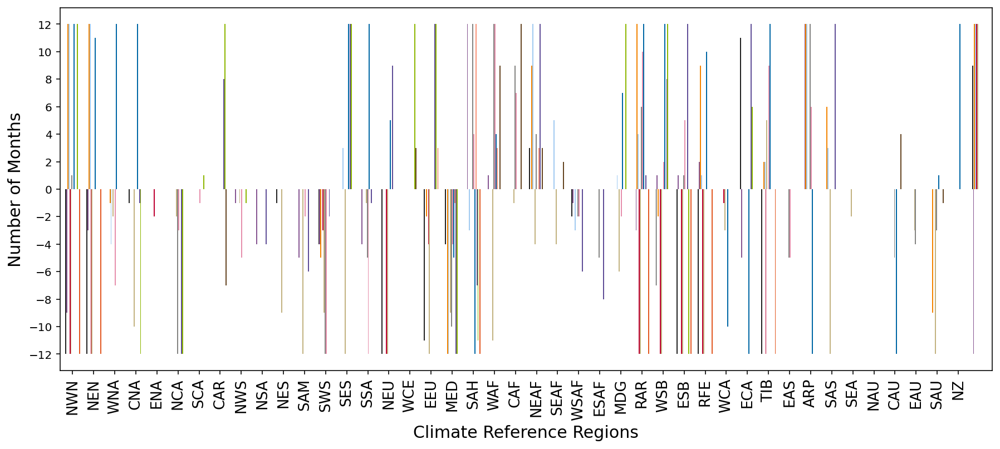

In [135]:
model = ['ACCESS-CM2', 'CanESM5', 'CESM2', 'CESM2-WACCM', 'CNRM-CM6-1', 'CNRM-ESM2-1', 'EC-Earth3', 'EC-Earth3-Veg', 
         'GFDL-ESM4', 'IPSL-CM6A-LR', 'MIROC6', 'MIROC-ES2L', 'MPI-ESM1-2-HR', 'UKESM1-0-LL']

first_four_up_SS126 = df_up_SS126[model[0:15]]

ax = first_four_up_SS126.loc[1:44].plot.bar( figsize=(30,8), cmap=cmap, rot=0, width = 0.7, legend=False)
plt.ylabel('Number of Months', fontsize=15)
plt.xticks(np.linspace(0, 42, 43), region_abbrev[1:44], rotation = 90, fontsize=13);


first_four_down_SS126 = -1 * df_down_SS126[model[0:15]]
first_four_down_SS126.loc[1:44].plot.bar(ax= ax,figsize=(15,6), cmap=cmap, rot=0, width = 0.7, legend=False)
plt.xlabel('Climate Reference Regions', fontsize=15)
plt.ylabel('Number of Months', fontsize=15)
plt.xticks(np.linspace(0, 42, 43), region_abbrev[1:44], rotation = 90);
plt.yticks(np.linspace(-12, 12, 13));

plt.savefig('SS126_num_mon_dep.png', bbox_inches='tight', dpi=250)

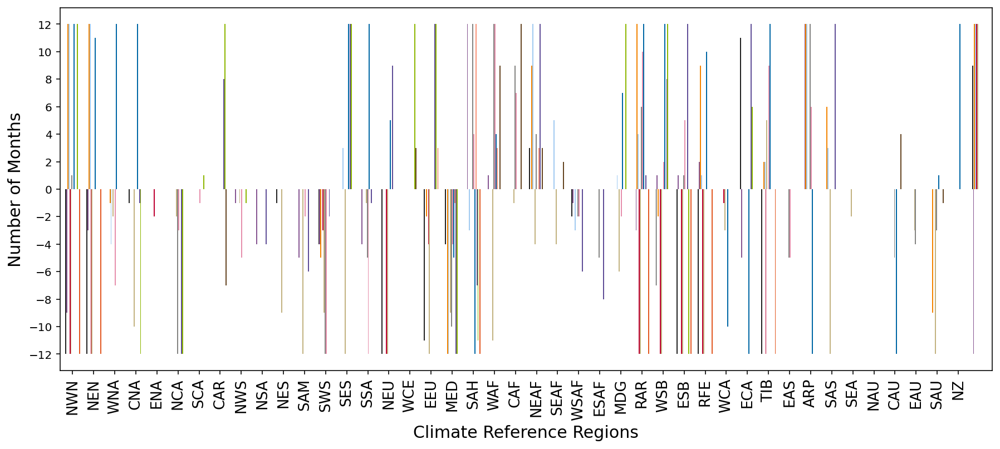

In [136]:
first_four_up_SS126 = df_up_SS126[model[0:15]]

ax = first_four_up_SS126.loc[1:44].plot.bar( figsize=(30,8), cmap=cmap, rot=0, width = 0.7, legend=False)
plt.ylabel('Number of Months', fontsize=15)
plt.xticks(np.linspace(0, 42, 43), region_abbrev[1:44], rotation = 90, fontsize=13);


first_four_down_SS126 = -1 * df_down_SS126[model[0:15]]
first_four_down_SS126.loc[1:44].plot.bar(ax= ax,figsize=(15,6), cmap=cmap, rot=0, width = 0.7, legend=False)
plt.xlabel('Climate Reference Regions', fontsize=15)
plt.ylabel('Number of Months', fontsize=15)
plt.xticks(np.linspace(0, 42, 43), region_abbrev[1:44], rotation = 90);
plt.yticks(np.linspace(-12, 12, 13));

plt.savefig('SS126_num_mon_dep.png', bbox_inches='tight', dpi=250)

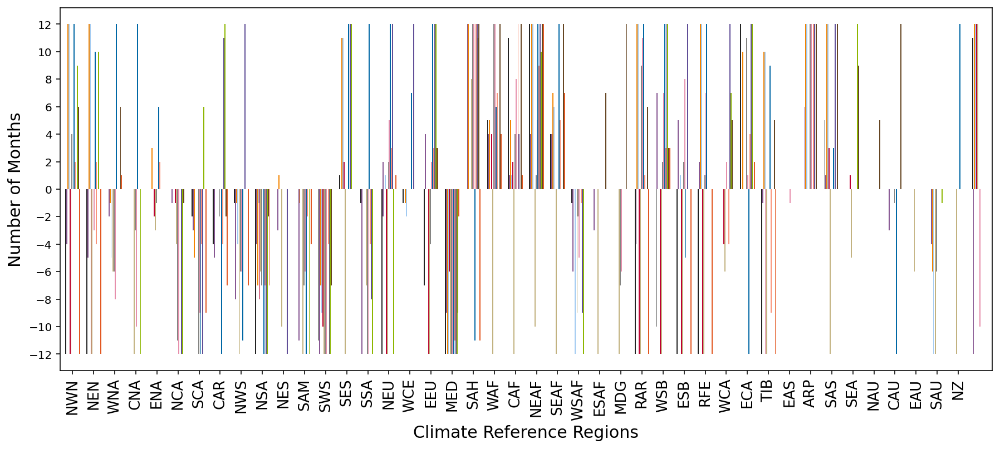

In [137]:
first_four_up_SS370 = df_up_SS370[model[0:15]] 
ax = first_four_up_SS370.loc[1:44].plot.bar(figsize=(15,8), cmap=cmap, rot=0, width = 0.7, legend=False)
plt.ylabel('Number of Months', fontsize=15)
plt.xticks(np.linspace(0, 42, 43), region_abbrev[1:44], rotation = 90, fontsize=13);


first_four_down_SS370 = -1 * df_down_SS370[model[0:15]] 
first_four_down_SS370.loc[1:44].plot.bar(ax= ax, figsize=(15,6), cmap=cmap, rot=0, width = 0.7, legend=False)
plt.xlabel('Climate Reference Regions', fontsize=15)
plt.ylabel('Number of Months', fontsize=15)
plt.xticks(np.linspace(0, 42, 43), region_abbrev[1:44], rotation = 90);
plt.yticks(np.linspace(-12, 12, 13));

plt.savefig('SS370_num_mon_dep.png', bbox_inches='tight', dpi=250)

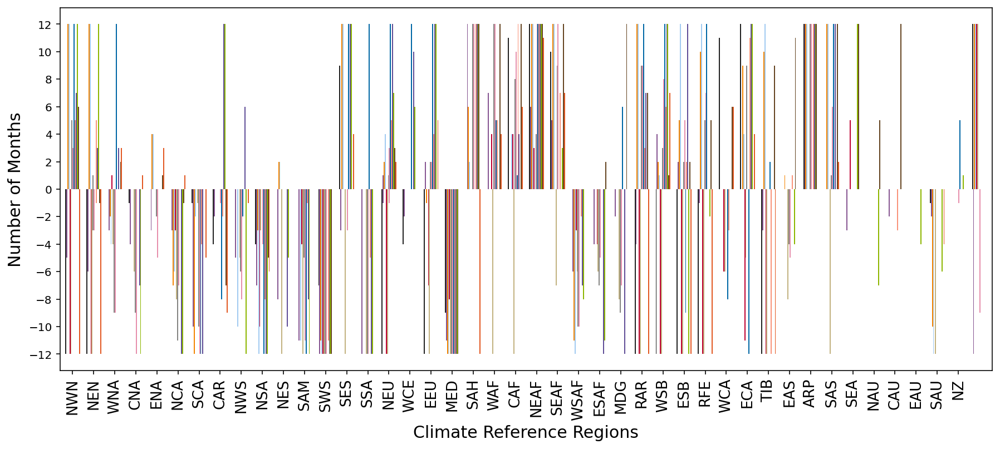

In [138]:
first_four_up_SS585 = df_up_SS585[model[0:14]] 
ax = first_four_up_SS585.loc[1:44].plot.bar(figsize=(15,6), cmap=cmap, rot=0, width = 0.7, legend=False)
plt.ylabel('Number of Months', fontsize=15)
plt.xticks(np.linspace(0, 42, 43), region_abbrev[1:44], rotation = 90, fontsize=13);


first_four_down_SS585 = -1 * df_down_SS585[model[0:14]] 
first_four_down_SS585.loc[1:44].plot.bar(ax= ax, figsize=(15,6), cmap=cmap, rot=0, width = 0.7, legend = False)
plt.xlabel('Climate Reference Regions', fontsize=15)
plt.ylabel('Number of Months', fontsize=15)
plt.xticks(np.linspace(0, 42, 43), region_abbrev[1:44], rotation = 90);
plt.yticks(np.linspace(-12, 12, 13));

plt.savefig('SS585_num_mon_dep.png', bbox_inches='tight', dpi=250)

In [188]:
toe_down_SS126_all_TT = np.transpose(toe_down_SS126_all_T_month)[1:44]
toe_down_SS245_all_TT = np.transpose(toe_down_SS245_all_T_month)[1:44]
toe_down_SS370_all_TT = np.transpose(toe_down_SS370_all_T_month)[1:44]
toe_down_SS585_all_TT = np.transpose(toe_down_SS585_all_T_month)[1:44]

toe_up_SS126_all_TT = np.transpose(toe_up_SS126_all_T_month)[1:44]
toe_up_SS245_all_TT = np.transpose(toe_up_SS245_all_T_month)[1:44]
toe_up_SS370_all_TT = np.transpose(toe_up_SS370_all_T_month)[1:44]
toe_up_SS585_all_TT = np.transpose(toe_up_SS585_all_T_month)[1:44]


# number of months
# frequency of the number of months across each model and region

def month_frequency(toe_down_SS126_all_TT, model):
    zero = 0
    one = 0
    two = 0
    three = 0
    four = 0
    five = 0
    six = 0
    seven = 0
    eight = 0
    nine = 0
    ten = 0
    eleven = 0
    twelve = 0

    for i in range(len(toe_down_SS126_all_TT)):
        for j in range(len(model)):
            if toe_down_SS126_all_TT[i][j] == 0:
                zero += 1
            if toe_down_SS126_all_TT[i][j] == 1:  
                one += 1
            if toe_down_SS126_all_TT[i][j] == 2:
                two += 1
            if toe_down_SS126_all_TT[i][j] == 3:
                three += 1
            if toe_down_SS126_all_TT[i][j] == 4:
                four += 1
            if toe_down_SS126_all_TT[i][j] == 5:
                five += 1
            if toe_down_SS126_all_TT[i][j] == 6:
                six += 1
            if toe_down_SS126_all_TT[i][j] == 7:
                seven += 1
            if toe_down_SS126_all_TT[i][j] == 8:
                eight += 1
            if toe_down_SS126_all_TT[i][j] == 9:
                nine += 1
            if toe_down_SS126_all_TT[i][j] == 10:
                ten += 1
            if toe_down_SS126_all_TT[i][j] == 11:
                eleven += 1
            if toe_down_SS126_all_TT[i][j] == 12:
                twelve += 1

    frequency = np.array([zero, one, two, three, four, five, six, seven, eight, nine, ten, eleven, twelve])
    
    return frequency

In [140]:
def zero(toe_down_SS126_all_TT, toe_up_SS126_all_TT):
    zero = 0
    for i in range(43):
        for j in range(len(model)):
            if toe_down_SS126_all_TT[i][j] == 0 and toe_up_SS126_all_TT[i][j] == 0:
                zero += 1
                
    return zero

zero_126 = zero(toe_down_SS126_all_TT, toe_up_SS126_all_TT)
zero_245 = zero(toe_down_SS245_all_TT, toe_up_SS245_all_TT)
zero_370 = zero(toe_down_SS370_all_TT, toe_up_SS370_all_TT)
zero_585 = zero(toe_down_SS585_all_TT, toe_up_SS585_all_TT)


In [141]:
frequency_SS126_down = month_frequency(toe_down_SS126_all_TT, model)
frequency_SS245_down = month_frequency(toe_down_SS245_all_TT, model)
frequency_SS370_down = month_frequency(toe_down_SS370_all_TT, model)
frequency_SS585_down = month_frequency(toe_down_SS585_all_TT, model)

frequency_SS126_up = month_frequency(toe_up_SS126_all_TT, model)
frequency_SS245_up = month_frequency(toe_up_SS245_all_TT, model)
frequency_SS370_up = month_frequency(toe_up_SS370_all_TT, model)
frequency_SS585_up = month_frequency(toe_up_SS585_all_TT, model)

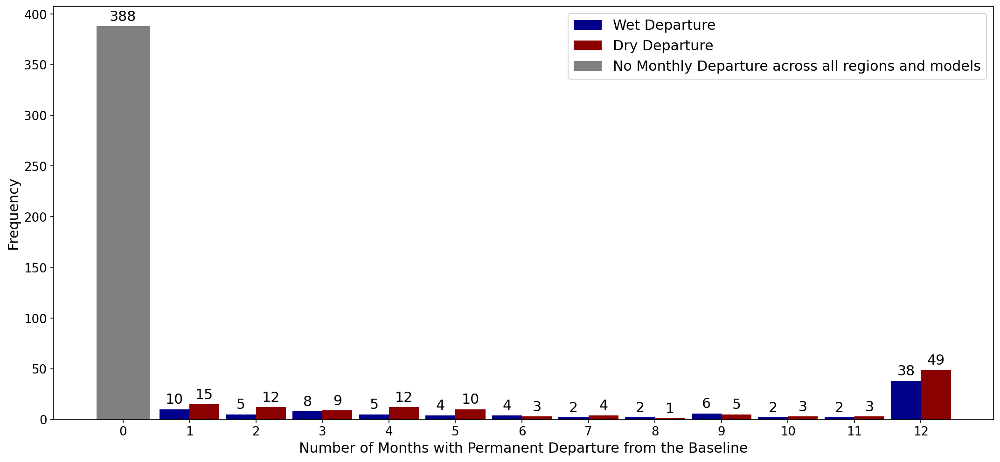

In [142]:
### SS126

frequency_SS126_up_zero = frequency_SS126_up[1:]
frequency_SS126_down_zero = frequency_SS126_down[1:]
#frequency_SS126_up_zero.insert(0, np.nan)
#frequency_SS126_down_zero.insert(0, np.nan)

labels = np.arange(0, 13, 1) # the label locations
x =  np.arange(1, 13, 1) #np.arange(len(labels))
width = 0.45  # the width of the bars


#plt.figure(figsize=(15, 8))
fig, ax = plt.subplots(figsize=(15, 7))
rects1 = ax.bar(x - width/2, frequency_SS126_up_zero, width, label='Wet Departure', color='darkblue')
rects2 = ax.bar(x + width/2, frequency_SS126_down_zero, width, label='Dry Departure', color='darkred')
rects0 = ax.bar(0, zero_126, label='No Monthly Departure across all regions and models', color='grey')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Frequency', fontsize = 15)
ax.set_xlabel('Number of Months with Permanent Departure from the Baseline' , fontsize = 15)
#ax.set_title('Frequency of the Number of Months with Permanent Departure across Each Model and Region [SSP1-2.6]', fontsize = 15)
ax.set_xticks(labels)
ax.set_xticklabels(labels, fontsize = 13)
ax.legend(fontsize = 15)

ax.bar_label(rects1, padding=3, fmt='%d', fontsize = 15)
ax.bar_label(rects2, padding=3 , fmt='%d', fontsize = 15)

ax.bar_label(rects0, padding=3 , fmt='%d', fontsize = 15)

plt.yticks(fontsize=13)
fig.tight_layout()

#ax.bar(0,500)

plt.show()

fig.savefig('SS126_freq_num_mon_dep.png', bbox_inches='tight', dpi=250)

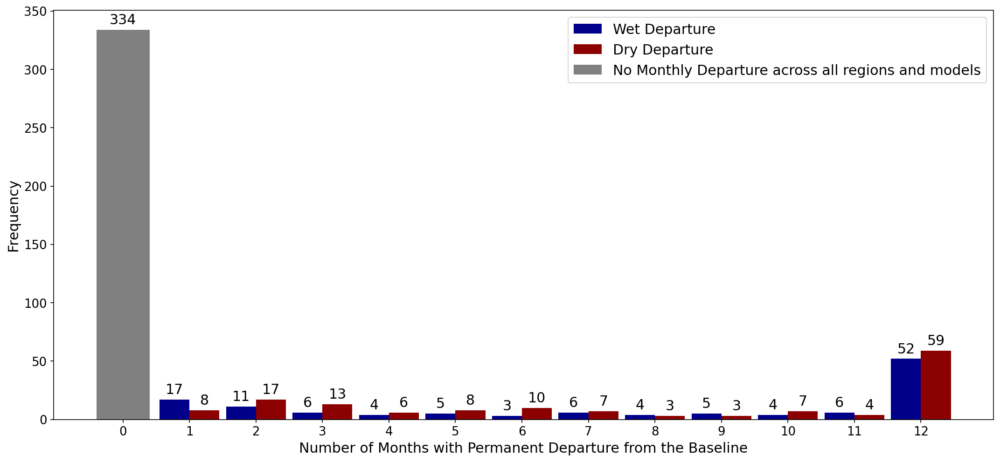

In [143]:
### SS245

frequency_SS245_up_zero = frequency_SS245_up[1:]
frequency_SS245_down_zero = frequency_SS245_down[1:]
#frequency_SS245_up_zero.insert(0, np.nan)
#frequency_SS245_down_zero.insert(0, np.nan)

labels = np.arange(0, 13, 1) # the label locations
x =  np.arange(1, 13, 1) #np.arange(len(labels))
width = 0.45  # the width of the bars


#plt.figure(figsize=(15, 8))
fig, ax = plt.subplots(figsize=(15, 7))
rects1 = ax.bar(x - width/2, frequency_SS245_up_zero, width, label='Wet Departure', color='darkblue')
rects2 = ax.bar(x + width/2, frequency_SS245_down_zero, width, label='Dry Departure', color='darkred')
rects0 = ax.bar(0, zero_245, label='No Monthly Departure across all regions and models', color='grey')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Frequency', fontsize = 15)
ax.set_xlabel('Number of Months with Permanent Departure from the Baseline' , fontsize = 15)
#ax.set_title('Frequency of the Number of Months with Permanent Departure across Each Model and Region [SSP2-4.5]', fontsize = 15)
ax.set_xticks(labels)
ax.set_xticklabels(labels, fontsize = 13)
ax.legend(fontsize = 15)
plt.yticks(fontsize=13)

ax.bar_label(rects1, padding=3, fmt='%d', fontsize = 15)
ax.bar_label(rects2, padding=3 , fmt='%d', fontsize = 15)

ax.bar_label(rects0, padding=3 , fmt='%d', fontsize = 15)


fig.tight_layout()

#ax.bar(0,500)

#plt.show()

fig.savefig('SS245_freq_num_mon_dep.png', bbox_inches='tight', dpi=250)


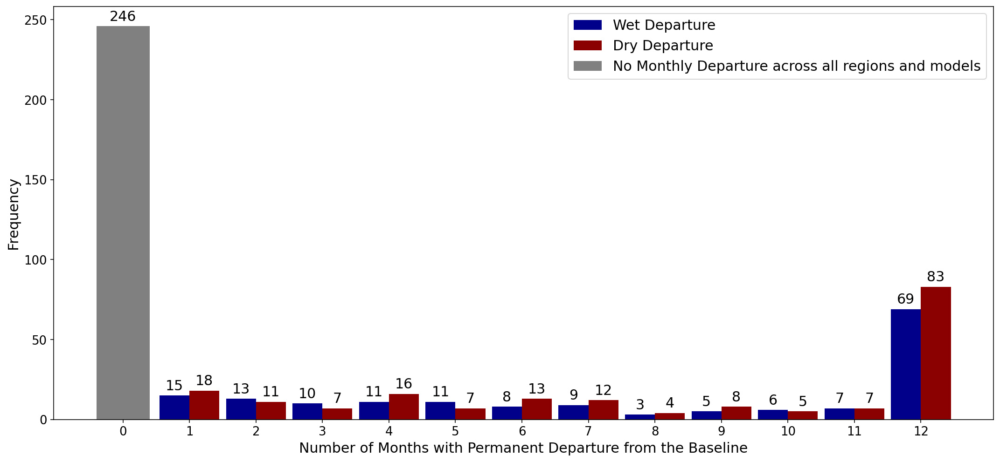

In [144]:
### SS370

frequency_SS370_up_zero = frequency_SS370_up[1:]
frequency_SS370_down_zero = frequency_SS370_down[1:]
#frequency_SS370_up_zero.insert(0, np.nan)
#frequency_SS370_down_zero.insert(0, np.nan)

labels = np.arange(0, 13, 1) # the label locations
x =  np.arange(1, 13, 1) #np.arange(len(labels))
width = 0.45  # the width of the bars


#plt.figure(figsize=(15, 8))
fig, ax = plt.subplots(figsize=(15, 7))
rects1 = ax.bar(x - width/2, frequency_SS370_up_zero, width, label='Wet Departure', color='darkblue')
rects2 = ax.bar(x + width/2, frequency_SS370_down_zero, width, label='Dry Departure', color='darkred')
rects0 = ax.bar(0, zero_370, label='No Monthly Departure across all regions and models', color='grey')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Frequency', fontsize = 15)
ax.set_xlabel('Number of Months with Permanent Departure from the Baseline' , fontsize = 15)
#ax.set_title('Frequency of the Number of Months with Permanent Departure across Each Model and Region [SSP3-7.0]', fontsize = 15)
ax.set_xticks(labels)
ax.set_xticklabels(labels, fontsize = 13)
ax.legend(fontsize = 15)
plt.yticks(fontsize=13)

ax.bar_label(rects1, padding=3, fmt='%d', fontsize = 15)
ax.bar_label(rects2, padding=3 , fmt='%d', fontsize = 15)

ax.bar_label(rects0, padding=3 , fmt='%d', fontsize = 15)


fig.tight_layout()

#ax.bar(0,500)

plt.show()

fig.savefig('SS370_freq_num_mon_dep.png', bbox_inches='tight', dpi=250)

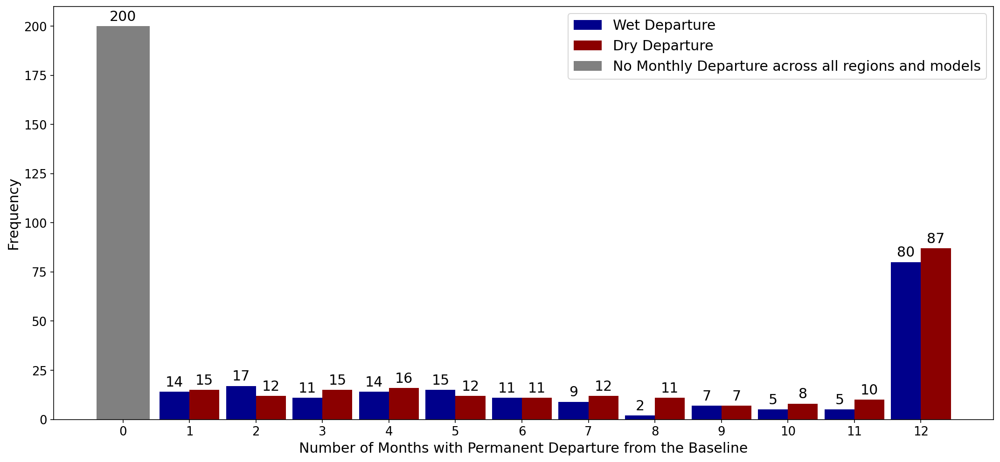

In [145]:
### SS585

frequency_SS585_up_zero = frequency_SS585_up[1:]
frequency_SS585_down_zero = frequency_SS585_down[1:]
#frequency_SS585_up_zero.insert(0, np.nan)
#frequency_SS585_down_zero.insert(0, np.nan)

labels = np.arange(0, 13, 1) # the label locations
x =  np.arange(1, 13, 1) #np.arange(len(labels))
width = 0.45  # the width of the bars


#plt.figure(figsize=(15, 8))
fig, ax = plt.subplots(figsize=(15, 7))
rects1 = ax.bar(x - width/2, frequency_SS585_up_zero, width, label='Wet Departure', color='darkblue')
rects2 = ax.bar(x + width/2, frequency_SS585_down_zero, width, label='Dry Departure', color='darkred')
rects0 = ax.bar(0, zero_585, label='No Monthly Departure across all regions and models', color='grey')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Frequency', fontsize = 15)
ax.set_xlabel('Number of Months with Permanent Departure from the Baseline' , fontsize = 15)
#ax.set_title('Frequency of the Number of Months with Permanent Departure across Each Model and Region [SSP5-8.5]', fontsize = 15)
ax.set_xticks(labels)
ax.set_xticklabels(labels, fontsize = 13)
ax.legend(fontsize = 15)
plt.yticks(fontsize=13)

ax.bar_label(rects1, padding=3, fmt='%d', fontsize = 15)
ax.bar_label(rects2, padding=3 , fmt='%d', fontsize = 15)

ax.bar_label(rects0, padding=3 , fmt='%d', fontsize = 15)


fig.tight_layout()

#ax.bar(0,500)

plt.show()
fig.savefig('SS585_freq_num_mon_dep.png', bbox_inches='tight', dpi=250)


# Percentage of Land Surface Area with Departures

In [137]:
import datetime

In [138]:
def icefree_regional_area_below_n5(SSP_yearly_average, PC_n5, regional_area, time):
    region_exiting_n5 = [] #shape (n, 46)
    for n in range(len(time)):
        difference = SSP_yearly_average[n] - PC_n5  # shape SSP: (14, 46, 960), pcn5: (14,46, 12) call the function monthly, but ocn5 different for each month
        region_more = []
        for j in range(46):
            if difference[j] < 0:
                region_more.append(regional_area[j])
            else:
                region_more.append(0)
        region_exiting_n5.append(region_more)

    region_exiting_n5_icefree = np.transpose(region_exiting_n5)[1:44] #shape(43, n)
    region_exiting_n5_icefree = np.transpose(region_exiting_n5_icefree)  #(n, 43)

    area_region_icefree_exiting_n5 = []   #shpe (n, 1)
    for i in range(len(region_exiting_n5_icefree)):
        area = np.sum(region_exiting_n5_icefree[i])
        area_region_icefree_exiting_n5.append(area)

    return area_region_icefree_exiting_n5   
#region_exiting_n5[499]


def icefree_regional_area_above_n95(SSP_yearly_average, PC_n95, regional_area, time):
    region_exiting_n95 = [] #shape (n, 46)
    for n in range(len(time)):
        difference = SSP_yearly_average[n] - PC_n95  # shape SSP: (), pcn95: (14,46)
        region_more = []
        for j in range(46):
            if difference[j] >= 0:
                region_more.append(regional_area[j])
            else:
                region_more.append(0)
        region_exiting_n95.append(region_more)

    region_exiting_n95_icefree = np.transpose(region_exiting_n95)[1:44] #shape(43, n)
    region_exiting_n95_icefree = np.transpose(region_exiting_n95_icefree)  #(n, 43)

    area_region_icefree_exiting_n95 = []   #shpe (n, 1)
    for i in range(len(region_exiting_n95_icefree)):
        area = np.sum(region_exiting_n95_icefree[i])
        area_region_icefree_exiting_n95.append(area)

    return area_region_icefree_exiting_n95   
#region_exiting_n95[499]


import math

def regional_area(area_list, sft_list, ds_list):
    arealand = apply_mask(area_list, sft_list, realm)
    PC_yearly_average = ds_list.mrso.groupby("time.year").mean("time")
    mask_2D = ar6_land.mask(PC_yearly_average)

    area_value = arealand.areacella.values
    for i in range(len(area_value)):
        for j in range(len(area_value[0])):
            if math.isnan(area_value[i][j]) == True:
                area_value[i][j] = 0

    area_region = []
    for i in range(46):
        area = area_value[mask_2D == i].sum()
        area_region.append(area)
    
    return area_region
   

In [139]:
def SSP_monthly_average(ds_SS245_list):
    SS245_monthly_average = ds_SS245_list.mrso #.groupby("time.year").mean("time")
    mask_2D = ar6_land.mask(SS245_monthly_average)
    mask_3D = ar6_land.mask_3D(SS245_monthly_average)
    weights = np.cos(np.deg2rad(SS245_monthly_average.lat)) ### just to estimate the weight

    SS245_regional = ds_SS245_list.mrso.loc['2021-01-01':'2101-01-01'].weighted(mask_3D * weights).mean(dim=("lat", "lon"))  # each region, monthly mean of the region
    #SS245_regional_yearly_mean = SS245_regional.groupby('time.year').mean('time') 
    #SS245_regional_yearly_mean_value = SS245_regional_yearly_mean.values
    SS245_regional_monthly_mean_value = SS245_regional.values
    
    return SS245_regional_monthly_mean_value

def SSP_yearly_average(ds_SS245_list):
    SS245_yearly_average = ds_SS245_list.mrso.loc['2021-01-01':'2101-01-01'].groupby("time.year").mean("time")
    mask_2D = ar6_land.mask(SS245_yearly_average)
    mask_3D = ar6_land.mask_3D(SS245_yearly_average)
    weights = np.cos(np.deg2rad(SS245_yearly_average.lat)) ### just to estimate the weight

    SS245_regional = SS245_yearly_average.weighted(mask_3D * weights).mean(dim=("lat", "lon"))  # each region, monthly mean of the region
    #SS245_regional_yearly_mean = SS245_regional.groupby('time.year').mean('time') 
    #SS245_regional_yearly_mean_value = SS245_regional_yearly_mean.values
    SS245_regional_yearly_mean_value = SS245_regional.values
    
    return SS245_regional_yearly_mean_value

def area_per_region_below_n5(SSP_yearly_average, PC_n5, regional_area, time):
    region_exiting_n5 = [] #shape (n, 46)
    for n in range(len(time)):
        difference = SSP_yearly_average[n] - PC_n5  # shape SSP: (), pcn5: (14,46)
        region_more = []
        for j in range(46):
            if difference[j] < 0:
                region_more.append(regional_area[j])
            else:
                region_more.append(0)
        region_exiting_n5.append(region_more)

    return region_exiting_n5

def area_per_region_above_n95(SSP_yearly_average, PC_n95, regional_area, time):
    region_exiting_n95 = [] #shape (n, 46)
    for n in range(len(time)):
        difference = SSP_yearly_average[n] - PC_n95  # shape SSP: (), pcn95: (14,46)
        region_more = []
        for j in range(46):
            if difference[j] > 0:
                region_more.append(regional_area[j])
            else:
                region_more.append(0)
        region_exiting_n95.append(region_more)

    return region_exiting_n95


def yearly_area_per_region_above_n95(yearly_mean_SS126_list_T, PC_n95, regional_area, year_once):
    region_exiting_n95 = [] #shape (n, 46)
    for n in range(len(year_once)):
        difference = yearly_mean_SS126_list_T[n] - PC_n95  # shape SSP: (80, 46), pcn95: (14,46)
        region_more = []
        for j in range(46):
            if difference[j] > 0:
                region_more.append(regional_area[j])
            else:
                region_more.append(0)
        region_exiting_n95.append(region_more)

    return region_exiting_n95

In [140]:
def all_years(ds_SS245_list):
    values = ds_SS245_list.mrso.loc['2021-01-01':'2101-01-01'].groupby('time.year').mean('time')  # each region, monthly mean of the region
    year_value = values.year.values
    
    return year_value



allyears = all_years(ds_SS245_list[0])
#len(allyears)

In [141]:
year_once = np.linspace(2021, 2100, 80)

def yearly_area_per_region_below_n5(yearly_mean_SS126_list_T, PC_n5, regional_area, year_once):
    region_exiting_n5 = [] #shape (n, 46)
    for n in range(len(year_once)):
        difference = yearly_mean_SS126_list_T[n] - PC_n5  # shape SSP: (80, 46), pcn5: (14,46)
        region_more = []
        for j in range(46):
            if difference[j] < 0:
                region_more.append(regional_area[j])
            else:
                region_more.append(0)
        region_exiting_n5.append(region_more)

    return region_exiting_n5

data = ds_SS585_list[1].mrso.loc['2021-01-01':'2101-01-01'] ### this is just to get the time
year = data.time.dt.year.values
#toe_down_SS585_median_abs = np.abs(toe_down_SS585_median)

area_icefree_all = []
for i in range(len(model)):
    area = np.sum(regional_area(area_list[i], sft_list[i], ds_list[i])[1:44])   # still need to see maybe average it?
    area_icefree_all.append(area)
area_icefree = np.mean(area_icefree_all)

data_1 = ds_SS585_list[0].mrso.loc['2021-01-01':'2101-01-01'] ### this is just to get the time
time = data_1.time.dt.date.values
year_once = np.arange(2021, 2101, 1)
#year_once
#time

In [142]:
#try SS126 dry MONTHLY!!!
    
def monthly_area_dry_departure(piControl_5th_list_month, year_once, ds_SS126_list, area_list, sft_list, ds_list, time):
    perc_126_dry_monthly_all = []
    for k in range(14):
        pc_5_monthly_list = []
        for i in range(len(year_once)):
            for j in range(12):
                pc_5_monthly_list.append(piControl_5th_list_month[k][j])

        ssp_monthly_126 = SSP_monthly_average(ds_SS126_list[k])
        area_per_region = regional_area(area_list[k], sft_list[k], ds_list[k])
        region_exiting_n5 = [] #shape (n, 46)
        for n in range(len(time)):
            difference = ssp_monthly_126[n] - pc_5_monthly_list[n]  # shape SSP: (14, 46, 960), pcn5: (14,46, 12) call the function monthly, but ocn5 different for each month
            region_more = []
            for j in range(46):
                if difference[j] < 0:
                    region_more.append(area_per_region[j])
                else:
                    region_more.append(0)
            region_exiting_n5.append(region_more)

        region_exiting_n5_icefree = np.transpose(region_exiting_n5)[1:44] #shape(43, n)
        region_exiting_n5_icefree = np.transpose(region_exiting_n5_icefree)  #(n, 43)

        area_region_icefree_exiting_n5 = []   #shpe (n, 1)
        for i in range(len(region_exiting_n5_icefree)):
            area = np.sum(region_exiting_n5_icefree[i])
            area_region_icefree_exiting_n5.append(area)

        percentage_month_126 = []
        for j in range(len(area_region_icefree_exiting_n5)):
            percent = area_region_icefree_exiting_n5[j] * 100/ area_icefree_all[k]
            percentage_month_126.append(percent)

        #plt.figure()
        #plt.plot(time, percentage_month_126, 'darkred')
        #plt.title("ss126, dry, monthly")

        perc_126_dry_monthly_all.append(percentage_month_126)

    median_perc_SS126_dry_monthly = []
    for i in range(len(np.transpose(perc_126_dry_monthly_all))):  #(80, 14)
        median = np.median(np.transpose(perc_126_dry_monthly_all)[i])
        median_perc_SS126_dry_monthly.append(median)

    return median_perc_SS126_dry_monthly

#plt.plot(time, median_perc_SS126_dry_monthly, 'darkred')
#plt.title("median, dry, 126, monthly")

In [148]:
median_percentage_area_SS126_dry_monthly = monthly_area_dry_departure(piControl_5th_list_month, year_once, ds_SS126_list, area_list, sft_list, ds_list, time)
median_percentage_area_SS245_dry_monthly = monthly_area_dry_departure(piControl_5th_list_month, year_once, ds_SS245_list, area_list, sft_list, ds_list, time)
median_percentage_area_SS370_dry_monthly = monthly_area_dry_departure(piControl_5th_list_month, year_once, ds_SS370_list, area_list, sft_list, ds_list, time)
median_percentage_area_SS585_dry_monthly = monthly_area_dry_departure(piControl_5th_list_month, year_once, ds_SS585_list, area_list, sft_list, ds_list, time)


In [149]:
#try SS126 wet MONTHLY!!!
    
def monthly_area_wet_departure(piControl_95th_list_month, year_once, ds_SS126_list, area_list, sft_list, ds_list, time):
    perc_126_wet_monthly_all = []
    for k in range(14):
        pc_95_monthly_list = []
        for i in range(len(year_once)):
            for j in range(12):
                pc_95_monthly_list.append(piControl_95th_list_month[k][j])

        ssp_monthly_126 = SSP_monthly_average(ds_SS126_list[k])
        area_per_region = regional_area(area_list[k], sft_list[k], ds_list[k])
        region_exiting_n95 = [] #shape (n, 46)
        for n in range(len(time)):
            difference = ssp_monthly_126[n] - pc_95_monthly_list[n]  # shape SSP: (14, 46, 960), pcn5: (14,46, 12) call the function monthly, but ocn5 different for each month
            region_more = []
            for j in range(46):
                if difference[j] > 0:
                    region_more.append(area_per_region[j])
                else:
                    region_more.append(0)
            region_exiting_n95.append(region_more)

        region_exiting_n95_icefree = np.transpose(region_exiting_n95)[1:44] #shape(43, n)
        region_exiting_n95_icefree = np.transpose(region_exiting_n95_icefree)  #(n, 43)

        area_region_icefree_exiting_n95 = []   #shpe (n, 1)
        for i in range(len(region_exiting_n95_icefree)):
            area = np.sum(region_exiting_n95_icefree[i])
            area_region_icefree_exiting_n95.append(area)

        percentage_month_126 = []
        for j in range(len(area_region_icefree_exiting_n95)):
            percent = area_region_icefree_exiting_n95[j] * 100/ area_icefree_all[k]
            percentage_month_126.append(percent)

        #plt.figure()
        #plt.plot(time, percentage_month_126, 'darkred')
        #plt.title("ss126, wet, monthly")

        perc_126_wet_monthly_all.append(percentage_month_126)

    median_perc_SS126_wet_monthly = []
    for i in range(len(np.transpose(perc_126_wet_monthly_all))):  #(80, 14)
        median = np.median(np.transpose(perc_126_wet_monthly_all)[i])
        median_perc_SS126_wet_monthly.append(median)

    return median_perc_SS126_wet_monthly

#plt.plot(time, median_perc_SS126_wet_monthly, 'darkred')
#plt.title("median, wet, 126, monthly")

In [150]:
median_percentage_area_SS126_wet_monthly = monthly_area_wet_departure(piControl_95th_list_month, year_once, ds_SS126_list, area_list, sft_list, ds_list, time)
median_percentage_area_SS245_wet_monthly = monthly_area_wet_departure(piControl_95th_list_month, year_once, ds_SS245_list, area_list, sft_list, ds_list, time)
median_percentage_area_SS370_wet_monthly = monthly_area_wet_departure(piControl_95th_list_month, year_once, ds_SS370_list, area_list, sft_list, ds_list, time)
median_percentage_area_SS585_wet_monthly = monthly_area_wet_departure(piControl_95th_list_month, year_once, ds_SS585_list, area_list, sft_list, ds_list, time)


In [151]:
#SS126 wet MONTHLY!!!

perc_126_wet_monthly_all = []
for k in range(14):
    pc_95_monthly_list = []
    for i in range(len(year_once)):
        for j in range(12):
            pc_95_monthly_list.append(piControl_95th_list_month[k][j])

    ssp_monthly_126 = SSP_monthly_average(ds_SS126_list[k])
    area_per_region = regional_area(area_list[k], sft_list[k], ds_list[k])
    region_exiting_n95 = [] #shape (n, 46)
    for n in range(len(time)):
        difference = ssp_monthly_126[n] - pc_95_monthly_list[n]  # shape SSP: (14, 46, 960), pcn5: (14,46, 12) call the function monthly, but ocn5 different for each month
        region_more = []
        for j in range(46):
            if difference[j] > 0:
                region_more.append(area_per_region[j])
            else:
                region_more.append(0)
        region_exiting_n95.append(region_more)


    area_total = []  #(46, 960)
    for i in range(46):
        area_region = np.zeros(len(year)) #[]
        for j in range(len(year)):
            if toe_up_SS126_all_year[k][i] == 0:
                area_region[j] = 0
            if toe_up_SS126_all_year[k][i] > 2095:
                area_region[j] = 0
            if toe_up_SS126_all_year[k][i] <= 2095 and toe_up_SS126_all_year[k][i] > 0:
                if year[j] >= toe_up_SS126_all_year[k][i]:
                    area_region[j] = np.transpose(region_exiting_n95)[i][j]  #(46,n)
                else:
                    area_region[j] = 0

        area_total.append(area_region)

    region_exiting_n95_icefree = area_total[1:44] #shape(43, n)
    region_exiting_n95_icefree = np.transpose(region_exiting_n95_icefree)  #(n, 43)


    area_region_icefree_exiting_n95 = []   #shpe (n, 1)
    for i in range(len(region_exiting_n95_icefree)):
        area = np.sum(region_exiting_n95_icefree[i])  #(960,43)
        area_region_icefree_exiting_n95.append(area)


    percentage_month_126 = []
    for j in range(len(area_region_icefree_exiting_n95)):
        percent = area_region_icefree_exiting_n95[j] * 100/ area_icefree_all[k]
        percentage_month_126.append(percent)

    #plt.figure()
    #plt.plot(time, percentage_month_126, 'darkred')
    #plt.title("ss126, wet, monthly")

    perc_126_wet_monthly_all.append(percentage_month_126)

median_perc_SS126_wet_monthly_afteremerg = []
for i in range(len(np.transpose(perc_126_wet_monthly_all))):  #(80, 14)
    median = np.median(np.transpose(perc_126_wet_monthly_all)[i])
    median_perc_SS126_wet_monthly_afteremerg.append(median)


yearly_mean_SS126_list_T = []
for i in range(len(model)):
    transp = np.transpose(yearly_mean_SS126_list[i])
    yearly_mean_SS126_list_T.append(transp)
    
### after emergence (yearly data)
region_more_all_allmodels = []
for k in range(len(model)):
    area_per_region = regional_area(area_list[k], sft_list[k], ds_list[k])
    area_region_wet = yearly_area_per_region_above_n95(yearly_mean_SS126_list_T[k], piControl_95th_list[k], area_per_region, year_once)
    
    region_more_all = []
    for m in range(46):
        region_more_region = np.zeros(len(year_once))
        for n in range(len(year_once)):
            if toe_up_SS126_all_year[k][m] == 0:
                region_more_region[n] = 0
            if toe_up_SS126_all_year[k][m] > 2095:
                region_more_region[n] = 0
            if toe_up_SS126_all_year[k][m] <= 2095 and toe_up_SS126_all_year[k][m] > 0:
                if year_once[n] >= toe_up_SS126_all_year[k][m]:
                    region_more_region[n] = np.transpose(area_region_wet)[m][n]
                else:
                    region_more_region[n] = 0
                
         
        region_more_all.append(region_more_region)
        
    region_more_all_allmodels.append(region_more_all)    
        
yearly_percentage_totalarea_wet_afteremergence_SS126 = []
for x in range(len(model)):
    region_more_all_allmodels_T = np.transpose(region_more_all_allmodels[x][1:44])
    Sum = []
    for i in range(len(year_once)):
        T_sum = np.sum(region_more_all_allmodels_T[i])   #(80, )
        Sum.append(T_sum)
        
    yearly_percentage_totalarea_wet_afteremergence_SS126.append(Sum)
        
yearly_percentage_median_wet_afteremergence_SS126 = []
for j in range(len(year_once)):
    med = np.median(np.transpose(yearly_percentage_totalarea_wet_afteremergence_SS126)[j])
    yearly_percentage_median_wet_afteremergence_SS126.append(med*100/area_icefree)

yearly_percentage_all_wet_afteremergence_SS126 = np.zeros(960)
for i in range(len(year_once)):
    #x = np.zeros(12)
    #for j in range(12):
    yearly_percentage_all_wet_afteremergence_SS126[((i+1)* 12)-12 : (i+1)* 12] = yearly_percentage_median_wet_afteremergence_SS126[i]
    #yearly_percentage_all_wet_afteremergence_SS126.append(x)
        
#0:12
#12:24
#24:36
#yearly_percentage_all_wet_afteremergence_SS126             color = 'darkred',

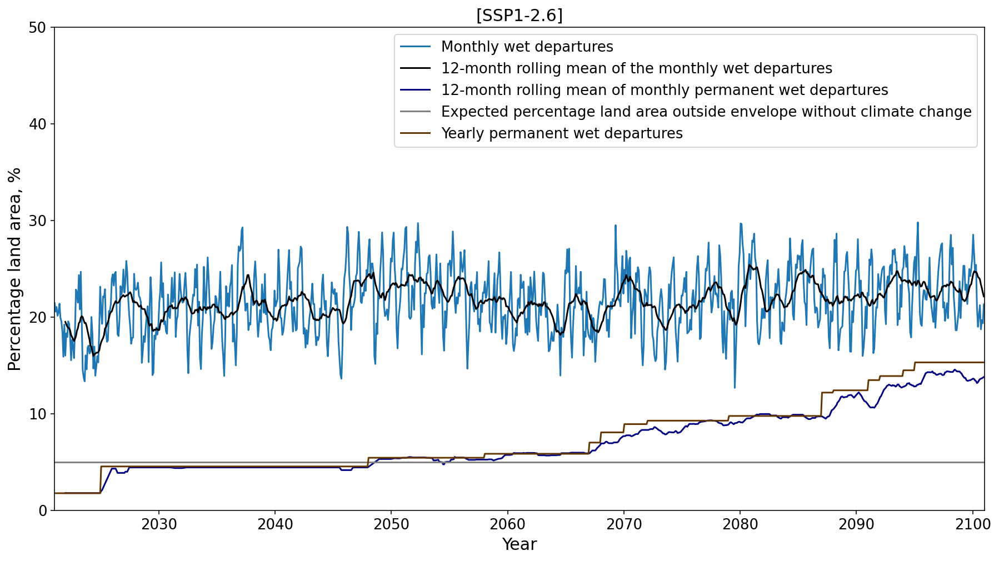

In [152]:
data_roll_monthly_126up = pd.Series(median_percentage_area_SS126_wet_monthly)
Rolling_monthly_percentage_all_wet_SS126 = data_roll_monthly_126up.rolling(12).mean()

plt.figure(figsize=(15,8))
plt.plot(time, median_percentage_area_SS126_wet_monthly, label='Monthly wet departures')
plt.plot(time, Rolling_monthly_percentage_all_wet_SS126, 'black', label='12-month rolling mean of the monthly wet departures')

data_roll_126up = pd.Series(median_perc_SS126_wet_monthly_afteremerg)
rolling_up_126_ae = data_roll_126up.rolling(12).mean()
plt.plot(time, rolling_up_126_ae, 'navy', label='12-month rolling mean of monthly permanent wet departures')
plt.axhline(y=5, color='grey', label='Expected percentage land area outside envelope without climate change')
plt.plot(time, yearly_percentage_all_wet_afteremergence_SS126, color='#653700', label='Yearly permanent wet departures')
plt.xlim((datetime.date(2021, 1, 16), datetime.date(2101, 1, 16)))
plt.ylim((0,50))
#plt.title('Wet Departure [SSP1-2.6]: Percentage land area where the total soil moisture content is above the 95th percentile of the baseline')
plt.title('[SSP1-2.6]', fontsize=15)
plt.xlabel('Year', fontsize=15)
plt.ylabel('Percentage land area, %', fontsize=15)
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.legend(fontsize=13, loc='best');
plt.savefig('wet_125_boundary', dpi = 250, bbox_inches='tight')

In [153]:
#SS245 wet MONTHLY!!!

perc_245_wet_monthly_all = []
for k in range(14):
    pc_95_monthly_list = []
    for i in range(len(year_once)):
        for j in range(12):
            pc_95_monthly_list.append(piControl_95th_list_month[k][j])

    ssp_monthly_245 = SSP_monthly_average(ds_SS245_list[k])
    area_per_region = regional_area(area_list[k], sft_list[k], ds_list[k])
    region_exiting_n95 = [] #shape (n, 46)
    for n in range(len(time)):
        difference = ssp_monthly_245[n] - pc_95_monthly_list[n]  # shape SSP: (14, 46, 960), pcn5: (14,46, 12) call the function monthly, but ocn5 different for each month
        region_more = []
        for j in range(46):
            if difference[j] > 0:
                region_more.append(area_per_region[j])
            else:
                region_more.append(0)
        region_exiting_n95.append(region_more)


    area_total = []  #(46, 960)
    for i in range(46):
        area_region = np.zeros(len(year)) #[]
        for j in range(len(year)):
            if toe_up_SS245_all_year[k][i] == 0:
                area_region[j] = 0
            if toe_up_SS245_all_year[k][i] > 2095:
                area_region[j] = 0
            if toe_up_SS245_all_year[k][i] <= 2095 and toe_up_SS245_all_year[k][i] > 0:
                if year[j] >= toe_up_SS245_all_year[k][i]:
                    area_region[j] = np.transpose(region_exiting_n95)[i][j]  #(46,n)
                else:
                    area_region[j] = 0

        area_total.append(area_region)

    region_exiting_n95_icefree = area_total[1:44] #shape(43, n)
    region_exiting_n95_icefree = np.transpose(region_exiting_n95_icefree)  #(n, 43)


    area_region_icefree_exiting_n95 = []   #shpe (n, 1)
    for i in range(len(region_exiting_n95_icefree)):
        area = np.sum(region_exiting_n95_icefree[i])  #(960,43)
        area_region_icefree_exiting_n95.append(area)


    percentage_month_245 = []
    for j in range(len(area_region_icefree_exiting_n95)):
        percent = area_region_icefree_exiting_n95[j] * 100/ area_icefree_all[k]
        percentage_month_245.append(percent)

    #plt.figure()
    #plt.plot(time, percentage_month_245, 'darkred')
    #plt.title("ss245, wet, monthly")

    perc_245_wet_monthly_all.append(percentage_month_245)

median_perc_SS245_wet_monthly_afteremerg = []
for i in range(len(np.transpose(perc_245_wet_monthly_all))):  #(80, 14)
    median = np.median(np.transpose(perc_245_wet_monthly_all)[i])
    median_perc_SS245_wet_monthly_afteremerg.append(median)


yearly_mean_SS245_list_T = []
for i in range(len(model)):
    transp = np.transpose(yearly_mean_SS245_list[i])
    yearly_mean_SS245_list_T.append(transp)
    

region_more_all_allmodels = []
for k in range(len(model)):
    area_per_region = regional_area(area_list[k], sft_list[k], ds_list[k])
    area_region_wet = yearly_area_per_region_above_n95(yearly_mean_SS245_list_T[k], piControl_95th_list[k], area_per_region, year_once)
    
    region_more_all = []
    for m in range(46):
        region_more_region = np.zeros(len(year_once))
        for n in range(len(year_once)):
            if toe_up_SS245_all_year[k][m] == 0:
                region_more_region[n] = 0
            if toe_up_SS245_all_year[k][m] > 2095:
                region_more_region[n] = 0
            if toe_up_SS245_all_year[k][m] <= 2095 and toe_up_SS245_all_year[k][m] > 0:
                if year_once[n] >= toe_up_SS245_all_year[k][m]:
                    region_more_region[n] = np.transpose(area_region_wet)[m][n]
                else:
                    region_more_region[n] = 0
                
         
        region_more_all.append(region_more_region)
        
    region_more_all_allmodels.append(region_more_all)    
        
### those up and up is because the toe is afetr 2095
yearly_percentage_totalarea_wet_afteremergence_SS245 = []
for x in range(len(model)):
    region_more_all_allmodels_T = np.transpose(region_more_all_allmodels[x][1:44])
    Sum = []
    for i in range(len(year_once)):
        T_sum = np.sum(region_more_all_allmodels_T[i])   #(80, )
        Sum.append(T_sum)
        
    yearly_percentage_totalarea_wet_afteremergence_SS245.append(Sum)
        
yearly_percentage_median_wet_afteremergence_SS245 = []
for j in range(len(year_once)):
    med = np.median(np.transpose(yearly_percentage_totalarea_wet_afteremergence_SS245)[j])
    yearly_percentage_median_wet_afteremergence_SS245.append(med*100/area_icefree)

yearly_percentage_all_wet_afteremergence_SS245 = np.zeros(960)
for i in range(len(year_once)):
    #x = np.zeros(12)
    #for j in range(12):
    yearly_percentage_all_wet_afteremergence_SS245[((i+1)* 12)-12 : (i+1)* 12] = yearly_percentage_median_wet_afteremergence_SS245[i]
    #yearly_percentage_all_wet_afteremergence_SS245.append(x)
        
#0:12
#12:24
#24:36
#yearly_percentage_all_wet_afteremergence_SS245             color = 'darkred',



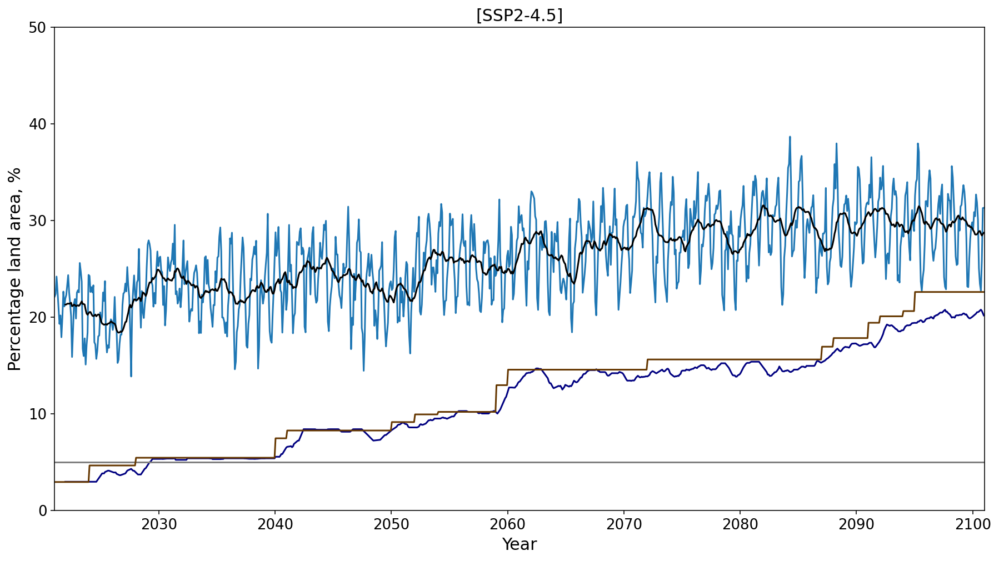

In [154]:
data_roll_monthly_245up = pd.Series(median_percentage_area_SS245_wet_monthly)
Rolling_monthly_percentage_all_wet_SS245 = data_roll_monthly_245up.rolling(12).mean()

plt.figure(figsize=(15,8))
plt.plot(time, median_percentage_area_SS245_wet_monthly, label='Monthly wet departures')
plt.plot(time, Rolling_monthly_percentage_all_wet_SS245, 'black', label='12-month rolling mean of the monthly wet departures')

data_roll_245up = pd.Series(median_perc_SS245_wet_monthly_afteremerg)
rolling_up_245_ae = data_roll_245up.rolling(12).mean()
plt.plot(time, rolling_up_245_ae, 'navy', label='12-month rolling mean of monthly permanent wet departures')
plt.axhline(y=5, color='grey', label='Expected percentage land area outside envelope without climate change')
plt.plot(time, yearly_percentage_all_wet_afteremergence_SS245, color='#653700', label='Yearly permanent wet departures')
plt.xlim((datetime.date(2021, 1, 16), datetime.date(2101, 1, 16)))
plt.ylim((0,50))
#plt.title('Wet Departure [SSP2-4.5]: Percentage land area where the total soil moisture content is above the 95th percentile of the baseline')
plt.title('[SSP2-4.5]', fontsize=15)
plt.xlabel('Year', fontsize=15)
plt.ylabel('Percentage land area, %', fontsize=15)
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
#plt.legend(fontsize=11, loc='best');
plt.savefig('wet_245_boundary', dpi = 250, bbox_inches='tight')

In [156]:
#SS370 wet MONTHLY!!!

perc_370_wet_monthly_all = []
for k in range(14):
    pc_95_monthly_list = []
    for i in range(len(year_once)):
        for j in range(12):
            pc_95_monthly_list.append(piControl_95th_list_month[k][j])

    ssp_monthly_370 = SSP_monthly_average(ds_SS370_list[k])
    area_per_region = regional_area(area_list[k], sft_list[k], ds_list[k])
    region_exiting_n95 = [] #shape (n, 46)
    for n in range(len(time)):
        difference = ssp_monthly_370[n] - pc_95_monthly_list[n]  # shape SSP: (14, 46, 960), pcn5: (14,46, 12) call the function monthly, but ocn5 different for each month
        region_more = []
        for j in range(46):
            if difference[j] > 0:
                region_more.append(area_per_region[j])
            else:
                region_more.append(0)
        region_exiting_n95.append(region_more)


    area_total = []  #(46, 960)
    for i in range(46):
        area_region = np.zeros(len(year)) #[]
        for j in range(len(year)):
            if toe_up_SS370_all_year[k][i] == 0:
                area_region[j] = 0
            if toe_up_SS370_all_year[k][i] > 2095:
                area_region[j] = 0
            if toe_up_SS370_all_year[k][i] <= 2095 and toe_up_SS370_all_year[k][i] > 0:
                if year[j] >= toe_up_SS370_all_year[k][i]:
                    area_region[j] = np.transpose(region_exiting_n95)[i][j]  #(46,n)
                else:
                    area_region[j] = 0

        area_total.append(area_region)

    region_exiting_n95_icefree = area_total[1:44] #shape(43, n)
    region_exiting_n95_icefree = np.transpose(region_exiting_n95_icefree)  #(n, 43)


    area_region_icefree_exiting_n95 = []   #shpe (n, 1)
    for i in range(len(region_exiting_n95_icefree)):
        area = np.sum(region_exiting_n95_icefree[i])  #(960,43)
        area_region_icefree_exiting_n95.append(area)


    percentage_month_370 = []
    for j in range(len(area_region_icefree_exiting_n95)):
        percent = area_region_icefree_exiting_n95[j] * 100/ area_icefree_all[k]
        percentage_month_370.append(percent)

    #plt.figure()
    #plt.plot(time, percentage_month_370, 'darkred')
    #plt.title("ss370, wet, monthly")

    perc_370_wet_monthly_all.append(percentage_month_370)

median_perc_SS370_wet_monthly_afteremerg = []
for i in range(len(np.transpose(perc_370_wet_monthly_all))):  #(80, 14)
    median = np.median(np.transpose(perc_370_wet_monthly_all)[i])
    median_perc_SS370_wet_monthly_afteremerg.append(median)


yearly_mean_SS370_list_T = []
for i in range(len(model)):
    transp = np.transpose(yearly_mean_SS370_list[i])
    yearly_mean_SS370_list_T.append(transp)
    

region_more_all_allmodels = []
for k in range(len(model)):
    area_per_region = regional_area(area_list[k], sft_list[k], ds_list[k])
    area_region_wet = yearly_area_per_region_above_n95(yearly_mean_SS370_list_T[k], piControl_95th_list[k], area_per_region, year_once)
    
    region_more_all = []
    for m in range(46):
        region_more_region = np.zeros(len(year_once))
        for n in range(len(year_once)):
            if toe_up_SS370_all_year[k][m] == 0:
                region_more_region[n] = 0
            if toe_up_SS370_all_year[k][m] > 2095:
                region_more_region[n] = 0
            if toe_up_SS370_all_year[k][m] <= 2095 and toe_up_SS370_all_year[k][m] > 0:
                if year_once[n] >= toe_up_SS370_all_year[k][m]:
                    region_more_region[n] = np.transpose(area_region_wet)[m][n]
                else:
                    region_more_region[n] = 0
                
         
        region_more_all.append(region_more_region)
        
    region_more_all_allmodels.append(region_more_all)    
        
### those up and up is because the toe is afetr 2095
yearly_percentage_totalarea_wet_afteremergence_SS370 = []
for x in range(len(model)):
    region_more_all_allmodels_T = np.transpose(region_more_all_allmodels[x][1:44])
    Sum = []
    for i in range(len(year_once)):
        T_sum = np.sum(region_more_all_allmodels_T[i])   #(80, )
        Sum.append(T_sum)
        
    yearly_percentage_totalarea_wet_afteremergence_SS370.append(Sum)
        
yearly_percentage_median_wet_afteremergence_SS370 = []
for j in range(len(year_once)):
    med = np.median(np.transpose(yearly_percentage_totalarea_wet_afteremergence_SS370)[j])
    yearly_percentage_median_wet_afteremergence_SS370.append(med*100/area_icefree)

yearly_percentage_all_wet_afteremergence_SS370 = np.zeros(960)
for i in range(len(year_once)):
    #x = np.zeros(12)
    #for j in range(12):
    yearly_percentage_all_wet_afteremergence_SS370[((i+1)* 12)-12 : (i+1)* 12] = yearly_percentage_median_wet_afteremergence_SS370[i]
    #yearly_percentage_all_wet_afteremergence_SS370.append(x)
        
#0:12
#12:24
#24:36
#yearly_percentage_all_wet_afteremergence_SS370             color = 'darkred',



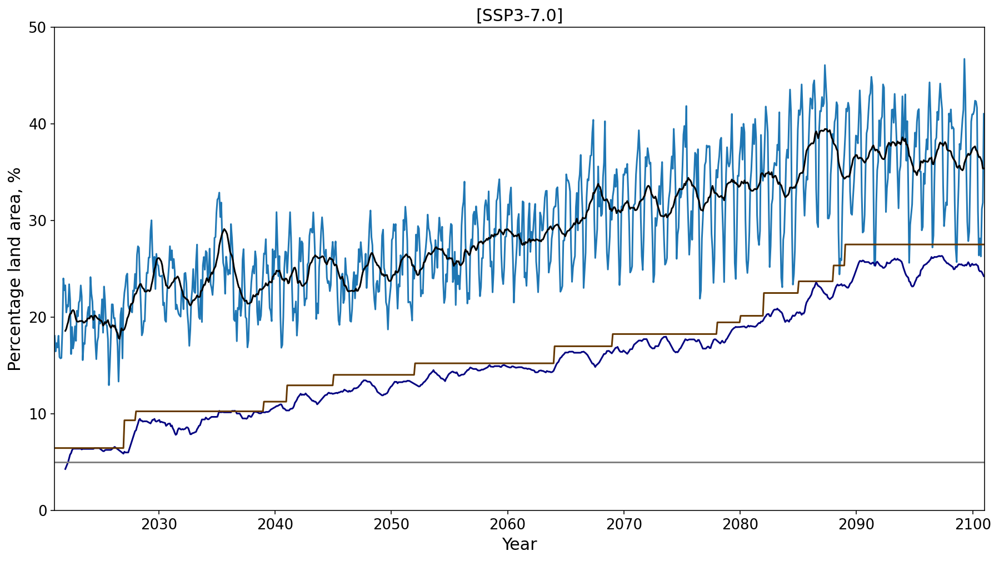

In [157]:
data_roll_monthly_370up = pd.Series(median_percentage_area_SS370_wet_monthly)
Rolling_monthly_percentage_all_wet_SS370 = data_roll_monthly_370up.rolling(12).mean()

plt.figure(figsize=(15,8))
plt.plot(time, median_percentage_area_SS370_wet_monthly, label='Monthly wet departures')
plt.plot(time, Rolling_monthly_percentage_all_wet_SS370, 'black', label='12-month rolling mean of the monthly wet departures')

data_roll_370up = pd.Series(median_perc_SS370_wet_monthly_afteremerg)
rolling_up_370_ae = data_roll_370up.rolling(12).mean()
plt.plot(time, rolling_up_370_ae, 'navy', label='12-month rolling mean of monthly permanent wet departures')
plt.axhline(y=5, color='grey', label='Expected percentage land area outside envelope without climate change')
plt.plot(time, yearly_percentage_all_wet_afteremergence_SS370, color='#653700', label='Yearly permanent wet departures')
plt.xlim((datetime.date(2021, 1, 16), datetime.date(2101, 1, 16)))
plt.ylim((0,50))
#plt.title('Wet Departure [SSP3-7.0]: Percentage land area where the total soil moisture content is above the 95th percentile of the baseline')
plt.title('[SSP3-7.0]', fontsize=15)
plt.xlabel('Year', fontsize=15)
plt.ylabel('Percentage land area, %', fontsize=15)
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
#plt.legend(fontsize=11, loc='best');
plt.savefig('wet_370_boundary', dpi = 250, bbox_inches='tight')

In [158]:
#SS585 wet MONTHLY!!!

perc_585_wet_monthly_all = []
for k in range(14):
    pc_95_monthly_list = []
    for i in range(len(year_once)):
        for j in range(12):
            pc_95_monthly_list.append(piControl_95th_list_month[k][j])

    ssp_monthly_585 = SSP_monthly_average(ds_SS585_list[k])
    area_per_region = regional_area(area_list[k], sft_list[k], ds_list[k])
    region_exiting_n95 = [] #shape (n, 46)
    for n in range(len(time)):
        difference = ssp_monthly_585[n] - pc_95_monthly_list[n]  # shape SSP: (14, 46, 960), pcn5: (14,46, 12) call the function monthly, but ocn5 different for each month
        region_more = []
        for j in range(46):
            if difference[j] > 0:
                region_more.append(area_per_region[j])
            else:
                region_more.append(0)
        region_exiting_n95.append(region_more)


    area_total = []  #(46, 960)
    for i in range(46):
        area_region = np.zeros(len(year)) #[]
        for j in range(len(year)):
            if toe_up_SS585_all_year[k][i] == 0:
                area_region[j] = 0
            if toe_up_SS585_all_year[k][i] > 2095:
                area_region[j] = 0
            if toe_up_SS585_all_year[k][i] <= 2095 and toe_up_SS585_all_year[k][i] > 0:
                if year[j] >= toe_up_SS585_all_year[k][i]:
                    area_region[j] = np.transpose(region_exiting_n95)[i][j]  #(46,n)
                else:
                    area_region[j] = 0

        area_total.append(area_region)

    region_exiting_n95_icefree = area_total[1:44] #shape(43, n)
    region_exiting_n95_icefree = np.transpose(region_exiting_n95_icefree)  #(n, 43)


    area_region_icefree_exiting_n95 = []   #shpe (n, 1)
    for i in range(len(region_exiting_n95_icefree)):
        area = np.sum(region_exiting_n95_icefree[i])  #(960,43)
        area_region_icefree_exiting_n95.append(area)


    percentage_month_585 = []
    for j in range(len(area_region_icefree_exiting_n95)):
        percent = area_region_icefree_exiting_n95[j] * 100/ area_icefree_all[k]
        percentage_month_585.append(percent)

    #plt.figure()
    #plt.plot(time, percentage_month_585, 'darkred')
    #plt.title("ss585, wet, monthly")

    perc_585_wet_monthly_all.append(percentage_month_585)

median_perc_SS585_wet_monthly_afteremerg = []
for i in range(len(np.transpose(perc_585_wet_monthly_all))):  #(80, 14)
    median = np.median(np.transpose(perc_585_wet_monthly_all)[i])
    median_perc_SS585_wet_monthly_afteremerg.append(median)


yearly_mean_SS585_list_T = []
for i in range(len(model)):
    transp = np.transpose(yearly_mean_SS585_list[i])
    yearly_mean_SS585_list_T.append(transp)
    

region_more_all_allmodels = []
for k in range(len(model)):
    area_per_region = regional_area(area_list[k], sft_list[k], ds_list[k])
    area_region_wet = yearly_area_per_region_above_n95(yearly_mean_SS585_list_T[k], piControl_95th_list[k], area_per_region, year_once)
    
    region_more_all = []
    for m in range(46):
        region_more_region = np.zeros(len(year_once))
        for n in range(len(year_once)):
            if toe_up_SS585_all_year[k][m] == 0:
                region_more_region[n] = 0
            if toe_up_SS585_all_year[k][m] > 2095:
                region_more_region[n] = 0
            if toe_up_SS585_all_year[k][m] <= 2095 and toe_up_SS585_all_year[k][m] > 0:
                if year_once[n] >= toe_up_SS585_all_year[k][m]:
                    region_more_region[n] = np.transpose(area_region_wet)[m][n]
                else:
                    region_more_region[n] = 0
                
         
        region_more_all.append(region_more_region)
        
    region_more_all_allmodels.append(region_more_all)    
        
### those up and up is because the toe is afetr 2095
yearly_percentage_totalarea_wet_afteremergence_SS585 = []
for x in range(len(model)):
    region_more_all_allmodels_T = np.transpose(region_more_all_allmodels[x][1:44])
    Sum = []
    for i in range(len(year_once)):
        T_sum = np.sum(region_more_all_allmodels_T[i])   #(80, )
        Sum.append(T_sum)
        
    yearly_percentage_totalarea_wet_afteremergence_SS585.append(Sum)
        
yearly_percentage_median_wet_afteremergence_SS585 = []
for j in range(len(year_once)):
    med = np.median(np.transpose(yearly_percentage_totalarea_wet_afteremergence_SS585)[j])
    yearly_percentage_median_wet_afteremergence_SS585.append(med*100/area_icefree)

yearly_percentage_all_wet_afteremergence_SS585 = np.zeros(960)
for i in range(len(year_once)):
    #x = np.zeros(12)
    #for j in range(12):
    yearly_percentage_all_wet_afteremergence_SS585[((i+1)* 12)-12 : (i+1)* 12] = yearly_percentage_median_wet_afteremergence_SS585[i]
    #yearly_percentage_all_wet_afteremergence_SS585.append(x)
        
#0:12
#12:24
#24:36
#yearly_percentage_all_wet_afteremergence_SS585             color = 'darkred',

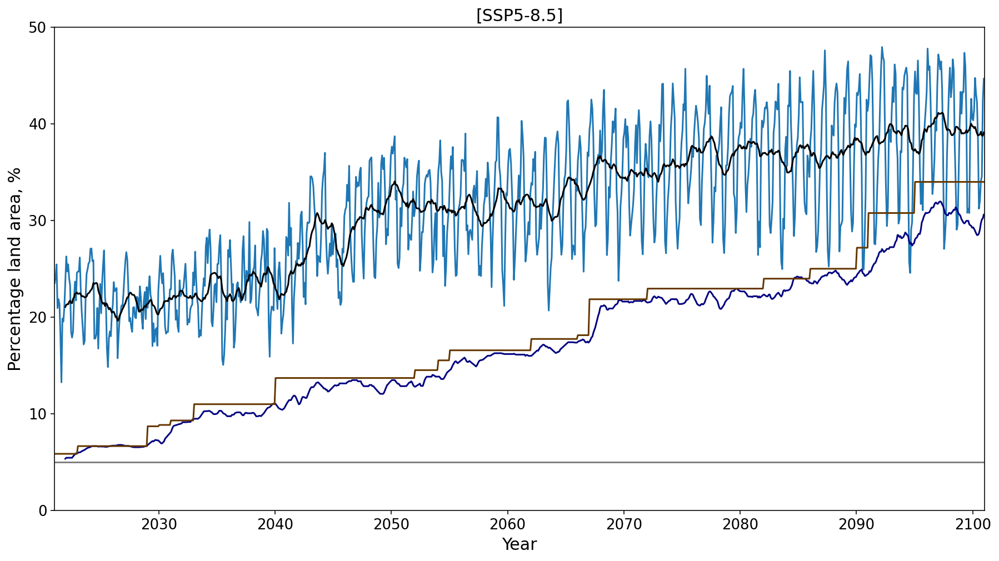

In [159]:
data_roll_monthly_585up = pd.Series(median_percentage_area_SS585_wet_monthly)
Rolling_monthly_percentage_all_wet_SS585 = data_roll_monthly_585up.rolling(12).mean()

plt.figure(figsize=(15,8))
plt.plot(time, median_percentage_area_SS585_wet_monthly, label='Monthly wet departures')
plt.plot(time, Rolling_monthly_percentage_all_wet_SS585, 'black', label='12-month rolling mean of the monthly wet departures')

data_roll_585up = pd.Series(median_perc_SS585_wet_monthly_afteremerg)
rolling_up_585_ae = data_roll_585up.rolling(12).mean()
plt.plot(time, rolling_up_585_ae, 'navy', label='12-month rolling mean of monthly permanent wet departures')
plt.axhline(y=5, color='grey', label='Expected percentage land area outside envelope without climate change')
plt.plot(time, yearly_percentage_all_wet_afteremergence_SS585, color='#653700', label='Yearly permanent wet departures')
plt.xlim((datetime.date(2021, 1, 16), datetime.date(2101, 1, 16)))
plt.ylim((0,50))
#plt.title('Wet Departure [SSP5-8.5]: Percentage land area where the total soil moisture content is above the 95th percentile of the baseline')
plt.title('[SSP5-8.5]', fontsize=15)
plt.xlabel('Year', fontsize=15)
plt.ylabel('Percentage land area, %', fontsize=15)
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
#plt.legend(fontsize=11, loc='best');
plt.savefig('wet_585_boundary', dpi = 250, bbox_inches='tight')

In [160]:
#SS126 dry MONTHLY!!!

perc_126_dry_monthly_all = []
for k in range(14):
    pc_5_monthly_list = []
    for i in range(len(year_once)):
        for j in range(12):
            pc_5_monthly_list.append(piControl_5th_list_month[k][j])

    ssp_monthly_126 = SSP_monthly_average(ds_SS126_list[k])
    area_per_region = regional_area(area_list[k], sft_list[k], ds_list[k])
    region_exiting_n5 = [] #shape (n, 46)
    for n in range(len(time)):
        difference = ssp_monthly_126[n] - pc_5_monthly_list[n]  # shape SSP: (14, 46, 960), pcn5: (14,46, 12) call the function monthly, but ocn5 different for each month
        region_more = []
        for j in range(46):
            if difference[j] < 0:
                region_more.append(area_per_region[j])
            else:
                region_more.append(0)
        region_exiting_n5.append(region_more)


    area_total = []  #(46, 960)
    for i in range(46):
        area_region = np.zeros(len(year)) #[]
        for j in range(len(year)):
            if toe_down_SS126_all_year[k][i] == 0:
                area_region[j] = 0
            if toe_down_SS126_all_year[k][i] > 2095:
                area_region[j] = 0
            if toe_down_SS126_all_year[k][i] <= 2095 and toe_down_SS126_all_year[k][i] > 0:
                if year[j] >= toe_down_SS126_all_year[k][i]:
                    area_region[j] = np.transpose(region_exiting_n5)[i][j]  #(46,n)
                else:
                    area_region[j] = 0

        area_total.append(area_region)

    region_exiting_n5_icefree = area_total[1:44] #shape(43, n)
    region_exiting_n5_icefree = np.transpose(region_exiting_n5_icefree)  #(n, 43)


    area_region_icefree_exiting_n5 = []   #shpe (n, 1)
    for i in range(len(region_exiting_n5_icefree)):
        area = np.sum(region_exiting_n5_icefree[i])  #(960,43)
        area_region_icefree_exiting_n5.append(area)


    percentage_month_126 = []
    for j in range(len(area_region_icefree_exiting_n5)):
        percent = area_region_icefree_exiting_n5[j] * 100/ area_icefree_all[k]
        percentage_month_126.append(percent)

    #plt.figure()
    #plt.plot(time, percentage_month_126, 'darkred')
    #plt.title("ss126, dry, monthly")

    perc_126_dry_monthly_all.append(percentage_month_126)

median_perc_SS126_dry_monthly_afteremerg = []
for i in range(len(np.transpose(perc_126_dry_monthly_all))):  #(80, 14)
    median = np.median(np.transpose(perc_126_dry_monthly_all)[i])
    median_perc_SS126_dry_monthly_afteremerg.append(median)


#median_percentage_area_SS126_dry_monthly_ae = monthly_area_dry_departure_ae(piControl_5th_list_month, year_once, ds_SS126_list, area_list, sft_list, ds_list, time, year)

yearly_mean_SS126_list_T = []
for i in range(len(model)):
    transp = np.transpose(yearly_mean_SS126_list[i])
    yearly_mean_SS126_list_T.append(transp)
    

region_more_all_allmodels = []
for k in range(len(model)):
    area_per_region = regional_area(area_list[k], sft_list[k], ds_list[k])
    area_region_dry = yearly_area_per_region_below_n5(yearly_mean_SS126_list_T[k], piControl_5th_list[k], area_per_region, year_once)
    
    region_more_all = []
    for m in range(46):
        region_more_region = np.zeros(len(year_once))
        for n in range(len(year_once)):
            if toe_down_SS126_all_year[k][m] == 0:
                region_more_region[n] = 0
            if toe_down_SS126_all_year[k][m] > 2095:
                region_more_region[n] = 0
            if toe_down_SS126_all_year[k][m] <= 2095 and toe_down_SS126_all_year[k][m] > 0:
                if year_once[n] >= toe_down_SS126_all_year[k][m]:
                    region_more_region[n] = np.transpose(area_region_dry)[m][n]
                else:
                    region_more_region[n] = 0
                
         
        region_more_all.append(region_more_region)
        
    region_more_all_allmodels.append(region_more_all)    
        
### those up and down is because the toe is afetr 2095
yearly_percentage_totalarea_dry_afteremergence_SS126 = []
for x in range(len(model)):
    region_more_all_allmodels_T = np.transpose(region_more_all_allmodels[x][1:44])
    Sum = []
    for i in range(len(year_once)):
        T_sum = np.sum(region_more_all_allmodels_T[i])   #(80, )
        Sum.append(T_sum)
        
    yearly_percentage_totalarea_dry_afteremergence_SS126.append(Sum)
        
yearly_percentage_median_dry_afteremergence_SS126 = []
for j in range(len(year_once)):
    med = np.median(np.transpose(yearly_percentage_totalarea_dry_afteremergence_SS126)[j])
    yearly_percentage_median_dry_afteremergence_SS126.append(med*100/area_icefree)

yearly_percentage_all_dry_afteremergence_SS126 = np.zeros(960)
for i in range(len(year_once)):
    #x = np.zeros(12)
    #for j in range(12):
    yearly_percentage_all_dry_afteremergence_SS126[((i+1)* 12)-12 : (i+1)* 12] = yearly_percentage_median_dry_afteremergence_SS126[i]
    #yearly_percentage_all_dry_afteremergence_SS126.append(x)
        
#0:12
#12:24
#24:36
#yearly_percentage_all_dry_afteremergence_SS126

#yearly_percentage_all_dry_afteremergence_SS126             color = 'darkred',

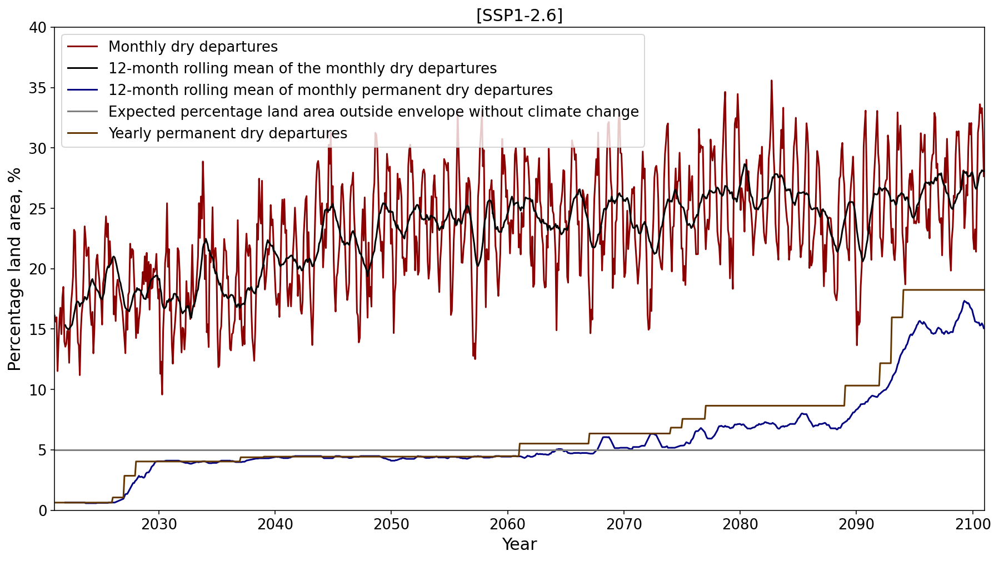

In [161]:
data_roll_monthly_126down = pd.Series(median_percentage_area_SS126_dry_monthly)
Rolling_monthly_percentage_all_dry_SS126 = data_roll_monthly_126down.rolling(12).mean()

plt.figure(figsize=(15,8))
plt.plot(time, median_percentage_area_SS126_dry_monthly, label='Monthly dry departures', color='darkred')
plt.plot(time, Rolling_monthly_percentage_all_dry_SS126, 'black', label='12-month rolling mean of the monthly dry departures')

data_roll_126down = pd.Series(median_perc_SS126_dry_monthly_afteremerg)
rolling_down_126_ae = data_roll_126down.rolling(12).mean()
plt.plot(time, rolling_down_126_ae, 'navy', label='12-month rolling mean of monthly permanent dry departures')
plt.axhline(y=5, color='grey', label='Expected percentage land area outside envelope without climate change')
plt.plot(time, yearly_percentage_all_dry_afteremergence_SS126, color='#653700', label='Yearly permanent dry departures')
plt.xlim((datetime.date(2021, 1, 16), datetime.date(2101, 1, 16)))
plt.ylim((0,40))
#plt.title('Dry Departure [SSP1-2.6]: Percentage land area where the total soil moisture content is below the 5th percentile of the baseline')
plt.title('[SSP1-2.6]', fontsize=15)
plt.xlabel('Year', fontsize=15)
plt.ylabel('Percentage land area, %', fontsize=15)
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.legend(fontsize=13, loc='best');
plt.savefig('dry_126_boundary', dpi = 250, bbox_inches='tight')

In [162]:
#SS245 dry MONTHLY!!!

perc_245_dry_monthly_all = []
for k in range(14):
    pc_5_monthly_list = []
    for i in range(len(year_once)):
        for j in range(12):
            pc_5_monthly_list.append(piControl_5th_list_month[k][j])

    ssp_monthly_245 = SSP_monthly_average(ds_SS245_list[k])
    area_per_region = regional_area(area_list[k], sft_list[k], ds_list[k])
    region_exiting_n5 = [] #shape (n, 46)
    for n in range(len(time)):
        difference = ssp_monthly_245[n] - pc_5_monthly_list[n]  # shape SSP: (14, 46, 960), pcn5: (14,46, 12) call the function monthly, but ocn5 different for each month
        region_more = []
        for j in range(46):
            if difference[j] < 0:
                region_more.append(area_per_region[j])
            else:
                region_more.append(0)
        region_exiting_n5.append(region_more)


    area_total = []  #(46, 960)
    for i in range(46):
        area_region = np.zeros(len(year)) #[]
        for j in range(len(year)):
            if toe_down_SS245_all_year[k][i] == 0:
                area_region[j] = 0
            if toe_down_SS245_all_year[k][i] > 2095:
                area_region[j] = 0
            if toe_down_SS245_all_year[k][i] <= 2095 and toe_down_SS245_all_year[k][i] > 0:
                if year[j] >= toe_down_SS245_all_year[k][i]:
                    area_region[j] = np.transpose(region_exiting_n5)[i][j]  #(46,n)
                else:
                    area_region[j] = 0

        area_total.append(area_region)

    region_exiting_n5_icefree = area_total[1:44] #shape(43, n)
    region_exiting_n5_icefree = np.transpose(region_exiting_n5_icefree)  #(n, 43)


    area_region_icefree_exiting_n5 = []   #shpe (n, 1)
    for i in range(len(region_exiting_n5_icefree)):
        area = np.sum(region_exiting_n5_icefree[i])  #(960,43)
        area_region_icefree_exiting_n5.append(area)


    percentage_month_245 = []
    for j in range(len(area_region_icefree_exiting_n5)):
        percent = area_region_icefree_exiting_n5[j] * 100/ area_icefree_all[k]
        percentage_month_245.append(percent)

    #plt.figure()
    #plt.plot(time, percentage_month_245, 'darkred')
    #plt.title("ss245, dry, monthly")

    perc_245_dry_monthly_all.append(percentage_month_245)

median_perc_SS245_dry_monthly_afteremerg = []
for i in range(len(np.transpose(perc_245_dry_monthly_all))):  #(80, 14)
    median = np.median(np.transpose(perc_245_dry_monthly_all)[i])
    median_perc_SS245_dry_monthly_afteremerg.append(median)


#median_percentage_area_SS245_dry_monthly_ae = monthly_area_dry_departure_ae(piControl_5th_list_month, year_once, ds_SS245_list, area_list, sft_list, ds_list, time, year)

yearly_mean_SS245_list_T = []
for i in range(len(model)):
    transp = np.transpose(yearly_mean_SS245_list[i])
    yearly_mean_SS245_list_T.append(transp)
    

region_more_all_allmodels = []
for k in range(len(model)):
    area_per_region = regional_area(area_list[k], sft_list[k], ds_list[k])
    area_region_dry = yearly_area_per_region_below_n5(yearly_mean_SS245_list_T[k], piControl_5th_list[k], area_per_region, year_once)
    
    region_more_all = []
    for m in range(46):
        region_more_region = np.zeros(len(year_once))
        for n in range(len(year_once)):
            if toe_down_SS245_all_year[k][m] == 0:
                region_more_region[n] = 0
            if toe_down_SS245_all_year[k][m] > 2095:
                region_more_region[n] = 0
            if toe_down_SS245_all_year[k][m] <= 2095 and toe_down_SS245_all_year[k][m] > 0:
                if year_once[n] >= toe_down_SS245_all_year[k][m]:
                    region_more_region[n] = np.transpose(area_region_dry)[m][n]
                else:
                    region_more_region[n] = 0
                
         
        region_more_all.append(region_more_region)
        
    region_more_all_allmodels.append(region_more_all)    
        
### those up and down is because the toe is afetr 2095
yearly_percentage_totalarea_dry_afteremergence_SS245 = []
for x in range(len(model)):
    region_more_all_allmodels_T = np.transpose(region_more_all_allmodels[x][1:44])
    Sum = []
    for i in range(len(year_once)):
        T_sum = np.sum(region_more_all_allmodels_T[i])   #(80, )
        Sum.append(T_sum)
        
    yearly_percentage_totalarea_dry_afteremergence_SS245.append(Sum)
        
yearly_percentage_median_dry_afteremergence_SS245 = []
for j in range(len(year_once)):
    med = np.median(np.transpose(yearly_percentage_totalarea_dry_afteremergence_SS245)[j])
    yearly_percentage_median_dry_afteremergence_SS245.append(med*100/area_icefree)

yearly_percentage_all_dry_afteremergence_SS245 = np.zeros(960)
for i in range(len(year_once)):
    #x = np.zeros(12)
    #for j in range(12):
    yearly_percentage_all_dry_afteremergence_SS245[((i+1)* 12)-12 : (i+1)* 12] = yearly_percentage_median_dry_afteremergence_SS245[i]
    #yearly_percentage_all_dry_afteremergence_SS245.append(x)
        
#0:12
#12:24
#24:36
#yearly_percentage_all_dry_afteremergence_SS245

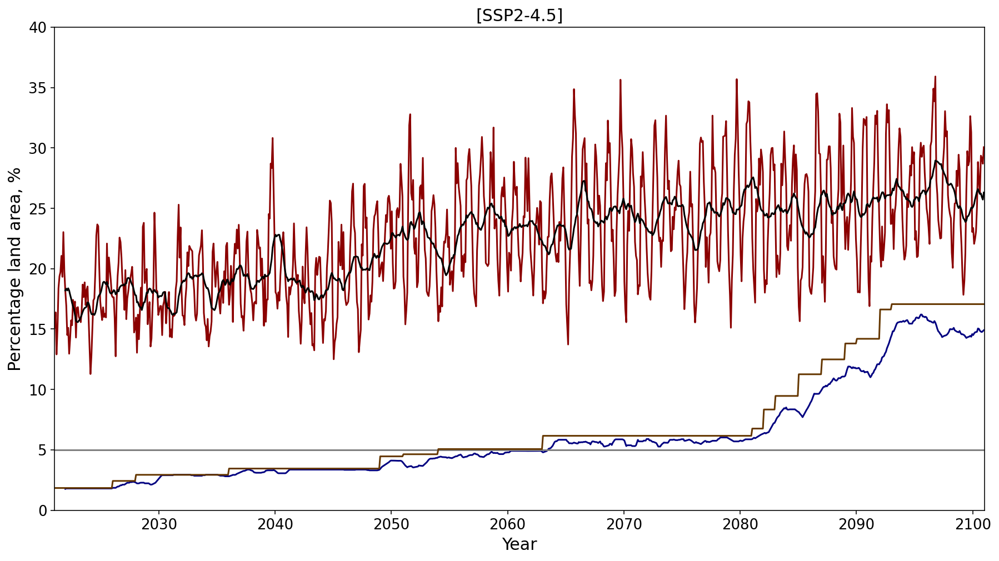

In [163]:
#yearly_percentage_all_dry_afteremergence_SS245             color = 'darkred',
data_roll_monthly_245down = pd.Series(median_percentage_area_SS245_dry_monthly)
Rolling_monthly_percentage_all_dry_SS245 = data_roll_monthly_245down.rolling(12).mean()

plt.figure(figsize=(15,8))
plt.plot(time, median_percentage_area_SS245_dry_monthly, label='Monthly dry departures', color='darkred')
plt.plot(time, Rolling_monthly_percentage_all_dry_SS245, 'black', label='12-month rolling mean of the monthly dry departures')

data_roll_245down = pd.Series(median_perc_SS245_dry_monthly_afteremerg)
rolling_down_245_ae = data_roll_245down.rolling(12).mean()
plt.plot(time, rolling_down_245_ae, 'navy', label='12-month rolling mean of monthly permanent dry departures')
plt.axhline(y=5, color='grey', label='Expected percentage land area outside envelope without climate change')
plt.plot(time, yearly_percentage_all_dry_afteremergence_SS245, color='#653700', label='Yearly permanent dry departures')
plt.xlim((datetime.date(2021, 1, 16), datetime.date(2101, 1, 16)))
plt.ylim((0,40))
#plt.title('Dry Departure [SSP2-4.5]: Percentage land area where the total soil moisture content is below the 5th percentile of the baseline')
plt.title('[SSP2-4.5]', fontsize=15)
plt.xlabel('Year', fontsize=15)
plt.ylabel('Percentage land area, %', fontsize=15)
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
#plt.legend(fontsize=11, loc='best');
plt.savefig('dry_245_boundary', dpi = 250, bbox_inches='tight')

In [164]:
#SS370 dry MONTHLY!!!

perc_370_dry_monthly_all = []
for k in range(14):
    pc_5_monthly_list = []
    for i in range(len(year_once)):
        for j in range(12):
            pc_5_monthly_list.append(piControl_5th_list_month[k][j])

    ssp_monthly_370 = SSP_monthly_average(ds_SS370_list[k])
    area_per_region = regional_area(area_list[k], sft_list[k], ds_list[k])
    region_exiting_n5 = [] #shape (n, 46)
    for n in range(len(time)):
        difference = ssp_monthly_370[n] - pc_5_monthly_list[n]  # shape SSP: (14, 46, 960), pcn5: (14,46, 12) call the function monthly, but ocn5 different for each month
        region_more = []
        for j in range(46):
            if difference[j] < 0:
                region_more.append(area_per_region[j])
            else:
                region_more.append(0)
        region_exiting_n5.append(region_more)


    area_total = []  #(46, 960)
    for i in range(46):
        area_region = np.zeros(len(year)) #[]
        for j in range(len(year)):
            if toe_down_SS370_all_year[k][i] == 0:
                area_region[j] = 0
            if toe_down_SS370_all_year[k][i] > 2095:
                area_region[j] = 0
            if toe_down_SS370_all_year[k][i] <= 2095 and toe_down_SS370_all_year[k][i] > 0:
                if year[j] >= toe_down_SS370_all_year[k][i]:
                    area_region[j] = np.transpose(region_exiting_n5)[i][j]  #(46,n)
                else:
                    area_region[j] = 0

        area_total.append(area_region)

    region_exiting_n5_icefree = area_total[1:44] #shape(43, n)
    region_exiting_n5_icefree = np.transpose(region_exiting_n5_icefree)  #(n, 43)


    area_region_icefree_exiting_n5 = []   #shpe (n, 1)
    for i in range(len(region_exiting_n5_icefree)):
        area = np.sum(region_exiting_n5_icefree[i])  #(960,43)
        area_region_icefree_exiting_n5.append(area)


    percentage_month_370 = []
    for j in range(len(area_region_icefree_exiting_n5)):
        percent = area_region_icefree_exiting_n5[j] * 100/ area_icefree_all[k]
        percentage_month_370.append(percent)

    #plt.figure()
    #plt.plot(time, percentage_month_370, 'darkred')
    #plt.title("ss370, dry, monthly")

    perc_370_dry_monthly_all.append(percentage_month_370)

median_perc_SS370_dry_monthly_afteremerg = []
for i in range(len(np.transpose(perc_370_dry_monthly_all))):  #(80, 14)
    median = np.median(np.transpose(perc_370_dry_monthly_all)[i])
    median_perc_SS370_dry_monthly_afteremerg.append(median)


#median_percentage_area_SS370_dry_monthly_ae = monthly_area_dry_departure_ae(piControl_5th_list_month, year_once, ds_SS370_list, area_list, sft_list, ds_list, time, year)

yearly_mean_SS370_list_T = []
for i in range(len(model)):
    transp = np.transpose(yearly_mean_SS370_list[i])
    yearly_mean_SS370_list_T.append(transp)
    

region_more_all_allmodels = []
for k in range(len(model)):
    area_per_region = regional_area(area_list[k], sft_list[k], ds_list[k])
    area_region_dry = yearly_area_per_region_below_n5(yearly_mean_SS370_list_T[k], piControl_5th_list[k], area_per_region, year_once)
    
    region_more_all = []
    for m in range(46):
        region_more_region = np.zeros(len(year_once))
        for n in range(len(year_once)):
            if toe_down_SS370_all_year[k][m] == 0:
                region_more_region[n] = 0
            if toe_down_SS370_all_year[k][m] > 2095:
                region_more_region[n] = 0
            if toe_down_SS370_all_year[k][m] <= 2095 and toe_down_SS370_all_year[k][m] > 0:
                if year_once[n] >= toe_down_SS370_all_year[k][m]:
                    region_more_region[n] = np.transpose(area_region_dry)[m][n]
                else:
                    region_more_region[n] = 0
                
         
        region_more_all.append(region_more_region)
        
    region_more_all_allmodels.append(region_more_all)    
        
### those up and down is because the toe is afetr 2095
yearly_percentage_totalarea_dry_afteremergence_SS370 = []
for x in range(len(model)):
    region_more_all_allmodels_T = np.transpose(region_more_all_allmodels[x][1:44])
    Sum = []
    for i in range(len(year_once)):
        T_sum = np.sum(region_more_all_allmodels_T[i])   #(80, )
        Sum.append(T_sum)
        
    yearly_percentage_totalarea_dry_afteremergence_SS370.append(Sum)
        
yearly_percentage_median_dry_afteremergence_SS370 = []
for j in range(len(year_once)):
    med = np.median(np.transpose(yearly_percentage_totalarea_dry_afteremergence_SS370)[j])
    yearly_percentage_median_dry_afteremergence_SS370.append(med*100/area_icefree)

yearly_percentage_all_dry_afteremergence_SS370 = np.zeros(960)
for i in range(len(year_once)):
    #x = np.zeros(12)
    #for j in range(12):
    yearly_percentage_all_dry_afteremergence_SS370[((i+1)* 12)-12 : (i+1)* 12] = yearly_percentage_median_dry_afteremergence_SS370[i]
    #yearly_percentage_all_dry_afteremergence_SS370.append(x)
        
#0:12
#12:24
#24:36
#yearly_percentage_all_dry_afteremergence_SS370

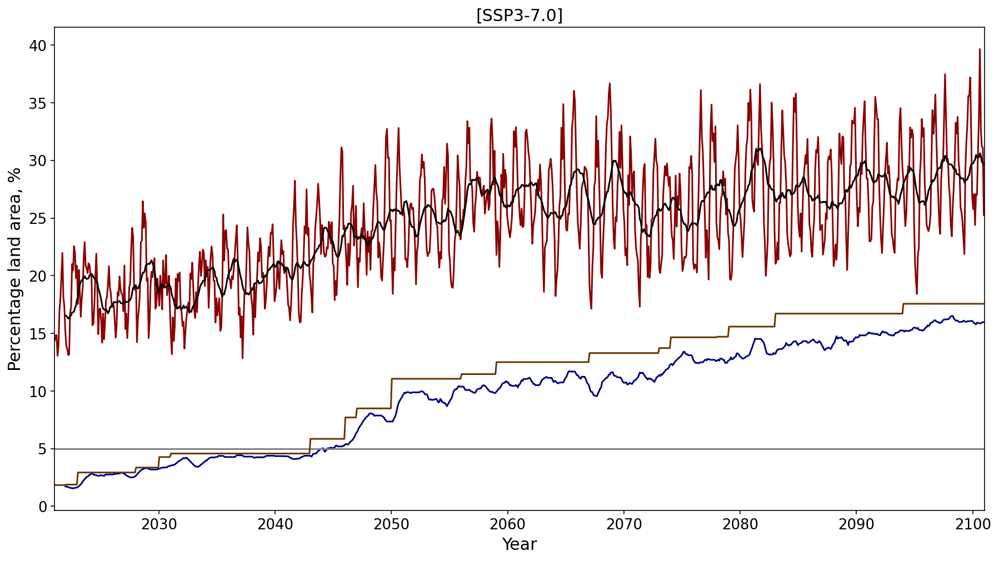

In [165]:
#yearly_percentage_all_dry_afteremergence_SS370             color = 'darkred',
data_roll_monthly_370down = pd.Series(median_percentage_area_SS370_dry_monthly)
Rolling_monthly_percentage_all_dry_SS370 = data_roll_monthly_370down.rolling(12).mean()

plt.figure(figsize=(15,8))
plt.plot(time, median_percentage_area_SS370_dry_monthly, label='Monthly dry departures', color='darkred')
plt.plot(time, Rolling_monthly_percentage_all_dry_SS370, 'black', label='12-month rolling mean of the monthly dry departures')

data_roll_370down = pd.Series(median_perc_SS370_dry_monthly_afteremerg)
rolling_down_370_ae = data_roll_370down.rolling(12).mean()
plt.plot(time, rolling_down_370_ae, 'navy', label='12-month rolling mean of monthly permanent dry departures')
plt.axhline(y=5, color='grey', label='Expected percentage land area outside envelope without climate change')
plt.plot(time, yearly_percentage_all_dry_afteremergence_SS370, color='#653700', label='Yearly permanent dry departures')
plt.xlim((datetime.date(2021, 1, 16), datetime.date(2101, 1, 16)))
#plt.title('Dry Departure [SSP3-7.0]: Percentage land area where the total soil moisture content is below the 5th percentile of the baseline')
plt.title('[SSP3-7.0]', fontsize=15)
plt.xlabel('Year', fontsize=15)
plt.ylabel('Percentage land area, %', fontsize=15)
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
#plt.legend(fontsize=11, loc='best');
plt.savefig('dry_370_boundary', dpi = 250, bbox_inches='tight')

In [166]:
#SS585 dry MONTHLY!!!

perc_585_dry_monthly_all = []
for k in range(14):
    pc_5_monthly_list = []
    for i in range(len(year_once)):
        for j in range(12):
            pc_5_monthly_list.append(piControl_5th_list_month[k][j])

    ssp_monthly_585 = SSP_monthly_average(ds_SS585_list[k])
    area_per_region = regional_area(area_list[k], sft_list[k], ds_list[k])
    region_exiting_n5 = [] #shape (n, 46)
    for n in range(len(time)):
        difference = ssp_monthly_585[n] - pc_5_monthly_list[n]  # shape SSP: (14, 46, 960), pcn5: (14,46, 12) call the function monthly, but ocn5 different for each month
        region_more = []
        for j in range(46):
            if difference[j] < 0:
                region_more.append(area_per_region[j])
            else:
                region_more.append(0)
        region_exiting_n5.append(region_more)


    area_total = []  #(46, 960)
    for i in range(46):
        area_region = np.zeros(len(year)) #[]
        for j in range(len(year)):
            if toe_down_SS585_all_year[k][i] == 0:
                area_region[j] = 0
            if toe_down_SS585_all_year[k][i] > 2095:
                area_region[j] = 0
            if toe_down_SS585_all_year[k][i] <= 2095 and toe_down_SS585_all_year[k][i] > 0:
                if year[j] >= toe_down_SS585_all_year[k][i]:
                    area_region[j] = np.transpose(region_exiting_n5)[i][j]  #(46,n)
                else:
                    area_region[j] = 0

        area_total.append(area_region)

    region_exiting_n5_icefree = area_total[1:44] #shape(43, n)
    region_exiting_n5_icefree = np.transpose(region_exiting_n5_icefree)  #(n, 43)


    area_region_icefree_exiting_n5 = []   #shpe (n, 1)
    for i in range(len(region_exiting_n5_icefree)):
        area = np.sum(region_exiting_n5_icefree[i])  #(960,43)
        area_region_icefree_exiting_n5.append(area)


    percentage_month_585 = []
    for j in range(len(area_region_icefree_exiting_n5)):
        percent = area_region_icefree_exiting_n5[j] * 100/ area_icefree_all[k]
        percentage_month_585.append(percent)

    #plt.figure()
    #plt.plot(time, percentage_month_585, 'darkred')
    #plt.title("ss585, dry, monthly")

    perc_585_dry_monthly_all.append(percentage_month_585)

median_perc_SS585_dry_monthly_afteremerg = []
for i in range(len(np.transpose(perc_585_dry_monthly_all))):  #(80, 14)
    median = np.median(np.transpose(perc_585_dry_monthly_all)[i])
    median_perc_SS585_dry_monthly_afteremerg.append(median)


#median_percentage_area_SS585_dry_monthly_ae = monthly_area_dry_departure_ae(piControl_5th_list_month, year_once, ds_SS585_list, area_list, sft_list, ds_list, time, year)

yearly_mean_SS585_list_T = []
for i in range(len(model)):
    transp = np.transpose(yearly_mean_SS585_list[i])
    yearly_mean_SS585_list_T.append(transp)
    

region_more_all_allmodels = []
for k in range(len(model)):
    area_per_region = regional_area(area_list[k], sft_list[k], ds_list[k])
    area_region_dry = yearly_area_per_region_below_n5(yearly_mean_SS585_list_T[k], piControl_5th_list[k], area_per_region, year_once)
    
    region_more_all = []
    for m in range(46):
        region_more_region = np.zeros(len(year_once))
        for n in range(len(year_once)):
            if toe_down_SS585_all_year[k][m] == 0:
                region_more_region[n] = 0
            if toe_down_SS585_all_year[k][m] > 2095:
                region_more_region[n] = 0
            if toe_down_SS585_all_year[k][m] <= 2095 and toe_down_SS585_all_year[k][m] > 0:
                if year_once[n] >= toe_down_SS585_all_year[k][m]:
                    region_more_region[n] = np.transpose(area_region_dry)[m][n]
                else:
                    region_more_region[n] = 0
                
         
        region_more_all.append(region_more_region)
        
    region_more_all_allmodels.append(region_more_all)    
        
### those up and down is because the toe is afetr 2095
yearly_percentage_totalarea_dry_afteremergence_SS585 = []
for x in range(len(model)):
    region_more_all_allmodels_T = np.transpose(region_more_all_allmodels[x][1:44])
    Sum = []
    for i in range(len(year_once)):
        T_sum = np.sum(region_more_all_allmodels_T[i])   #(80, )
        Sum.append(T_sum)
        
    yearly_percentage_totalarea_dry_afteremergence_SS585.append(Sum)
        
yearly_percentage_median_dry_afteremergence_SS585 = []
for j in range(len(year_once)):
    med = np.median(np.transpose(yearly_percentage_totalarea_dry_afteremergence_SS585)[j])
    yearly_percentage_median_dry_afteremergence_SS585.append(med*100/area_icefree)

yearly_percentage_all_dry_afteremergence_SS585 = np.zeros(960)
for i in range(len(year_once)):
    #x = np.zeros(12)
    #for j in range(12):
    yearly_percentage_all_dry_afteremergence_SS585[((i+1)* 12)-12 : (i+1)* 12] = yearly_percentage_median_dry_afteremergence_SS585[i]
    #yearly_percentage_all_dry_afteremergence_SS585.append(x)
        
#0:12
#12:24
#24:36
#yearly_percentage_all_dry_afteremergence_SS585

#yearly_percentage_all_dry_afteremergence_SS585             color = 'darkred',

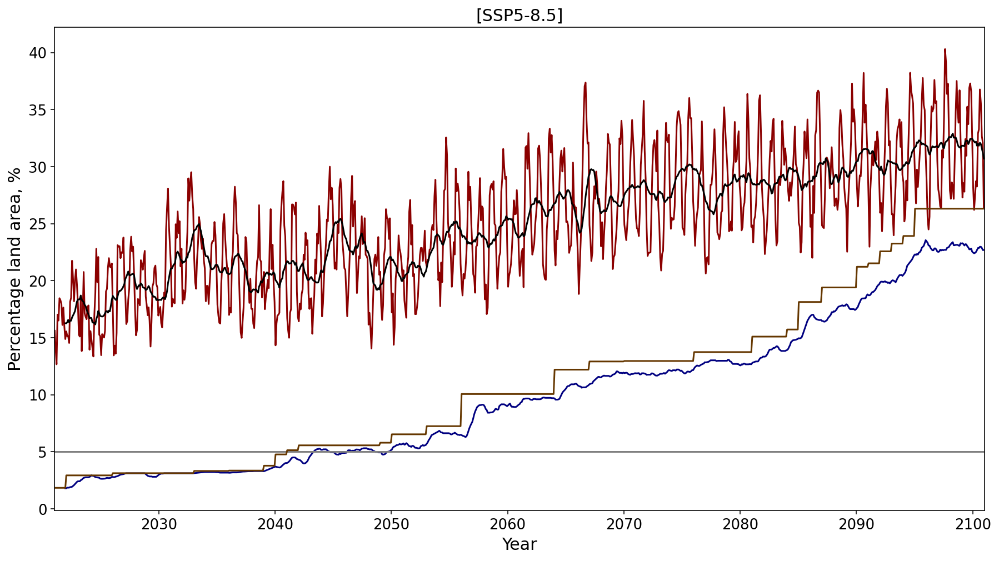

In [167]:
data_roll_monthly_585down = pd.Series(median_percentage_area_SS585_dry_monthly)
Rolling_monthly_percentage_all_dry_SS585 = data_roll_monthly_585down.rolling(12).mean()

plt.figure(figsize=(15,8))
plt.plot(time, median_percentage_area_SS585_dry_monthly, label='Monthly dry departures', color='darkred')
plt.plot(time, Rolling_monthly_percentage_all_dry_SS585, 'black', label='12-month rolling mean of the monthly dry departures')


data_roll_585down = pd.Series(median_perc_SS585_dry_monthly_afteremerg)
rolling_down_585_ae = data_roll_585down.rolling(12).mean()
plt.plot(time, rolling_down_585_ae, 'navy', label='12-month rolling mean of monthly permanent dry departures')
plt.axhline(y=5, color='grey', label='Expected percentage land area outside envelope without climate change')
plt.plot(time, yearly_percentage_all_dry_afteremergence_SS585, color='#653700', label='Yearly permanent dry departures')
plt.xlim((datetime.date(2021, 1, 16), datetime.date(2101, 1, 16)))
#plt.title('Dry Departure [SSP5-8.5]: Percentage land area where the total soil moisture content is below the 5th percentile of the baseline')
plt.title('[SSP5-8.5]', fontsize=15)
plt.xlabel('Year', fontsize=15)
plt.ylabel('Percentage land area, %', fontsize=15)
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
#plt.legend(fontsize=11);
plt.savefig('dry_585_boundary', dpi = 250, bbox_inches='tight')

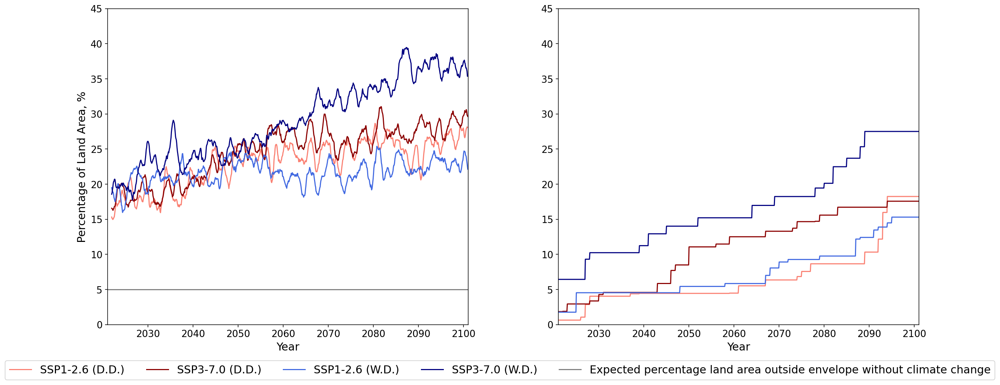

In [168]:
plt.figure(figsize=(20,8))
plt.subplot(1, 2, 1)
plt.plot(time, Rolling_monthly_percentage_all_dry_SS126, color='salmon',label='SSP1-2.6 (D.D.)')
plt.plot(time, Rolling_monthly_percentage_all_dry_SS370, color='darkred',label='SSP3-7.0 (D.D.)')
plt.plot(time, Rolling_monthly_percentage_all_wet_SS126, color='royalblue',label='SSP1-2.6 (W.D.)')
plt.plot(time, Rolling_monthly_percentage_all_wet_SS370, color='navy',label='SSP3-7.0 (W.D.)')
plt.axhline(y=5, color='grey', label='Expected percentage land area outside envelope without climate change')
plt.xlim((datetime.date(2021, 1, 16), datetime.date(2101, 1, 16)))
#plt.title('12-Months Rolling Mean of Percentage of Land Area with Departure', fontsize=15)
#plt.legend()
plt.ylim((0,45))
plt.ylabel('Percentage of Land Area, %', fontsize=15)
plt.xlabel('Year', fontsize=15)
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
#plt.legend(fontsize=12)
plt.figlegend(loc='lower center', bbox_to_anchor=(0.5, -0.02),fancybox=True, shadow=False, ncol=5, fontsize=15)


plt.subplot(1, 2, 2)
plt.plot(time, yearly_percentage_all_dry_afteremergence_SS126, color='salmon',label='SSP1-2.6 (Dry)') # Permanent Dry Departure')
plt.plot(time, yearly_percentage_all_dry_afteremergence_SS370, color='darkred',label='SSP3-7.0 (Dry)') # Permanent Dry Departure')
plt.plot(time, yearly_percentage_all_wet_afteremergence_SS126, color='royalblue',label='SSP1-2.6 (Wet)') # Permanent Wet Departure')
plt.plot(time, yearly_percentage_all_wet_afteremergence_SS370, color='navy',label='SSP3-7.0 (Wet)') # Permanent Wet Departure')
#plt.axhline(y=5, color='grey', label='Expected percentage land area outside envelope without climate change')
plt.xlim((datetime.date(2021, 1, 16), datetime.date(2101, 1, 16)))
#plt.title('Percentage of Land Area with Permanent Departure based on Yearly Mean Data', fontsize=15)
#plt.legend()
plt.xlabel('Year', fontsize=15)
plt.ylim((0,45))
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
#plt.legend(fontsize=14)


plt.subplots_adjust(wspace=0.25)
plt.savefig('compare_125_370_dry&wet', dpi = 250, bbox_inches='tight')

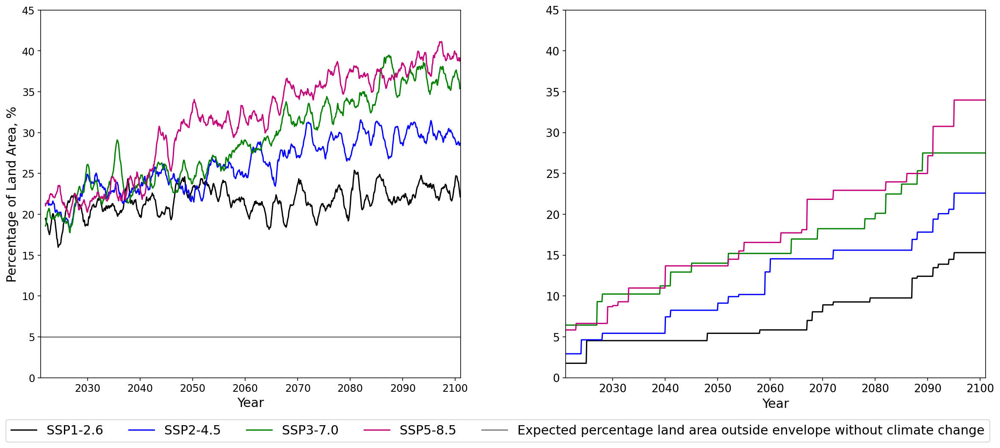

In [176]:
plt.figure(figsize=(20,8))
plt.subplot(1, 2, 1)
plt.plot(time, Rolling_monthly_percentage_all_wet_SS126, color='black',label='SSP1-2.6')
plt.plot(time, Rolling_monthly_percentage_all_wet_SS245, color='blue',label='SSP2-4.5')
plt.plot(time, Rolling_monthly_percentage_all_wet_SS370, color='green',label='SSP3-7.0')
plt.plot(time, Rolling_monthly_percentage_all_wet_SS585, color='#C20078',label='SSP5-8.5')
plt.axhline(y=5, color='grey', label='Expected percentage land area outside envelope without climate change')
plt.xlim((datetime.date(2021, 1, 16), datetime.date(2101, 1, 16)))
#plt.title('12-Months Rolling Mean of Percentage of Land Area with Wet Departure', fontsize=15)
#plt.legend()
plt.ylim((0,45))
plt.ylabel('Percentage of Land Area, %', fontsize=15)
plt.xlabel('Year', fontsize=15)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
#plt.legend(fontsize=12)
plt.figlegend(loc='lower center', bbox_to_anchor=(0.5, -0.02),fancybox=True, shadow=False, ncol=5, fontsize=15)


plt.subplot(1, 2, 2)
plt.plot(time, yearly_percentage_all_wet_afteremergence_SS126, color='black',label='SSP1-2.6')
plt.plot(time, yearly_percentage_all_wet_afteremergence_SS245, color='blue',label='SSP2-4.5')
plt.plot(time, yearly_percentage_all_wet_afteremergence_SS370, color='green',label='SSP3-7.0')
plt.plot(time, yearly_percentage_all_wet_afteremergence_SS585, color='#C20078',label='SSP5-8.5')
#plt.axhline(y=5, color='grey', label='Expected percentage land area outside envelope without climate change')
plt.xlim((datetime.date(2021, 1, 16), datetime.date(2101, 1, 16)))
#plt.title('Percentage of Land Area with Permanent Wet Departure based on Yearly Mean Data', fontsize=15)
#plt.legend()
plt.ylim((0,45))
plt.xlabel('Year', fontsize=15)
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
#plt.legend(fontsize=12)


plt.subplots_adjust(wspace=0.25)
plt.savefig('compare_all_wet', dpi = 250, bbox_inches='tight')


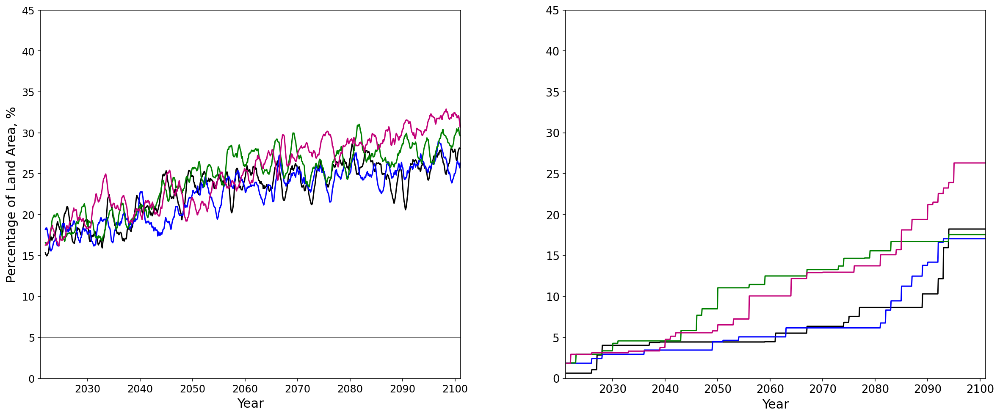

In [175]:
plt.figure(figsize=(20,8))
plt.subplot(1, 2, 1)
plt.plot(time, Rolling_monthly_percentage_all_dry_SS126, color='black',label='SSP1-2.6')
plt.plot(time, Rolling_monthly_percentage_all_dry_SS245, color='blue',label='SSP2-4.5')
plt.plot(time, Rolling_monthly_percentage_all_dry_SS370, color='green',label='SSP3-7.0')
plt.plot(time, Rolling_monthly_percentage_all_dry_SS585, color='#C20078',label='SSP5-8.5')
plt.axhline(y=5, color='grey', label='Expected percentage land area outside envelope without climate change')
plt.xlim((datetime.date(2021, 1, 16), datetime.date(2101, 1, 16)))
#plt.title('12-Months Rolling Mean of Percentage of Land Area with Dry Departure', fontsize=15)
#plt.legend()
plt.ylim((0,45))
plt.ylabel('Percentage of Land Area, %', fontsize=15)
plt.xlabel('Year', fontsize=15)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
#plt.legend(fontsize=12)

plt.subplot(1, 2, 2)
plt.plot(time, yearly_percentage_all_dry_afteremergence_SS126, color='black',label='SSP1-2.6')
plt.plot(time, yearly_percentage_all_dry_afteremergence_SS245, color='blue',label='SSP2-4.5')
plt.plot(time, yearly_percentage_all_dry_afteremergence_SS370, color='green',label='SSP3-7.0')
plt.plot(time, yearly_percentage_all_dry_afteremergence_SS585, color='#C20078',label='SSP5-8.5')
#plt.axhline(y=5, color='grey', label='Expected percentage land area outside envelope without climate change')
plt.xlim((datetime.date(2021, 1, 16), datetime.date(2101, 1, 16)))
#plt.title('Percentage of Land Area with Permanent Dry Departure based on Yearly Mean Data', fontsize=15)
#plt.legend()
plt.ylim((0,45))
plt.xlabel('Year', fontsize=15)
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
#plt.legend(fontsize=12)

plt.subplots_adjust(wspace=0.25)
plt.savefig('compare_all_dry', dpi = 250, bbox_inches='tight')
